In [ ]:
!pip install ta

  Preparing metadata (setup.py) ... done
  Created wheel for ta: filename=ta-0.11.0-py3-none-any.whl size=29412 sha256=1e840ad01d54f5108b9538c51bdedfaf085253b554453b8364190c98c3b6d204
  Stored in directory: /root/.cache/pip/wheels/5c/a1/5f/c6b85a7d9452057be4ce68a8e45d77ba34234a6d46581777c6
Successfully built ta


In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 13.5 MB/s eta 0:00:00


In [ ]:
!pip install pandas_datareader

In [ ]:
!pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.4/129.4 kB 6.4 MB/s eta 0:00:00


In [ ]:
!pip install yfinance  statsmodels  arch scikit-learn tensorflow keras-tuner google-generativeai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.3/981.3 kB 14.8 MB/s eta 0:00:00


# Import Libraries

In [ ]:

import os
import re
import math
import time
import warnings
from typing import Dict, Iterable, List, Tuple
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import yfinance as yf
from dateutil.parser import parse
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import callbacks, layers, models, regularizers, optimizers
from tensorflow.keras.layers import Dense, Dropout, LSTM
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
import keras_tuner as kt
import optuna
from itertools import product
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from ta.momentum import RSIIndicator
from ta.trend import EMAIndicator, MACD, SMAIndicator, PSARIndicator
from ta.volatility import AverageTrueRange
from ta.volume import OnBalanceVolumeIndicator
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_cross_validation_metric
from scipy.stats import norm
import google.generativeai as genai
from google.api_core import exceptions
from google.colab import userdata
warnings.filterwarnings("ignore")
os.environ.pop("HTTP_PROXY", None)
os.environ.pop("HTTPS_PROXY", None)
plt.rcParams["figure.figsize"] = (10, 4)
tf.keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)
print("Libraries imported and proxy settings cleared.")


Libraries imported and proxy settings cleared.


# Load datasets

In [ ]:
#  Load BTC data
btc = pd.read_csv("bitcoin.csv", usecols=["End","Open","High","Low","Close","Volume"])
btc["Date"] = pd.to_datetime(btc["End"], errors="coerce")
btc = (btc.dropna(subset=["Date"])
          .drop(columns=["End"])
          .set_index("Date")
          .sort_index())
btc = btc["2014-04-01":"2024-04-01"]

#  Load Gold Futures from Yahoo
gold = yf.download("GC=F", start="2014-04-01", end="2024-04-02")
gold = gold.reset_index()
gold = gold.rename(columns={"Close": "gold_close"})
gold = gold[["Date", "gold_close"]]
gold["Date"] = pd.to_datetime(gold["Date"])
gold = (gold.set_index("Date")
             .sort_index()
             .asfreq("D")
             .ffill(limit=7))

# Load EPU data
EPU_df = pd.read_csv("All_Daily_Policy_Data.csv", header=0, names=["day", "month", "year", "EPU"])
EPU_df["Date"] = pd.to_datetime(EPU_df[["year", "month", "day"]])
EPU = (EPU_df[["Date", "EPU"]]
          .dropna()
          .set_index("Date")
          .sort_index()
          .asfreq("D")
          .ffill(limit=7))

#  Load GPRD data
gprd_df = pd.read_excel("data_gpr_daily_recent.xls", dtype={"DAY": str})
gprd_df["Date"] = pd.to_datetime(gprd_df["DAY"], format="%Y%m%d", errors="coerce")
GPRD = (gprd_df[["Date", "GPRD"]]
            .dropna()
            .set_index("Date")
            .sort_index()
            .asfreq("D")
            .ffill(limit=7))

# Combine exogenous variables
exo = pd.concat([gold, EPU, GPRD], axis=1)

# Flatten any MultiIndex column names
if isinstance(exo.columns, pd.MultiIndex):
    exo.columns = [col[0] if isinstance(col, tuple) else col for col in exo.columns]

# Reindex exo on BTC index and shift them
exo = exo.reindex(btc.index).ffill(limit=7).shift(1)



[*********************100%***********************]  1 of 1 completed


Compute Technical Indicators

In [ ]:

def psar_series(high: pd.Series, low: pd.Series, step: float = 0.02, max_step: float = 0.20) -> pd.Series:
    idx = high.index
    h = high.to_numpy(dtype=float)
    l = low.to_numpy(dtype=float)
    psar = np.zeros_like(h, dtype=float)
    bull = True
    af = step
    ep = h[0]
    psar[0] = l[0]
    for i in range(1, len(h)):
        prev = psar[i-1]
        if bull:
            v = prev + af * (ep - prev)
            v = min(v, l[i-1], l[i-2] if i >= 2 else l[i-1])
            if h[i] > ep:
                ep = h[i]; af = min(af + step, max_step)
            if l[i] < v:
                bull = False; psar[i] = ep; ep = l[i]; af = step
            else:
                psar[i] = v
        else:
            v = prev + af * (ep - prev)
            v = max(v, h[i-1], h[i-2] if i >= 2 else h[i-1])
            if l[i] < ep:
                ep = l[i]; af = min(af + step, max_step)
            if h[i] > v:
                bull = True; psar[i] = ep; ep = h[i]; af = step
            else:
                psar[i] = v
    return pd.Series(psar, index=idx, name="PSAR")

ta = pd.DataFrame(index=btc.index)
ta["Open"] = btc["Open"]
ta["High"] = btc["High"]
ta["Low"] = btc["Low"]
ta["Close"] = btc["Close"]
ta["Volume"] = btc["Volume"]
ta["Pct_change"] = ta["Close"].pct_change()
ta["MA"] = ta["Close"].rolling(window=30, min_periods=30).mean()
ta["EMA"] = ta["Close"].ewm(span=30, adjust=False, min_periods=30).mean()

# OBV
delta = ta["Close"].diff()
direction = (delta > 0).astype(int) - (delta < 0).astype(int)
ta["OBV"] = (direction * ta["Volume"]).fillna(0).cumsum()

# MACD + Signal
ema12 = ta["Close"].ewm(span=12, adjust=False).mean()
ema26 = ta["Close"].ewm(span=26, adjust=False).mean()
ta["MACD"] = ema12 - ema26
ta["Signal"] = ta["MACD"].ewm(span=9, adjust=False).mean()

# PSAR
ta["PSAR"] = psar_series(ta["High"], ta["Low"])

# Shift technicals to avoid leakage
tech_cols = ["Pct_change", "MA", "EMA", "OBV", "MACD", "Signal", "PSAR"]
ta[tech_cols] = ta[tech_cols].shift(1)

# Join technicals with exogenous variables
data = ta.join(exo, how="left")

# Filter date range and drop rows with missing values
data = data["2014-04-01":"2024-04-01"]

# Only keep rows where all key features are present
required_cols = ["Open", "High", "Low", "Close", "Volume",
                 "Pct_change", "MA", "EMA", "OBV", "MACD", "Signal", "PSAR",
                 "gold_close", "EPU", "GPRD"]

existing = [c for c in required_cols if c in data.columns]
data = data.dropna(subset=existing)
data = data["2016-04-01":"2024-04-01"].copy()
print(" Final dataset shape:", data.shape)


 Final dataset shape: (2923, 15)


In [ ]:
data = data.rename(columns={('gold_close', 'GC=F'): 'gold_close'})

In [ ]:
print("Colonnes du DataFrame :")
print(data.columns.tolist())


Colonnes du DataFrame :
['Open', 'High', 'Low', 'Close', 'Volume', 'Pct_change', 'MA', 'EMA', 'OBV', 'MACD', 'Signal', 'PSAR', 'gold_close', 'EPU', 'GPRD']


In [ ]:
data = data.copy()
data

,Open,High,Low,Close,Volume,Pct_change,MA,EMA,OBV,MACD,Signal,PSAR,gold_close,EPU,GPRD
Date,,,,,,,,,,,,,,,
2016-04-01,414.816,418.369,414.816,416.779,5.975851e+07,-0.003837,416.566267,416.612907,1.588978e+09,0.958429,0.898809,402.405399,1234.199951,36.42,131.277451
2016-04-02,416.729,418.173,415.831,417.822,5.336784e+07,0.004609,415.955533,416.623622,1.648737e+09,0.795092,0.878065,403.461063,1222.199951,30.46,156.704910
2016-04-03,417.960,422.081,417.960,420.829,4.753700e+07,0.002503,415.730667,416.700937,1.702105e+09,0.741262,0.850705,404.474500,1222.199951,61.05,88.503716
2016-04-04,420.873,421.580,419.697,420.861,3.396157e+07,0.007197,415.707733,416.967264,1.749642e+09,0.930515,0.866667,405.447400,1222.199951,100.09,105.790588
2016-04-05,420.904,422.343,419.601,421.486,4.074263e+07,0.000076,416.025567,417.218473,1.783603e+09,1.070739,0.907481,406.381384,1218.000000,38.89,113.142723
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-28,70002.700,71645.990,68515.980,69529.850,6.601965e+10,0.002260,66110.128667,64507.726801,2.917251e+12,2025.661815,2517.929835,61141.504200,2190.600098,97.90,126.741722
2024-03-29,69472.860,71529.960,69000.370,70702.740,6.756609e+10,-0.007567,66612.626667,64831.734749,2.851231e+12,2052.150195,2424.773907,61555.420432,2217.399902,59.31,99.626099
2024-03-30,70803.300,70893.950,69130.050,69850.520,5.144186e+10,0.016869,67068.410000,65210.509282,2.918797e+12,2143.080747,2368.435275,62160.854606,2217.399902,90.04,126.193062


In [ ]:
# Save the DataFrame to a CSV file named 'my_dataset.csv'
data.to_csv('data.csv', index=False)


In [ ]:
data

,Open,High,Low,Close,Volume,Pct_change,MA,EMA,OBV,MACD,Signal,PSAR,gold_close,EPU,GPRD
Date,,,,,,,,,,,,,,,
2016-04-01,414.816,418.369,414.816,416.779,5.975851e+07,-0.003837,416.566267,416.612907,1.588978e+09,0.958429,0.898809,402.405399,1234.199951,36.42,131.277451
2016-04-02,416.729,418.173,415.831,417.822,5.336784e+07,0.004609,415.955533,416.623622,1.648737e+09,0.795092,0.878065,403.461063,1222.199951,30.46,156.704910
2016-04-03,417.960,422.081,417.960,420.829,4.753700e+07,0.002503,415.730667,416.700937,1.702105e+09,0.741262,0.850705,404.474500,1222.199951,61.05,88.503716
2016-04-04,420.873,421.580,419.697,420.861,3.396157e+07,0.007197,415.707733,416.967264,1.749642e+09,0.930515,0.866667,405.447400,1222.199951,100.09,105.790588
2016-04-05,420.904,422.343,419.601,421.486,4.074263e+07,0.000076,416.025567,417.218473,1.783603e+09,1.070739,0.907481,406.381384,1218.000000,38.89,113.142723
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-28,70002.700,71645.990,68515.980,69529.850,6.601965e+10,0.002260,66110.128667,64507.726801,2.917251e+12,2025.661815,2517.929835,61141.504200,2190.600098,97.90,126.741722
2024-03-29,69472.860,71529.960,69000.370,70702.740,6.756609e+10,-0.007567,66612.626667,64831.734749,2.851231e+12,2052.150195,2424.773907,61555.420432,2217.399902,59.31,99.626099
2024-03-30,70803.300,70893.950,69130.050,69850.520,5.144186e+10,0.016869,67068.410000,65210.509282,2.918797e+12,2143.080747,2368.435275,62160.854606,2217.399902,90.04,126.193062


In [ ]:
# Remove the extra index
if "index" in data.columns:
    data = data.drop(columns=["index"])

# Save CSV
data.to_csv("data_with_date.csv", index=False)

# download it
from google.colab import files
files.download("data_with_date.csv")

,Open,High,Low,Close,Volume,Pct_change,MA,EMA,OBV,MACD,Signal,PSAR,gold_close,EPU,GPRD
0,414.816,418.369,414.816,416.779,5.975851e+07,-0.003837,416.566267,416.612907,1.588978e+09,0.958429,0.898809,402.405399,1234.199951,36.42,131.277451
1,416.729,418.173,415.831,417.822,5.336784e+07,0.004609,415.955533,416.623622,1.648737e+09,0.795092,0.878065,403.461063,1222.199951,30.46,156.704910
2,417.960,422.081,417.960,420.829,4.753700e+07,0.002503,415.730667,416.700937,1.702105e+09,0.741262,0.850705,404.474500,1222.199951,61.05,88.503716
3,420.873,421.580,419.697,420.861,3.396157e+07,0.007197,415.707733,416.967264,1.749642e+09,0.930515,0.866667,405.447400,1222.199951,100.09,105.790588
4,420.904,422.343,419.601,421.486,4.074263e+07,0.000076,416.025567,417.218473,1.783603e+09,1.070739,0.907481,406.381384,1218.000000,38.89,113.142723
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2918,70002.700,71645.990,68515.980,69529.850,6.601965e+10,0.002260,66110.128667,64507.726801,2.917251e+12,2025.661815,2517.929835,61141.504200,2190.600098,97.90,126.741722
2919,69472.860,71529.960,69000.370,70702.740,6.756609e+10,-0.007567,66612.626667,64831.734749,2.851231e+12,2052.150195,2424.773907,61555.420432,2217.399902,59.31,99.626099
2920,70803.300,70893.950,69130.050,69850.520,5.144186e+10,0.016869,67068.410000,65210.509282,2.918797e+12,2143.080747,2368.435275,62160.854606,2217.399902,90.04,126.193062
2921,69820.050,70255.820,69560.020,69674.780,3.966144e+10,-0.012054,67313.518000,65509.864812,2.867355e+12,2121.916698,2319.131560,62729.962730,2217.399902,49.51,161.588669


In [ ]:
from google.colab import files
files.download('data.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df = data.copy()
df

,Open,High,Low,Close,Volume,Pct_change,MA,EMA,OBV,MACD,Signal,PSAR,gold_close,EPU,GPRD
Date,,,,,,,,,,,,,,,
2016-04-01,414.816,418.369,414.816,416.779,5.975851e+07,-0.003837,416.566267,416.612907,1.588978e+09,0.958429,0.898809,402.405399,1234.199951,36.42,131.277451
2016-04-02,416.729,418.173,415.831,417.822,5.336784e+07,0.004609,415.955533,416.623622,1.648737e+09,0.795092,0.878065,403.461063,1222.199951,30.46,156.704910
2016-04-03,417.960,422.081,417.960,420.829,4.753700e+07,0.002503,415.730667,416.700937,1.702105e+09,0.741262,0.850705,404.474500,1222.199951,61.05,88.503716
2016-04-04,420.873,421.580,419.697,420.861,3.396157e+07,0.007197,415.707733,416.967264,1.749642e+09,0.930515,0.866667,405.447400,1222.199951,100.09,105.790588
2016-04-05,420.904,422.343,419.601,421.486,4.074263e+07,0.000076,416.025567,417.218473,1.783603e+09,1.070739,0.907481,406.381384,1218.000000,38.89,113.142723
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-28,70002.700,71645.990,68515.980,69529.850,6.601965e+10,0.002260,66110.128667,64507.726801,2.917251e+12,2025.661815,2517.929835,61141.504200,2190.600098,97.90,126.741722
2024-03-29,69472.860,71529.960,69000.370,70702.740,6.756609e+10,-0.007567,66612.626667,64831.734749,2.851231e+12,2052.150195,2424.773907,61555.420432,2217.399902,59.31,99.626099
2024-03-30,70803.300,70893.950,69130.050,69850.520,5.144186e+10,0.016869,67068.410000,65210.509282,2.918797e+12,2143.080747,2368.435275,62160.854606,2217.399902,90.04,126.193062


# LSTM

In [ ]:
def set_seeds(seed=42):
    import os, random
    os.environ["PYTHONHASHSEED"] = str(seed)
    tf.keras.utils.set_random_seed(seed)
    random.seed(seed); np.random.seed(seed)

def rmse(a, b):
    a = np.asarray(a, float); b = np.asarray(b, float)
    return float(np.sqrt(mean_squared_error(a, b)))

set_seeds(42)

def get_scalers(name="standard"):
    # Return (X_scaler, y_scaler).
    return (RobustScaler(), RobustScaler()) if name == "robust" else (StandardScaler(), StandardScaler())

def make_windows(X_2d: np.ndarray, y_1d: np.ndarray, lookback: int):
    # Build rolling windows
    T, F = X_2d.shape
    if T <= lookback:
        return np.empty((0, lookback, F)), np.empty((0,))
    X = np.stack([X_2d[i - lookback:i, :] for i in range(lookback, T)], axis=0)
    y = y_1d[lookback - 1:]
    y = y[:len(X)]
    return X, y

def build_lstm(n_features, lookback, params):
   # Supports 1 or 2 stacked LSTM layers
    tf.keras.backend.clear_session()
    units  = params["units"]
    layers = params.get("layers", 1)
    drop   = params["dropout"]
    lr     = params["lr"]
    optn   = params.get("opt", "adam").lower()

    inp = tf.keras.Input(shape=(lookback, n_features))
    x = tf.keras.layers.LSTM(units, return_sequences=(layers == 2))(inp)
    x = tf.keras.layers.Dropout(drop)(x)
    if layers == 2:
        x = tf.keras.layers.LSTM(max(1, units // 2))(x)
        x = tf.keras.layers.Dropout(drop)(x)
    out = tf.keras.layers.Dense(1)(x)

    if optn == "rmsprop":
        opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
    elif optn == "nadam":
        opt = tf.keras.optimizers.Nadam(learning_rate=lr)
    elif optn == "sgd":
        opt = tf.keras.optimizers.SGD(learning_rate=lr, momentum=0.9, nesterov=True)
    else:
        opt = tf.keras.optimizers.Adam(learning_rate=lr)

    model = tf.keras.Model(inp, out)
    model.compile(optimizer=opt, loss="mse")
    return model

In [ ]:
def tune_lstm_for_H(df, FEATURES, H, train_frac=0.7, N_TRIALS=20, LOOKBACKS=(30, 60, 90)):
    data = df.copy().sort_index()
    data["y"] = data["Close"].shift(-H)
    data = data.dropna(subset=["y"]).reset_index(drop=True)

    # split
    cut = int(len(data)*train_frac)
    train_df = data.iloc[:cut].copy()
    test_df  = data.iloc[cut:].copy()

    # keep the last 15% of train as validation
    cut_val = int(len(train_df)*0.85)
    tr, va = train_df.iloc[:cut_val], train_df.iloc[cut_val:]

    # choose scaler
    def make_scaled(trial, part):
        scaler_name = trial.suggest_categorical("scaler", ["standard","robust"])
        X_scaler, y_scaler = get_scalers(scaler_name)
        Xtr = X_scaler.fit_transform(tr[FEATURES].values.astype("float32"))
        Xva = X_scaler.transform(va[FEATURES].values.astype("float32"))
        Xte = X_scaler.transform(test_df[FEATURES].values.astype("float32"))
        ytr = y_scaler.fit_transform(tr["y"].values.reshape(-1,1)).ravel()
        yva = y_scaler.transform(va["y"].values.reshape(-1,1)).ravel()
        yte = y_scaler.transform(test_df["y"].values.reshape(-1,1)).ravel()
        return Xtr, ytr, Xva, yva, Xte, yte, X_scaler, y_scaler

    # Optuna objective
    def objective(trial):
        lookback = trial.suggest_categorical("lookback", list(LOOKBACKS))
        params = {
            "units":  trial.suggest_categorical("units", [64, 96, 128, 160]),
            "layers": trial.suggest_categorical("layers", [1,2]),
            "dropout":trial.suggest_float("dropout", 0.1, 0.4,  step=0.1),
            "opt":    trial.suggest_categorical("opt", ["adam","nadam", "sgd", "rmsprop"]),
            "lr": trial.suggest_float("lr", 1e-4, 1e-2, log=True),
            "batch":  trial.suggest_categorical("batch", [32, 64, 128]),
            "epochs": trial.suggest_categorical("epochs", [30, 50, 100, 150, 200, 300]),
            "pat":    trial.suggest_int("pat", 3, 5),
        }


        Xtr, ytr, Xva, yva, _, _, _, y_scaler = make_scaled(trial, tr)

        Xtr_seq, ytr_seq = make_windows(Xtr, ytr, lookback)
        Xva_seq, yva_seq = make_windows(Xva, yva, lookback)
        if len(Xtr_seq)==0 or len(Xva_seq)==0:
            return np.inf

        model = build_lstm(n_features=Xtr_seq.shape[-1], lookback=lookback, params=params)
        es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=params["pat"],
                                              restore_best_weights=True)
        rl = tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=max(1,params["pat"]//2),
                                                  min_lr=1e-5, verbose=0)

        model.fit(Xtr_seq, ytr_seq, validation_data=(Xva_seq, yva_seq),
                  epochs=params["epochs"], batch_size=params["batch"], verbose=0,
                  callbacks=[es, rl])

        pred_val = model.predict(Xva_seq, verbose=0).reshape(-1,1)
        pred_val = y_scaler.inverse_transform(pred_val).ravel()
        y_val    = y_scaler.inverse_transform(yva_seq.reshape(-1,1)).ravel()
        return rmse(y_val, pred_val)

    pruner = optuna.pruners.MedianPruner(n_startup_trials=2, n_warmup_steps=1)
    study = optuna.create_study(direction="minimize", pruner=pruner)
    study.optimize(objective, n_trials=N_TRIALS, show_progress_bar=False)

    best = study.best_params
    LB   = best["lookback"]

    # retrain and re-scale  on full train and evaluate on test

    X_scaler, Y_scaler = get_scalers(best.get("scaler","standard"))
    Xtr_full = X_scaler.fit_transform(train_df[FEATURES].values.astype("float32"))
    Xte      = X_scaler.transform(test_df[FEATURES].values.astype("float32"))
    ytr_full = Y_scaler.fit_transform(train_df["y"].values.reshape(-1,1)).ravel()
    yte      = Y_scaler.transform(test_df["y"].values.reshape(-1,1)).ravel()

    Xtr_seq, ytr_seq = make_windows(Xtr_full, ytr_full, LB)
    Xte_seq, yte_seq = make_windows(Xte,      yte,      LB)

    model = build_lstm(Xtr_seq.shape[-1], LB, best)
    es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=best["pat"], restore_best_weights=True)
    model.fit(Xtr_seq, ytr_seq, validation_split=0.1, epochs=best["epochs"],
              batch_size=best["batch"], verbose=0, callbacks=[es])

    pred_te = model.predict(Xte_seq, verbose=0).reshape(-1,1)
    pred_te = Y_scaler.inverse_transform(pred_te).ravel()
    y_true  = Y_scaler.inverse_transform(yte_seq.reshape(-1,1)).ravel()

    metrics = {
        "RMSE": rmse(y_true, pred_te),
        "MAE": float(np.mean(np.abs(y_true - pred_te))),
        "R2":  float(r2_score(y_true, pred_te)) if len(y_true)>1 else np.nan
    }
    return best, metrics, model

# RUN for H=1,5,15
FEATURES = [
    'Open','High','Low','Volume','Pct_change',
    'MA','EMA','OBV','MACD','Signal','PSAR',
    'GPRD','EPU','gold_close'
]

assert all(c in df.columns for c in FEATURES+["Close"])

N_TRIALS = 20
LOOKBACKS = (30, 60,90)

results = {}
for H in (1,5,15):
    print(f"\n Tuning & testing LSTM for H={H}…")
    best_params, test_metrics, _ = tune_lstm_for_H(
        df=df, FEATURES=FEATURES, H=H, N_TRIALS=N_TRIALS, LOOKBACKS=LOOKBACKS
    )
    results[H] = (best_params, test_metrics)
    print(f"Best params (H={H}): {best_params}")
    print(f"Test → RMSE={test_metrics['RMSE']:.1f} | MAE={test_metrics['MAE']:.1f} | R²={test_metrics['R2']:.3f}")


[I 2025-08-29 00:37:21,171] A new study created in memory with name: no-name-15299dce-f2bb-4efa-9b69-8a1cbd3119ff



 Tuning & testing LSTM for H=1…


[I 2025-08-29 00:37:33,194] Trial 0 finished with value: 20696.30669973468 and parameters: {'lookback': 60, 'units': 128, 'layers': 1, 'dropout': 0.30000000000000004, 'opt': 'nadam', 'lr': 0.000582847826063949, 'batch': 128, 'epochs': 100, 'pat': 4, 'scaler': 'robust'}. Best is trial 0 with value: 20696.30669973468.
[I 2025-08-29 00:37:42,721] Trial 1 finished with value: 21619.06147362835 and parameters: {'lookback': 30, 'units': 64, 'layers': 2, 'dropout': 0.30000000000000004, 'opt': 'adam', 'lr': 0.002801474501243769, 'batch': 128, 'epochs': 150, 'pat': 5, 'scaler': 'robust'}. Best is trial 0 with value: 20696.30669973468.
[I 2025-08-29 00:37:52,839] Trial 2 finished with value: 15902.14933682769 and parameters: {'lookback': 90, 'units': 128, 'layers': 1, 'dropout': 0.30000000000000004, 'opt': 'rmsprop', 'lr': 0.0006719710260190782, 'batch': 64, 'epochs': 150, 'pat': 4, 'scaler': 'robust'}. Best is trial 2 with value: 15902.14933682769.
[I 2025-08-29 00:37:59,819] Trial 3 finished w

Best params (H=1): {'lookback': 90, 'units': 160, 'layers': 1, 'dropout': 0.30000000000000004, 'opt': 'rmsprop', 'lr': 0.0023163680311245583, 'batch': 32, 'epochs': 300, 'pat': 4, 'scaler': 'robust'}
Test → RMSE=3945.4 | MAE=2610.7 | R²=0.886

 Tuning & testing LSTM for H=5…


[I 2025-08-29 00:42:25,208] Trial 0 finished with value: 30739.9104616524 and parameters: {'lookback': 60, 'units': 64, 'layers': 2, 'dropout': 0.4, 'opt': 'sgd', 'lr': 0.00021011299788182013, 'batch': 128, 'epochs': 200, 'pat': 3, 'scaler': 'standard'}. Best is trial 0 with value: 30739.9104616524.
[I 2025-08-29 00:42:34,076] Trial 1 finished with value: 18154.410741509386 and parameters: {'lookback': 30, 'units': 160, 'layers': 2, 'dropout': 0.2, 'opt': 'nadam', 'lr': 0.00884043867235387, 'batch': 128, 'epochs': 50, 'pat': 4, 'scaler': 'standard'}. Best is trial 1 with value: 18154.410741509386.
[I 2025-08-29 00:42:44,560] Trial 2 finished with value: 15302.874064854268 and parameters: {'lookback': 90, 'units': 160, 'layers': 1, 'dropout': 0.30000000000000004, 'opt': 'rmsprop', 'lr': 0.0015176608457277265, 'batch': 64, 'epochs': 150, 'pat': 5, 'scaler': 'standard'}. Best is trial 2 with value: 15302.874064854268.
[I 2025-08-29 00:42:54,721] Trial 3 finished with value: 21547.41681334

Best params (H=5): {'lookback': 90, 'units': 160, 'layers': 1, 'dropout': 0.30000000000000004, 'opt': 'rmsprop', 'lr': 0.0015176608457277265, 'batch': 64, 'epochs': 150, 'pat': 5, 'scaler': 'standard'}
Test → RMSE=5185.9 | MAE=3797.4 | R²=0.803

 Tuning & testing LSTM for H=15…


[I 2025-08-29 00:46:06,283] Trial 0 finished with value: 18206.09527244197 and parameters: {'lookback': 30, 'units': 160, 'layers': 2, 'dropout': 0.1, 'opt': 'adam', 'lr': 0.002329471699284188, 'batch': 32, 'epochs': 150, 'pat': 5, 'scaler': 'robust'}. Best is trial 0 with value: 18206.09527244197.
[I 2025-08-29 00:46:14,653] Trial 1 finished with value: 14984.165947705424 and parameters: {'lookback': 30, 'units': 160, 'layers': 2, 'dropout': 0.30000000000000004, 'opt': 'nadam', 'lr': 0.004229535867370678, 'batch': 64, 'epochs': 300, 'pat': 5, 'scaler': 'robust'}. Best is trial 1 with value: 14984.165947705424.
[I 2025-08-29 00:46:31,711] Trial 2 finished with value: 31103.55651121782 and parameters: {'lookback': 60, 'units': 96, 'layers': 2, 'dropout': 0.1, 'opt': 'sgd', 'lr': 0.0003299447442490307, 'batch': 128, 'epochs': 50, 'pat': 4, 'scaler': 'robust'}. Best is trial 1 with value: 14984.165947705424.
[I 2025-08-29 00:46:36,790] Trial 3 finished with value: 14719.67812438415 and pa

Best params (H=15): {'lookback': 90, 'units': 128, 'layers': 1, 'dropout': 0.4, 'opt': 'rmsprop', 'lr': 0.009254729027865751, 'batch': 128, 'epochs': 100, 'pat': 4, 'scaler': 'standard'}
Test → RMSE=6901.6 | MAE=5607.4 | R²=0.652


In [ ]:
FEATURES = [
    'Open','High','Low','Close','Volume','Pct_change',
    'MA','EMA','OBV','MACD','Signal','PSAR','GPRD','EPU','gold_close'
]

results = {
    1: (  # H=1
        {
            "lookback": 90, "units": 160, "layers": 1, "dropout": 0.3,
            "opt": "rmsprop", "lr": 0.002316368, "batch": 32,
            "epochs": 300, "pat": 4, "scaler": "robust"
        },
        {"RMSE": None, "MAE": None, "R2": None}
    ),
    5: (  # H=5
        {
            "lookback": 90, "units": 160, "layers": 1, "dropout": 0.3,
            "opt": "rmsprop", "lr": 0.001517668, "batch": 64,
            "epochs": 150, "pat": 5, "scaler": "standard"
        },
        {"RMSE": None, "MAE": None, "R2": None}
    ),
    15: (  # H=15
        {
            "lookback": 90, "units": 128, "layers": 1, "dropout": 0.4,
            "opt": "rmsprop", "lr": 0.005820295, "batch": 128,
            "epochs": 100, "pat": 4, "scaler": "standard"
        },
        {"RMSE": None, "MAE": None, "R2": None}
    ),
}


In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

def forecast_exogs_block(train_df, horizon, exog_cols, method="naive", season=7):
    """
    Returns a DataFrame with shape (horizon, len(exog_cols)) of *forecasted* exogs.
    Trains only on train_df (no leakage).
    """
    fc = {}
    for col in exog_cols:
        series = train_df[col].astype(float)
        if method == "naive":
            fc[col] = np.repeat(series.iloc[-1], horizon)
        elif method == "snaive":
            if len(series) >= season:
                last_season = series.iloc[-season:].values
                reps = int(np.ceil(horizon / season))
                fc[col] = np.tile(last_season, reps)[:horizon]
            else:
                fc[col] = np.repeat(series.iloc[-1], horizon)
        elif method == "arima":
            # quick ARIMA(1,0,0) as a light baseline
            try:
                m = SARIMAX(series, order=(1,0,0), enforce_stationarity=False,
                            enforce_invertibility=False).fit(disp=False)
                fc[col] = m.forecast(steps=horizon).values
            except Exception:
                fc[col] = np.repeat(series.iloc[-1], horizon)
        else:
            raise ValueError("Unknown method")
    return pd.DataFrame(fc)

In [ ]:
def rolling_origin_eval_wf_forexog(df, FEATURES, H, params, train_frac=0.70,
                                   step=14, exog_method="naive", season=7):
    data = df.copy().sort_index()
    data["y"] = data["Close"].shift(-H)
    data = data.dropna(subset=["y"]).reset_index(drop=True)

    cut = int(len(data)*train_frac)
    LB  = params["lookback"]
    B   = params.get("batch", 32)
    E   = params.get("epochs", 80)
    PAT = params.get("pat", 4)
    Xsc, ysc = get_scalers(params.get("scaler", "standard"))

    exog_cols = [c for c in FEATURES if c != "Close"]

    y_true_all, y_pred_all = [], []
    start = cut
    while start + 1 < len(data):
        te_end = min(start + step, len(data))
        tr_df  = data.iloc[:start]
        te_blk = data.iloc[start:te_end]

        # Fit scalers on TRAIN
        Xtr_raw = tr_df[FEATURES].astype("float32")
        ytr_raw = tr_df[["y"]].astype("float32")
        Xtr = Xsc.fit_transform(Xtr_raw)
        ytr = ysc.fit_transform(ytr_raw).ravel()

        # Train LSTM
        Xtr_s, ytr_s = make_windows(Xtr, ytr, LB)
        if len(Xtr_s) == 0:
            start += step; continue
        model = build_lstm(Xtr_s.shape[-1], LB, params)
        es = tf.keras.callbacks.EarlyStopping("val_loss", patience=PAT, restore_best_weights=True)
        model.fit(Xtr_s, ytr_s, validation_split=0.1,
                  epochs=E, batch_size=B, verbose=0, callbacks=[es], shuffle=False)

        # Forecast exogs for the block
        exog_fc = forecast_exogs_block(tr_df, horizon=len(te_blk), exog_cols=exog_cols,
                                       method=exog_method, season=season)

        # Build the raw feature frame for the test block
        Xte_raw = te_blk[FEATURES].copy()
        for c in exog_cols:
            Xte_raw[c] = exog_fc[c].values  # overwrite with forecasts

        # Scale test features and y
        Xte = Xsc.transform(Xte_raw.astype("float32"))
        yte = ysc.transform(te_blk[["y"]].astype("float32")).ravel()

        # Rolling predictions inside the block with correct context:
        ctx = np.vstack([Xtr[-(LB-1):], Xte[0]])
        preds_sc = []
        for t in range(len(Xte)):
            win = ctx[-LB:].reshape(1, LB, Xtr.shape[1])
            p = model.predict(win, verbose=0)[0, 0]
            preds_sc.append(p)
            if t + 1 < len(Xte):
                ctx = np.vstack([ctx, Xte[t+1]])

        preds = ysc.inverse_transform(np.array(preds_sc).reshape(-1,1)).ravel()
        ytrue = ysc.inverse_transform(yte.reshape(-1,1)).ravel()
        y_true_all.append(ytrue); y_pred_all.append(preds)

        start += step

    if not y_true_all:
        return {"RMSE": np.nan, "MAE": np.nan, "R2": np.nan}, (np.array([]), np.array([]))

    y_true_all = np.concatenate(y_true_all); y_pred_all = np.concatenate(y_pred_all)
    return {
        "RMSE": rmse(y_true_all, y_pred_all),
        "MAE":  float(mean_absolute_error(y_true_all, y_pred_all)),
        "R2":   float(r2_score(y_true_all, y_pred_all)),
    }, (y_true_all, y_pred_all)


H=1 (walk-origin) → RMSE=3415.23, MAE=2433.85, R²=0.928
H=5 (walk-origin) → RMSE=4811.59, MAE=3531.57, R²=0.856
H=15 (walk-origin) → RMSE=8923.09, MAE=6549.87, R²=0.498

Fitting final model for H=1 with: {'lookback': 90, 'units': 160, 'layers': 1, 'dropout': 0.3, 'opt': 'rmsprop', 'lr': 0.002316368, 'batch': 32, 'epochs': 300, 'pat': 4, 'scaler': 'robust'}
Epoch 1/300
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.3564 - val_loss: 1.6445 - learning_rate: 0.0023
Epoch 2/300
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0508 - val_loss: 1.2436 - learning_rate: 0.0023
Epoch 3/300
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0323 - val_loss: 1.2547 - learning_rate: 0.0023
Epoch 4/300
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0208 - val_loss: 1.0651 - learning_rate: 0.0023
Epoch 5/300
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0169 - val_loss: 1.3603 - learning_rate: 0.0023
Epoch 6/300
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0199 - val_loss: 0.7963 - learning

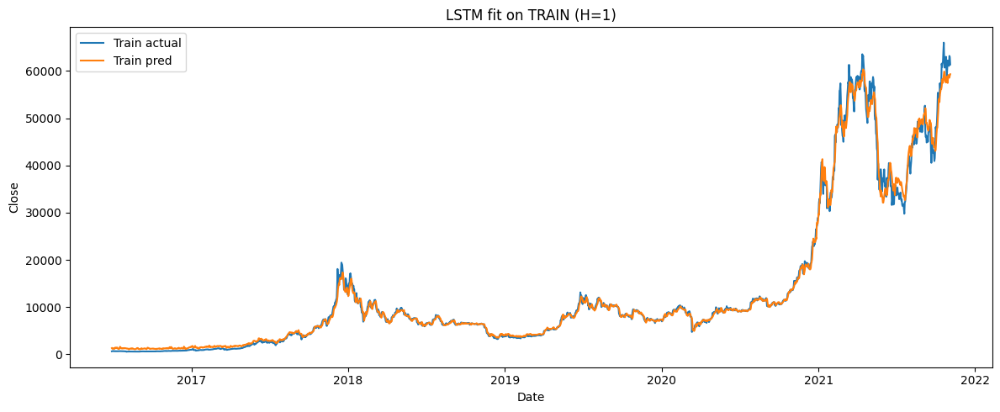

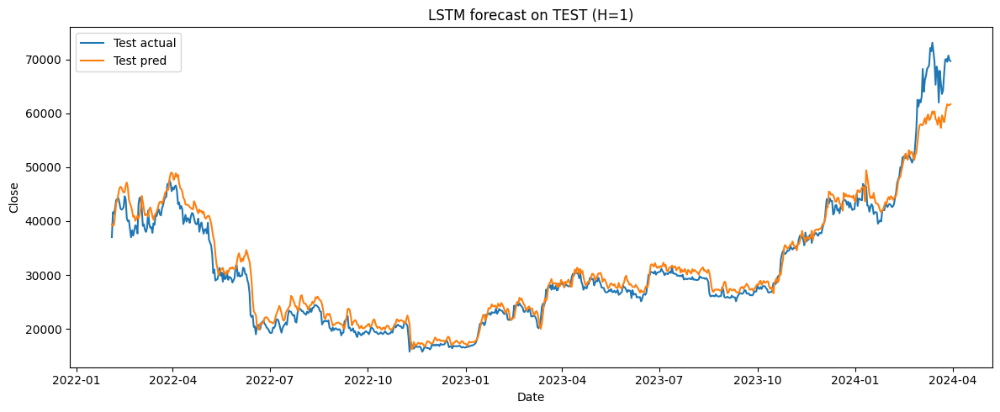

H=1 → Train RMSE=1200.68, MAE=680.45, R²=0.994 | Test RMSE=2491.88, MAE=1710.89, R²=0.955

Fitting final model for H=5 with: {'lookback': 90, 'units': 160, 'layers': 1, 'dropout': 0.3, 'opt': 'rmsprop', 'lr': 0.001517668, 'batch': 64, 'epochs': 150, 'pat': 5, 'scaler': 'standard'}
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3154 - val_loss: 0.2622 - learning_rate: 0.0015
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0240 - val_loss: 1.1970 - learning_rate: 0.0015
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0253 - val_loss: 0.6518 - learning_rate: 0.0015
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0138 - val_loss: 0.3174 - learning_rate: 7.5883e-04
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0224 - val_loss: 0.1373 - learning_rate: 7.5883e-04
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0099 - val_loss: 0.1151 - learning_rate: 7.5883e-04
Epoch 7/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/ste

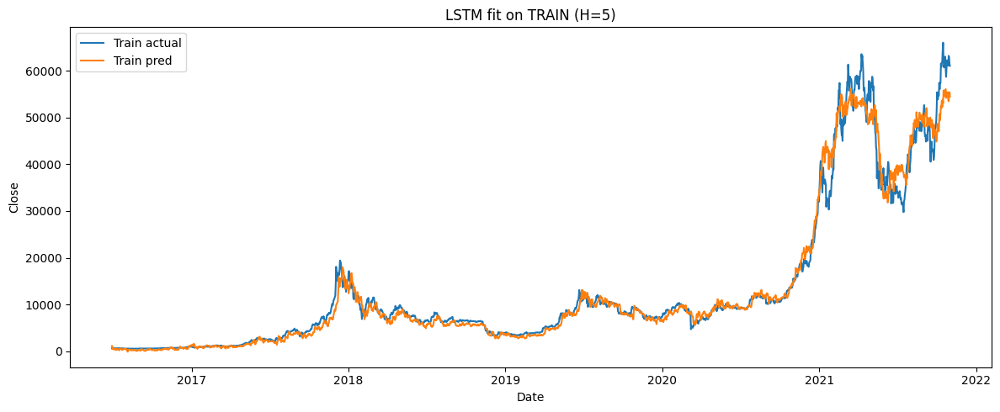

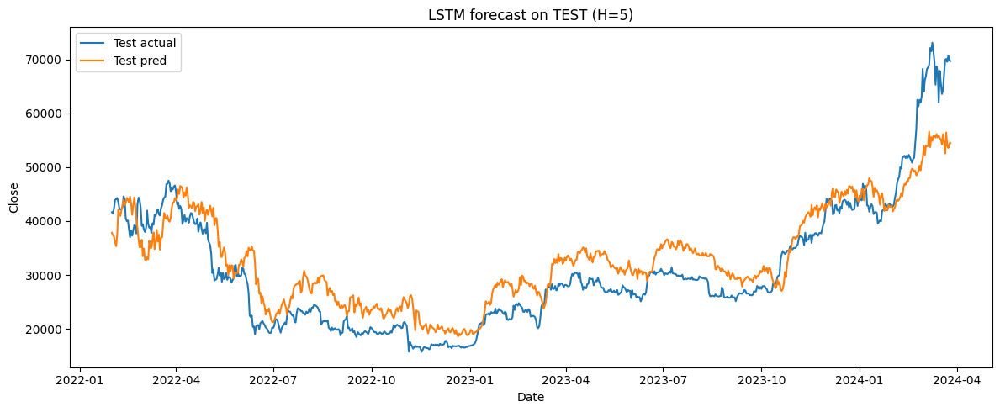

H=5 → Train RMSE=2324.52, MAE=1318.33, R²=0.977 | Test RMSE=5252.99, MAE=4395.92, R²=0.798

Fitting final model for H=15 with: {'lookback': 90, 'units': 128, 'layers': 1, 'dropout': 0.4, 'opt': 'rmsprop', 'lr': 0.005820295, 'batch': 128, 'epochs': 100, 'pat': 4, 'scaler': 'standard'}
Epoch 1/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 3.4061 - val_loss: 3.6496 - learning_rate: 0.0058
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1665 - val_loss: 1.2015 - learning_rate: 0.0058
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0450 - val_loss: 5.2500 - learning_rate: 0.0058
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0469 - val_loss: 6.3737 - learning_rate: 0.0058
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0497 - val_loss: 1.5454 - learning_rate: 0.0029
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0298 - val_loss: 0.5160 - learning_rate: 0.0029
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - l

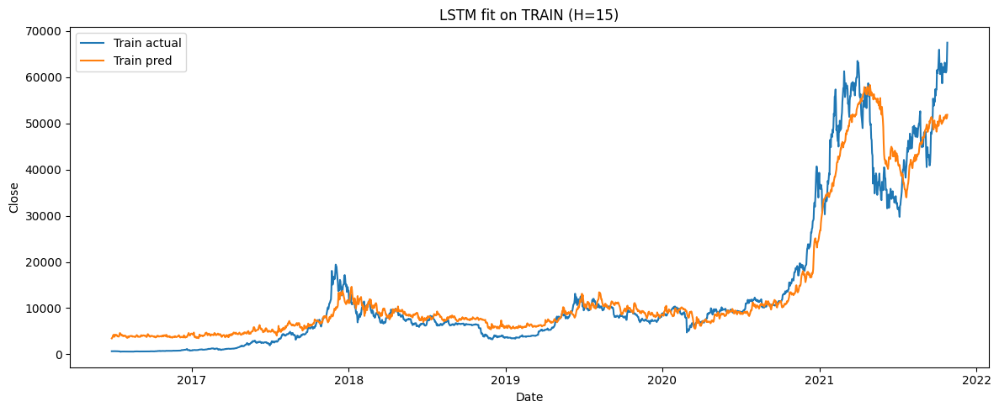

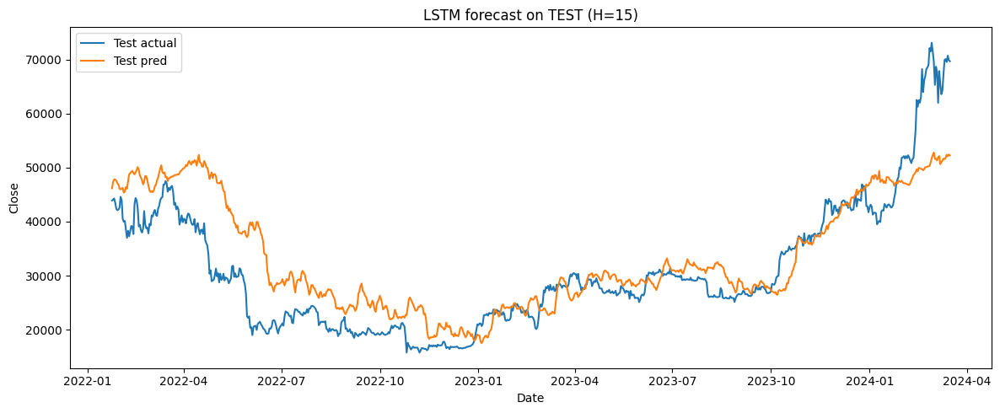

H=15 → Train RMSE=4245.62, MAE=2849.10, R²=0.926 | Test RMSE=6902.26, MAE=5059.82, R²=0.652


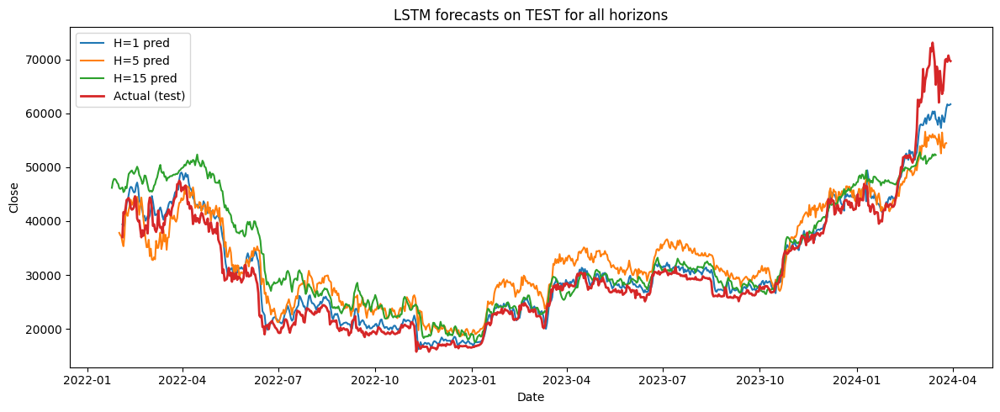

In [ ]:
# Final fit and  predictions on TRAIN/TEST

def fit_final_and_predict_forexog(df, FEATURES, H, best, train_frac=0.70,
                                  exog_method="naive", season=7):
    data = df.copy().sort_index()
    data["y"] = data["Close"].shift(-H)
    data = data.dropna(subset=["y"])

    cut = int(len(data) * train_frac)
    train, test = data.iloc[:cut].copy(), data.iloc[cut:].copy()

    Xsc, Ysc = get_scalers(best.get("scaler", "standard"))

    # Train scaling
    Xtr = Xsc.fit_transform(train[FEATURES].astype("float32"))
    ytr = Ysc.fit_transform(train["y"].values.reshape(-1, 1)).ravel()

    # Forecast exogs for the TEST block
    exog_cols = [c for c in FEATURES if c != "Close"]
    exog_fc = forecast_exogs_block(train, horizon=len(test),
                                   exog_cols=exog_cols,
                                   method=exog_method, season=season)

    Xte_raw = test[FEATURES].copy()
    for c in exog_cols:
        Xte_raw[c] = exog_fc[c].values
    Xte = Xsc.transform(Xte_raw.astype("float32"))
    yte = Ysc.transform(test["y"].values.reshape(-1, 1)).ravel()

    LB = best["lookback"]
    Xtr_seq, ytr_seq = make_windows(Xtr, ytr, LB)
    Xte_seq, yte_seq = make_windows(Xte, yte, LB)

    # Train model
    model = build_lstm(Xtr_seq.shape[-1], LB, best)
    es = tf.keras.callbacks.EarlyStopping("val_loss", patience=best["pat"], restore_best_weights=True)
    rl = tf.keras.callbacks.ReduceLROnPlateau("val_loss", factor=0.5,
                                              patience=max(1, best["pat"] // 2),
                                              min_lr=1e-5, verbose=0)

    model.fit(Xtr_seq, ytr_seq,
              validation_split=0.1,
              epochs=best["epochs"], batch_size=best["batch"],
              verbose=1, callbacks=[es, rl], shuffle=False)

    # Predictions
    pred_tr  = Ysc.inverse_transform(model.predict(Xtr_seq, verbose=0)).ravel()
    pred_te  = Ysc.inverse_transform(model.predict(Xte_seq, verbose=0)).ravel()
    ytr_true = Ysc.inverse_transform(ytr_seq.reshape(-1, 1)).ravel()
    yte_true = Ysc.inverse_transform(yte_seq.reshape(-1, 1)).ravel()

    # Align dates
    train_dates = train.index[LB - 1 : LB - 1 + len(ytr_seq)]
    test_dates  = test.index [LB - 1 : LB - 1 + len(yte_seq)]

    train_df = pd.DataFrame({"Date": train_dates, "y_true": ytr_true, "y_pred": pred_tr}).set_index("Date")
    test_df  = pd.DataFrame({"Date": test_dates,  "y_true": yte_true, "y_pred": pred_te}).set_index("Date")

    return model, train_df, test_df

def plot_fit(train_df, test_df, H):
    # TRAIN
    plt.figure(figsize=(12, 5))
    plt.plot(train_df.index, train_df["y_true"], label="Train actual")
    plt.plot(train_df.index, train_df["y_pred"], label="Train pred")
    plt.title(f"LSTM fit on TRAIN (H={H})"); plt.xlabel("Date"); plt.ylabel("Close")
    plt.legend(); plt.tight_layout(); plt.show()
    # TEST
    plt.figure(figsize=(12, 5))
    plt.plot(test_df.index, test_df["y_true"], label="Test actual")
    plt.plot(test_df.index, test_df["y_pred"], label="Test pred")
    plt.title(f"LSTM forecast on TEST (H={H})"); plt.xlabel("Date"); plt.ylabel("Close")
    plt.legend(); plt.tight_layout(); plt.show()
    # Metrics
    tr_rmse = rmse(train_df["y_true"], train_df["y_pred"])
    tr_mae  = mean_absolute_error(train_df["y_true"], train_df["y_pred"])
    tr_r2   = r2_score(train_df["y_true"], train_df["y_pred"])
    te_rmse = rmse(test_df["y_true"], test_df["y_pred"])
    te_mae  = mean_absolute_error(test_df["y_true"], test_df["y_pred"])
    te_r2   = r2_score(test_df["y_true"], test_df["y_pred"])
    print(f"H={H} → Train RMSE={tr_rmse:.2f}, MAE={tr_mae:.2f}, R²={tr_r2:.3f} | "
          f"Test RMSE={te_rmse:.2f}, MAE={te_mae:.2f}, R²={te_r2:.3f}")


assert isinstance(df.index, pd.DatetimeIndex), "df must be indexed by Date"
assert "Close" in df.columns, "df must contain 'Close'"
assert all(c in df.columns for c in FEATURES), f"Missing features: {set(FEATURES) - set(df.columns)}"


# Evaluation with rolling
HORIZONS = (1, 5, 15)
for H in HORIZONS:
    metrics_wf, (y_true_wf, y_pred_wf) = rolling_origin_eval_wf_forexog(
        df=df, FEATURES=FEATURES, H=H, params=results[H][0],
        train_frac=0.70, step=max(5, H)
    )
    print(f"H={H} (walk-origin) → RMSE={metrics_wf['RMSE']:.2f}, "
          f"MAE={metrics_wf['MAE']:.2f}, R²={metrics_wf['R2']:.3f}")


# Final fit  and plots

final_models = {}
for H in HORIZONS:
    best = results[H][0]
    print(f"\nFitting final model for H={H} with: {best}")
    model, tr_df, te_df = fit_final_and_predict_forexog(df, FEATURES, H, best, train_frac=0.70)
    final_models[H] = {"model": model, "train": tr_df, "test": te_df}
    plot_fit(tr_df, te_df, H)
    tr_df.to_csv(f"lstm_H{H}_train_preds.csv")
    te_df.to_csv(f"lstm_H{H}_test_preds.csv")

# overlay all TEST predictions
plt.figure(figsize=(12,5))
for H, out in final_models.items():
    plt.plot(out["test"].index, out["test"]["y_pred"], label=f"H={H} pred")
plt.plot(list(final_models.values())[0]["test"].index,
         list(final_models.values())[0]["test"]["y_true"],
         label="Actual (test)", linewidth=2)
plt.title("LSTM forecasts on TEST for all horizons")
plt.xlabel("Date"); plt.ylabel("Close"); plt.legend(); plt.tight_layout(); plt.show()



# Prophet

In [ ]:
# Configuration

TRAIN_FRAC       = 0.70
INTERVAL_WIDTH   = 0.80
REFIT_EVERY      = 7
HORIZONS         = (1, 5, 15)    # k-step-ahead evaluation
REG_PRIOR        = 0.10          # prior_scale for extra regressors
INITIAL_MIN_DAYS = 365           # minimum initial window for CV
PERIOD_DAYS      = 90            # spacing between CV cutoffs
CV_HORIZON_DAYS  = 15            # default CV horizon (used when PER_H_TUNING=False)
PER_H_TUNING     = True          # set False to tune once at maxHORIZONS for all

# Default grid
PARAM_GRID = {
    "changepoint_prior_scale": [0.001, 0.01, 0.1, 0.5],
    "seasonality_prior_scale": [0.01, 0.1, 1.0, 10.0],
    "seasonality_mode": ["additive", "multiplicative"],
    "changepoint_range": [0.80, 0.90, 0.95],
}


def _rmse(y, yhat):
    y, yhat = np.asarray(y, float), np.asarray(yhat, float)
    m = np.isfinite(y) & np.isfinite(yhat)
    return float(np.sqrt(mean_squared_error(y[m], yhat[m]))) if m.any() else np.nan

def _mae(y, yhat):
    y, yhat = np.asarray(y, float), np.asarray(yhat, float)
    m = np.isfinite(y) & np.isfinite(yhat)
    return float(np.mean(np.abs(y[m] - yhat[m]))) if m.any() else np.nan

def _r2(y, yhat):
    y, yhat = np.asarray(y, float), np.asarray(yhat, float)
    m = np.isfinite(y) & np.isfinite(yhat)
    return float(r2_score(y[m], yhat[m])) if m.sum() >= 2 else np.nan


def build_prophet_frame(raw_df: pd.DataFrame, exog_cols, target='Close', lag=1) -> pd.DataFrame:
    """
    Build a Prophet-ready frame with daily frequency and lagged exogenous variables.
    Ensures regressors are numeric and non-NaN in both fit and predict frames.
    """
    assert target in raw_df.columns, f"'{target}' not found in dataframe."
    exog_cols = [c for c in exog_cols if c in raw_df.columns]
    if not exog_cols:
        raise ValueError("No valid exogenous columns found in the dataframe.")

    dfp = raw_df[[target] + exog_cols].copy()
    # ensure numeric target
    dfp[target] = pd.to_numeric(dfp[target], errors='coerce')
    dfp['ds'] = raw_df.index
    dfp['y']  = dfp[target]
    dfp = dfp[['ds','y'] + exog_cols].sort_values('ds').reset_index(drop=True)

    # daily frequency
    dfp['ds'] = pd.to_datetime(dfp['ds'])
    dfp = dfp.set_index('ds').asfreq('D').reset_index()

    # lag exogenous to prevent look-ahead
    for c in exog_cols:
        dfp[c] = pd.to_numeric(dfp[c], errors='coerce').shift(lag)

    # impute exogs and drop remaining
    dfp[exog_cols] = dfp[exog_cols].ffill().bfill()
    dfp = dfp.dropna(subset=['y'] + exog_cols).reset_index(drop=True)
    return dfp

def train_test_split_prophet(dfp: pd.DataFrame, train_frac: float):
    cut = int(len(dfp) * train_frac)
    return dfp.iloc[:cut].copy(), dfp.iloc[cut:].copy()


In [ ]:
# Model

def make_model(params, exog_cols, interval_width=INTERVAL_WIDTH, reg_prior=REG_PRIOR) -> Prophet:
    m = Prophet(
        changepoint_prior_scale=params['changepoint_prior_scale'],
        seasonality_prior_scale=params['seasonality_prior_scale'],
        seasonality_mode=params['seasonality_mode'],
        changepoint_range=params['changepoint_range'],
        yearly_seasonality=True,
        weekly_seasonality=True,
        interval_width=interval_width,
        mcmc_samples=0,
    )

    m.add_seasonality(name='monthly', period=30.5, fourier_order=5)

    for reg in exog_cols:
        m.add_regressor(reg, standardize='auto', prior_scale=reg_prior)
    return m

def cv_grid_search_prophet(train_df: pd.DataFrame,
                           exog_cols,
                           param_grid=PARAM_GRID,
                           interval_width=INTERVAL_WIDTH,
                           initial_min_days=INITIAL_MIN_DAYS,
                           period_days=PERIOD_DAYS,
                           cv_horizon_days=CV_HORIZON_DAYS):
    """
    Robust grid search over a small Prophet grid using Prophet's time-series CV.
    Scores each combo by mean RMSE across CV cutoffs for a single horizon window.
    """
    n_train = len(train_df)
    if n_train < (initial_min_days + cv_horizon_days + period_days):

        initial_days = max(int(n_train * 0.60), min(initial_min_days, n_train // 2))
        period_days  = max(30, int(cv_horizon_days // 2))
    else:
        initial_days = initial_min_days

    combos = list(product(*param_grid.values()))
    keys   = list(param_grid.keys())
    best   = {"params": None, "rmse": np.inf}

    print(f"[CV] initial={initial_days}d  period={period_days}d  horizon={cv_horizon_days}d  (train n={n_train})")
    for i, vals in enumerate(combos, 1):
        params = dict(zip(keys, vals))
        try:
            m = make_model(params, exog_cols, interval_width=interval_width)
            m.fit(train_df[['ds','y'] + exog_cols])

            df_cv = cross_validation(
                model=m,
                initial=f"{initial_days} days",
                period=f"{period_days} days",
                horizon=f"{cv_horizon_days} days",
            )
            n_cutoffs = df_cv['cutoff'].nunique()
            df_p = performance_metrics(df_cv)
            rmse_mean = float(df_p['rmse'].mean())

            if rmse_mean < best["rmse"]:
                best["rmse"]   = rmse_mean
                best["params"] = params

            if i % 10 == 0:
                print(f"  tried {i}/{len(combos)} combos… best RMSE={best['rmse']:.3f} (cutoffs={n_cutoffs})")

        except Exception as e:
            print(f"  combo {i}/{len(combos)} failed: {e}")
            continue

    if best["params"] is None:
        raise RuntimeError("Grid search failed for all combinations. Consider relaxing CV settings or grid size.")
    print(f"[CV] Best params: {best['params']}  |  mean RMSE={best['rmse']:.3f}")
    return best["params"], best["rmse"]


In [ ]:

# Evaluation and plotting

def plot_in_out_sample(model: Prophet,
                       train_df: pd.DataFrame,
                       test_df:  pd.DataFrame,
                       exog_cols,
                       title_prefix: str = "Prophet"):
    """In-sample fit (train) and out-of-sample forecast (test) with native Prophet intervals."""
    exog_cols = list(exog_cols) if exog_cols is not None else []
    cols_train = ['ds'] + exog_cols
    cols_test  = ['ds'] + exog_cols

    # In-sample
    fcst_tr = model.predict(train_df[cols_train].copy())
    merged_tr = train_df[['ds','y']].merge(
        fcst_tr[['ds','yhat','yhat_lower','yhat_upper']], on='ds', how='inner'
    )
    tr_rmse = _rmse(merged_tr['y'], merged_tr['yhat'])
    tr_mae  = _mae(merged_tr['y'], merged_tr['yhat'])
    tr_r2   = _r2(merged_tr['y'], merged_tr['yhat'])

    # Out-of-sample
    fcst_te = model.predict(test_df[cols_test].copy())
    merged_te = test_df[['ds','y']].merge(
        fcst_te[['ds','yhat','yhat_lower','yhat_upper']], on='ds', how='inner'
    )
    te_rmse = _rmse(merged_te['y'], merged_te['yhat'])
    te_mae  = _mae(merged_te['y'], merged_te['yhat'])
    te_r2   = _r2(merged_te['y'], merged_te['yhat'])


    fig, axes = plt.subplots(2, 1, figsize=(12, 7), sharex=False)

    ax = axes[0]
    ax.plot(merged_tr['ds'], merged_tr['y'],    label='True', linewidth=1)
    ax.plot(merged_tr['ds'], merged_tr['yhat'], label='Fitted', linewidth=1)
    ax.fill_between(merged_tr['ds'], merged_tr['yhat_lower'], merged_tr['yhat_upper'],
                    alpha=0.20, label='Native interval')
    ax.set_title(f"{title_prefix} — In-sample (train)  |  RMSE={tr_rmse:.1f}  MAE={tr_mae:.1f}  R²={tr_r2:.3f}")
    ax.legend(); ax.grid(True, alpha=0.25)
    ax.xaxis.set_major_locator(mdates.AutoDateLocator())
    ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(ax.xaxis.get_major_locator()))

    ax = axes[1]
    ax.plot(merged_te['ds'], merged_te['y'],    label='True', linewidth=1)
    ax.plot(merged_te['ds'], merged_te['yhat'], label='Forecast', linewidth=1)
    ax.fill_between(merged_te['ds'], merged_te['yhat_lower'], merged_te['yhat_upper'],
                    alpha=0.20, label='Native interval')
    ax.set_title(f"{title_prefix} — Out-of-sample (test)  |  RMSE={te_rmse:.1f}  MAE={te_mae:.1f}  R²={te_r2:.3f}")
    ax.legend(); ax.grid(True, alpha=0.25)
    ax.xaxis.set_major_locator(mdates.AutoDateLocator())
    ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(ax.xaxis.get_major_locator()))

    plt.tight_layout(); plt.show()

    return {
        "train": {"df": merged_tr, "RMSE": tr_rmse, "MAE": tr_mae, "R2": tr_r2},
        "test":  {"df": merged_te, "RMSE": te_rmse, "MAE": te_mae, "R2": te_r2},
    }

def rolling_k_ahead(df_prophet: pd.DataFrame,
                    exog_cols,
                    train_len: int,
                    best_params: dict,
                    horizons=(1,5,15),
                    refit_every=REFIT_EVERY,
                    interval_width=INTERVAL_WIDTH,
                    reg_prior=REG_PRIOR):

    need = {'ds','y', *exog_cols}
    missing = need - set(df_prophet.columns)
    if missing:
        raise ValueError(f"df_prophet missing required columns: {sorted(missing)}")

    preds = {h: [] for h in horizons}
    dates = {h: [] for h in horizons}
    ytrue = {h: [] for h in horizons}

    i = int(train_len)
    max_h = max(horizons)

    while i + max_h - 1 < len(df_prophet):
        hist = df_prophet.iloc[:i].copy()

        if isinstance(best_params, dict) and all(isinstance(k, int) for k in best_params.keys()):
            # per-H params dict
            future_full = df_prophet[['ds'] + exog_cols].iloc[i:i+max_h].copy()
            fcst_by_h = {}
            for h in horizons:
                m = make_model(best_params[h], exog_cols, interval_width=interval_width, reg_prior=reg_prior)
                m.fit(hist[['ds','y'] + exog_cols])
                fcst = m.predict(future_full)[['ds','yhat']].reset_index(drop=True)
                fcst_by_h[h] = fcst
            # collect
            for h in horizons:
                idx = h - 1
                dates[h].append(fcst_by_h[h].loc[idx, 'ds'])
                preds[h].append(float(fcst_by_h[h].loc[idx, 'yhat']))
                ytrue[h].append(float(df_prophet['y'].iloc[i + idx]))
        else:
            # params dict for all horizons
            params_to_use = best_params
            m = make_model(params_to_use, exog_cols, interval_width=interval_width, reg_prior=reg_prior)
            m.fit(hist[['ds','y'] + exog_cols])

            future = df_prophet[['ds'] + exog_cols].iloc[i:i+max_h].copy()
            fcst   = m.predict(future)[['ds','yhat']].reset_index(drop=True)

            for h in horizons:
                idx = h - 1
                dates[h].append(fcst.loc[idx, 'ds'])
                preds[h].append(float(fcst.loc[idx, 'yhat']))
                ytrue[h].append(float(df_prophet['y'].iloc[i + idx]))

        i += refit_every

    out = {h: pd.DataFrame({'ds': dates[h], 'y_true': ytrue[h], 'y_pred': preds[h]})
           for h in horizons}
    return out

def plot_rolling(series_dict, title_prefix="Prophet — Rolling forecasts"):
    Hs = sorted(series_dict.keys())
    n  = len(Hs)
    fig, axes = plt.subplots(n, 1, figsize=(12, 3.0*n), sharex=False)
    if n == 1: axes = [axes]

    for ax, h in zip(axes, Hs):
        dfh  = series_dict[h].sort_values('ds')
        rmse = _rmse(dfh['y_true'], dfh['y_pred'])
        mae  = _mae(dfh['y_true'], dfh['y_pred'])
        r2   = _r2(dfh['y_true'], dfh['y_pred'])
        ax.plot(dfh['ds'], dfh['y_true'], label='True', linewidth=1)
        ax.plot(dfh['ds'], dfh['y_pred'], label=f'Forecast (H={h}d)', linewidth=1)
        ax.set_title(f"{title_prefix} — H={h}d | RMSE={rmse:.1f} MAE={mae:.1f} R²={r2:.3f}")
        ax.legend(); ax.grid(True, alpha=0.3)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator())
        ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(ax.xaxis.get_major_locator()))
    plt.tight_layout(); plt.show()

    # Overlay of predictions
    plt.figure(figsize=(12,4))
    for h in Hs:
        dfh = series_dict[h].sort_values('ds')
        plt.plot(dfh['ds'], dfh['y_pred'], label=f'H={h}d')
    merged_truth = pd.concat([series_dict[h][['ds','y_true']] for h in Hs]).drop_duplicates('ds').sort_values('ds')
    plt.plot(merged_truth['ds'], merged_truth['y_true'], alpha=0.35, label='True')
    plt.title(f"{title_prefix} — Overlay"); plt.legend(); plt.grid(True, alpha=0.3)
    plt.tight_layout(); plt.show()



INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/od4qsirz.json


TRAIN: 2016-04-01 → 2021-11-06  (n=2046)
TEST : 2021-11-07 → 2024-04-01  (n=877)
[CV] Per-horizon tuning enabled.
[CV] initial=365d  period=90d  horizon=1d  (train n=2046)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/x0z8dinc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64271', 'data', 'file=/tmp/tmpcaraqbnc/od4qsirz.json', 'init=/tmp/tmpcaraqbnc/x0z8dinc.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelmephcf3m/prophet_model-20250906115813.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:58:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:58:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-30 00:00:00 and 2021-11-05 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_jhxm0ig.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_b5qy79n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1491', 'data', 'file=/tmp/tmpcaraqbnc/_jhxm0ig.json', 'init=/tmp/tmpcaraqbnc/_b5qy79n.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelch6thsk0/prophet_model-20250906115815.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:58:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:58:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
11:58:15 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/g95u3la7.json
DEB

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wj39w2p5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/thkk_oqf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4755', 'data', 'file=/tmp/tmpcaraqbnc/wj39w2p5.json', 'init=/tmp/tmpcaraqbnc/thkk_oqf.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelgadtiz0v/prophet_model-20250906115842.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:58:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:58:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
11:58:42 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bmadcnkg.json
DEB

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3igs5f44.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/g1kmrkyb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37679', 'data', 'file=/tmp/tmpcaraqbnc/3igs5f44.json', 'init=/tmp/tmpcaraqbnc/g1kmrkyb.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelm92hzv5o/prophet_model-20250906115855.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:58:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:58:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
11:58:55 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cqv17xox.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/l18r7b2s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vf4zb4xo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54507', 'data', 'file=/tmp/tmpcaraqbnc/l18r7b2s.json', 'init=/tmp/tmpcaraqbnc/vf4zb4xo.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelr9a44af7/prophet_model-20250906115908.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:59:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:59:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
11:59:08 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wxlx0pv5.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4ea55bnv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/11voevjq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73736', 'data', 'file=/tmp/tmpcaraqbnc/4ea55bnv.json', 'init=/tmp/tmpcaraqbnc/11voevjq.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model4euqmzy9/prophet_model-20250906115941.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:59:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:59:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
11:59:41 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/i2bdoho7.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kjr0y1c0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/mdfqrpie.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44003', 'data', 'file=/tmp/tmpcaraqbnc/kjr0y1c0.json', 'init=/tmp/tmpcaraqbnc/mdfqrpie.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelavngacsm/prophet_model-20250906115955.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:59:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:59:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
11:59:55 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5icu2pz8.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ugdtzo8h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/o7q9auby.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42155', 'data', 'file=/tmp/tmpcaraqbnc/ugdtzo8h.json', 'init=/tmp/tmpcaraqbnc/o7q9auby.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelxe9q8l60/prophet_model-20250906120008.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:00:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:00:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:00:08 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/hqz6gbw1.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lf3nyxjk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jrdc541x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=228', 'data', 'file=/tmp/tmpcaraqbnc/lf3nyxjk.json', 'init=/tmp/tmpcaraqbnc/jrdc541x.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modell6f0fzp5/prophet_model-20250906120032.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:00:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:00:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:00:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/l84ftasm.json
DEBU

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xvm3x893.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8mwa1mma.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95978', 'data', 'file=/tmp/tmpcaraqbnc/xvm3x893.json', 'init=/tmp/tmpcaraqbnc/8mwa1mma.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model4eyf1ddv/prophet_model-20250906120045.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:00:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:00:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:00:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3lfds26a.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xv1ez7u_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xr_fgyih.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42359', 'data', 'file=/tmp/tmpcaraqbnc/xv1ez7u_.json', 'init=/tmp/tmpcaraqbnc/xr_fgyih.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelrhz9mz6y/prophet_model-20250906120059.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:00:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:00:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:00:59 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kwbkx_dt.json
DE

  tried 10/96 combos… best RMSE=1789.247 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ijja9z05.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32687', 'data', 'file=/tmp/tmpcaraqbnc/y4ooosed.json', 'init=/tmp/tmpcaraqbnc/ijja9z05.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelygwg2oem/prophet_model-20250906120123.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:01:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:01:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-30 00:00:00 and 2021-11-05 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wlf6fmq3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2bc3z5zv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94717', 'data', 'file=/tmp/tmpcaraqbnc/wlf6fmq3.json', 'init=/tmp/tmpcaraqbnc/2bc3z5zv.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelhl08cdgq/prophet_model-20250906120123.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:01:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:01:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:01:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tm2eup16.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/y0nkg63y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5o4gaoaw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44279', 'data', 'file=/tmp/tmpcaraqbnc/y0nkg63y.json', 'init=/tmp/tmpcaraqbnc/5o4gaoaw.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelw8w9in_l/prophet_model-20250906120138.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:01:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:01:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:01:38 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/n6yul3pa.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/hmd74ddb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_lagocs6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16112', 'data', 'file=/tmp/tmpcaraqbnc/hmd74ddb.json', 'init=/tmp/tmpcaraqbnc/_lagocs6.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelz6z6l4gi/prophet_model-20250906120153.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:01:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:01:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:01:53 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/p2cv87a1.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/darhsnzq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ssgmaqsr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52879', 'data', 'file=/tmp/tmpcaraqbnc/darhsnzq.json', 'init=/tmp/tmpcaraqbnc/ssgmaqsr.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelukro3n5h/prophet_model-20250906120216.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:02:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:02:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:02:16 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cguvsxoh.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/j0mn_bir.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/b5vbvna5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49467', 'data', 'file=/tmp/tmpcaraqbnc/j0mn_bir.json', 'init=/tmp/tmpcaraqbnc/b5vbvna5.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model1zh3yglp/prophet_model-20250906120229.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:02:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:02:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:02:29 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jed8_9f2.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qmfgx1i0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_3_lbye5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25241', 'data', 'file=/tmp/tmpcaraqbnc/qmfgx1i0.json', 'init=/tmp/tmpcaraqbnc/_3_lbye5.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model8gu8n4jx/prophet_model-20250906120243.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:02:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:02:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:02:43 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_y55k0dv.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/yp5rd4is.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/axgdalj_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57812', 'data', 'file=/tmp/tmpcaraqbnc/yp5rd4is.json', 'init=/tmp/tmpcaraqbnc/axgdalj_.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model6fz0hy58/prophet_model-20250906120314.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:03:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:03:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:03:14 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/k35l7g7k.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3nbq2odx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tam32ysp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3660', 'data', 'file=/tmp/tmpcaraqbnc/3nbq2odx.json', 'init=/tmp/tmpcaraqbnc/tam32ysp.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model3t1_fcgt/prophet_model-20250906120329.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:03:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:03:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:03:29 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/j78yqdnr.json
DEB

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/et4gbfl2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cdqak621.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86367', 'data', 'file=/tmp/tmpcaraqbnc/et4gbfl2.json', 'init=/tmp/tmpcaraqbnc/cdqak621.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeld6lnrqan/prophet_model-20250906120344.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:03:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:03:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:03:44 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6z822x99.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/e4v0kf79.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6bsbh6zv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5383', 'data', 'file=/tmp/tmpcaraqbnc/e4v0kf79.json', 'init=/tmp/tmpcaraqbnc/6bsbh6zv.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelt_bmmwpk/prophet_model-20250906120409.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:04:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:04:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:04:09 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5h89avz0.json
DEB

  tried 20/96 combos… best RMSE=1781.338 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/23sjhhn3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11668', 'data', 'file=/tmp/tmpcaraqbnc/9w159val.json', 'init=/tmp/tmpcaraqbnc/23sjhhn3.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model8zjvn5cm/prophet_model-20250906120423.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:04:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:04:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-30 00:00:00 and 2021-11-05 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ens6fvan.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2alz_b_p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57846', 'data', 'file=/tmp/tmpcaraqbnc/ens6fvan.json', 'init=/tmp/tmpcaraqbnc/2alz_b_p.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeld042o9nl/prophet_model-20250906120424.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:04:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:04:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:04:24 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/db4wqri0.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/k7uuhrok.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zpuolt6r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35172', 'data', 'file=/tmp/tmpcaraqbnc/k7uuhrok.json', 'init=/tmp/tmpcaraqbnc/zpuolt6r.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelitly41er/prophet_model-20250906120439.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:04:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:04:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:04:39 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6_zlge36.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tc78e1pw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/oujdudy9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42501', 'data', 'file=/tmp/tmpcaraqbnc/tc78e1pw.json', 'init=/tmp/tmpcaraqbnc/oujdudy9.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modells6qjgz0/prophet_model-20250906120506.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:05:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:05:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:05:06 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zsk0bmq1.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/v9o283n2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6_snn_8h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2255', 'data', 'file=/tmp/tmpcaraqbnc/v9o283n2.json', 'init=/tmp/tmpcaraqbnc/6_snn_8h.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelen7u1e2c/prophet_model-20250906120523.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:05:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:05:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:05:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6dfylnpg.json
DEB

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vkl5s47q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9tx3kjhy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77826', 'data', 'file=/tmp/tmpcaraqbnc/vkl5s47q.json', 'init=/tmp/tmpcaraqbnc/9tx3kjhy.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelf5gjfpk6/prophet_model-20250906120539.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:05:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:05:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ltx6qyn4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nmf7chl0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lpzc01om.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/g9cneyxf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52453', 'data', 'file=/tmp/tmpcaraqbnc/lpzc01om.json', 'init=/tmp/tmpcaraqbnc/g9cneyxf.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model0j519stw/prophet_model-20250906120551.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:05:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:05:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/g5pty3e3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dhe94jdf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/i7813dfk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3ejnm83b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21728', 'data', 'file=/tmp/tmpcaraqbnc/i7813dfk.json', 'init=/tmp/tmpcaraqbnc/3ejnm83b.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelt5lp_w4l/prophet_model-20250906120603.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:06:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:06:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1va1596e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/39av1i9l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dc8_cs8x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1_nrcsif.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39991', 'data', 'file=/tmp/tmpcaraqbnc/dc8_cs8x.json', 'init=/tmp/tmpcaraqbnc/1_nrcsif.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeld3lmtnme/prophet_model-20250906120616.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:06:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:06:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8qv2ft7_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qci2gawu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4d9f5o9u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vsngwpnq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42900', 'data', 'file=/tmp/tmpcaraqbnc/4d9f5o9u.json', 'init=/tmp/tmpcaraqbnc/vsngwpnq.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelu2vjl4dh/prophet_model-20250906120629.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:06:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:06:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/b7nrccj0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/c1nzeds4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1tzwplfm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ecq1ol5o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84519', 'data', 'file=/tmp/tmpcaraqbnc/1tzwplfm.json', 'init=/tmp/tmpcaraqbnc/ecq1ol5o.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelrp2_ivc_/prophet_model-20250906120643.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:06:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:06:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/sk5w194s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/86yg71oy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 30/96 combos… best RMSE=1781.338 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/izri1rk5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76282', 'data', 'file=/tmp/tmpcaraqbnc/7zzz0mr4.json', 'init=/tmp/tmpcaraqbnc/izri1rk5.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelpikwnug1/prophet_model-20250906120655.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:06:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:06:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-30 00:00:00 and 2021-11-05 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9trwf1w5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8gkl7lkt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8771', 'data', 'file=/tmp/tmpcaraqbnc/9trwf1w5.json', 'init=/tmp/tmpcaraqbnc/8gkl7lkt.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelsy1i2xwz/prophet_model-20250906120656.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:06:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:06:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bwio2q0k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tdbkjeeg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jhmp5wlc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gh6ce48b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49191', 'data', 'file=/tmp/tmpcaraqbnc/jhmp5wlc.json', 'init=/tmp/tmpcaraqbnc/gh6ce48b.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model4pplqg1_/prophet_model-20250906120708.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:07:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:07:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/k643eiek.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/10dc0mq9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/hz8c_hkq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/in8ykhp1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82275', 'data', 'file=/tmp/tmpcaraqbnc/hz8c_hkq.json', 'init=/tmp/tmpcaraqbnc/in8ykhp1.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelzy5juyht/prophet_model-20250906120721.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:07:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:07:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/hjieeg0o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/l8g1tnf4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/yw8f94pk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xs8_b75v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87286', 'data', 'file=/tmp/tmpcaraqbnc/yw8f94pk.json', 'init=/tmp/tmpcaraqbnc/xs8_b75v.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelkmfzngcx/prophet_model-20250906120733.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:07:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:07:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/71a0pixf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4qznvje3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/w50cm3gz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/poa00kl2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67066', 'data', 'file=/tmp/tmpcaraqbnc/w50cm3gz.json', 'init=/tmp/tmpcaraqbnc/poa00kl2.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model99kqgfmn/prophet_model-20250906120747.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:07:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:07:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/opgb31gh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/o_072jkv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_ivirblk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/p5qz_hnb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55966', 'data', 'file=/tmp/tmpcaraqbnc/_ivirblk.json', 'init=/tmp/tmpcaraqbnc/p5qz_hnb.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model3_f3rpxt/prophet_model-20250906120802.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:08:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:08:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_dxl_n0p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9sms07iz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6grel0r5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fhwudunn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49934', 'data', 'file=/tmp/tmpcaraqbnc/6grel0r5.json', 'init=/tmp/tmpcaraqbnc/fhwudunn.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeloub012u6/prophet_model-20250906120815.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:08:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:08:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/obqq_hq9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/iatvbpbu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/09tv3sf2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/s1fb0_l4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30524', 'data', 'file=/tmp/tmpcaraqbnc/09tv3sf2.json', 'init=/tmp/tmpcaraqbnc/s1fb0_l4.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modele301gexq/prophet_model-20250906120828.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:08:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:08:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1g4aa_ii.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vu4mzkxo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bb542mjd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/uxyyxsjd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83243', 'data', 'file=/tmp/tmpcaraqbnc/bb542mjd.json', 'init=/tmp/tmpcaraqbnc/uxyyxsjd.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelhm829gox/prophet_model-20250906120840.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:08:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:08:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1s5jsjzn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/asg1xi7q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/e_ycbvop.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wappodmr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98494', 'data', 'file=/tmp/tmpcaraqbnc/e_ycbvop.json', 'init=/tmp/tmpcaraqbnc/wappodmr.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelrt8nfwpn/prophet_model-20250906120853.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:08:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:08:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vn0h67ct.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/t8wyppjx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 40/96 combos… best RMSE=1781.338 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/eknt_pw8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8825', 'data', 'file=/tmp/tmpcaraqbnc/h91_q4n4.json', 'init=/tmp/tmpcaraqbnc/eknt_pw8.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model0m5acvqw/prophet_model-20250906120905.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:09:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:09:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-30 00:00:00 and 2021-11-05 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/32ezame8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0p1d8apx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49537', 'data', 'file=/tmp/tmpcaraqbnc/32ezame8.json', 'init=/tmp/tmpcaraqbnc/0p1d8apx.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelqclxnl8l/prophet_model-20250906120906.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:09:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:09:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/os1n6m8j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/e1rxt8ms.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xh5hc47s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1ax0wzc2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39743', 'data', 'file=/tmp/tmpcaraqbnc/xh5hc47s.json', 'init=/tmp/tmpcaraqbnc/1ax0wzc2.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelbucy8edq/prophet_model-20250906120921.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:09:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:09:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/hu9fk2uk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_b2sl_ec.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/mm3nbokn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/o2kk2cnf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90177', 'data', 'file=/tmp/tmpcaraqbnc/mm3nbokn.json', 'init=/tmp/tmpcaraqbnc/o2kk2cnf.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model0a11xhli/prophet_model-20250906120934.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:09:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:09:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zdr1vkwx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/i871un0r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/co24xmml.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6apdftga.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80426', 'data', 'file=/tmp/tmpcaraqbnc/co24xmml.json', 'init=/tmp/tmpcaraqbnc/6apdftga.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeltdntj10d/prophet_model-20250906120947.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:09:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:09:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_6whsidk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jmi_b7o6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nkxrjv71.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/f8nwik2_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72183', 'data', 'file=/tmp/tmpcaraqbnc/nkxrjv71.json', 'init=/tmp/tmpcaraqbnc/f8nwik2_.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelslqgim9q/prophet_model-20250906120959.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:09:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:09:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/h4cm6xw8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/42op39n8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ow3kmn7r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/e25gg3rq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26027', 'data', 'file=/tmp/tmpcaraqbnc/ow3kmn7r.json', 'init=/tmp/tmpcaraqbnc/e25gg3rq.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelhhxi6z0t/prophet_model-20250906121012.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:10:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:10:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rze9kkff.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_8v7eygs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qoh3gx98.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vnnf78o2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15784', 'data', 'file=/tmp/tmpcaraqbnc/qoh3gx98.json', 'init=/tmp/tmpcaraqbnc/vnnf78o2.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modela20k3aj8/prophet_model-20250906121026.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:10:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:10:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/densntjp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ixqkm400.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_ybyn69y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/apkjcn_v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37004', 'data', 'file=/tmp/tmpcaraqbnc/_ybyn69y.json', 'init=/tmp/tmpcaraqbnc/apkjcn_v.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model3id_uptv/prophet_model-20250906121040.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:10:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:10:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lj8wnrxl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/o8k46yxv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/989s53td.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1459v95c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5908', 'data', 'file=/tmp/tmpcaraqbnc/989s53td.json', 'init=/tmp/tmpcaraqbnc/1459v95c.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modela59r9h8m/prophet_model-20250906121056.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:10:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:10:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/yrvpc846.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wwx7tsm9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nihle92g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/e72mrs36.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52833', 'data', 'file=/tmp/tmpcaraqbnc/nihle92g.json', 'init=/tmp/tmpcaraqbnc/e72mrs36.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model0109ak27/prophet_model-20250906121117.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:11:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:11:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/o7n81pmj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4k3qxk_n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 50/96 combos… best RMSE=1781.338 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/p9pt58ki.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85076', 'data', 'file=/tmp/tmpcaraqbnc/u5fwh_k9.json', 'init=/tmp/tmpcaraqbnc/p9pt58ki.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modell0hrnppc/prophet_model-20250906121138.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:11:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:11:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-30 00:00:00 and 2021-11-05 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3r9umwlp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3mkbt3fn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64860', 'data', 'file=/tmp/tmpcaraqbnc/3r9umwlp.json', 'init=/tmp/tmpcaraqbnc/3mkbt3fn.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model_lbzfpp0/prophet_model-20250906121140.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:11:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:11:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vcu56yyn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9cs9guyo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/n72zw5l2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kob9jk67.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74807', 'data', 'file=/tmp/tmpcaraqbnc/n72zw5l2.json', 'init=/tmp/tmpcaraqbnc/kob9jk67.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model5c391akr/prophet_model-20250906121202.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:12:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:12:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/d19poyf_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/uownz61r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dubmxibn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kf8xr53b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13825', 'data', 'file=/tmp/tmpcaraqbnc/dubmxibn.json', 'init=/tmp/tmpcaraqbnc/kf8xr53b.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeljpvw6rqc/prophet_model-20250906121224.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:12:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:12:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/a60w9a8e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/h82_gscx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2vjrinr5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/l5p3gnl8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3729', 'data', 'file=/tmp/tmpcaraqbnc/2vjrinr5.json', 'init=/tmp/tmpcaraqbnc/l5p3gnl8.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelxnm20c00/prophet_model-20250906121247.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:12:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:12:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_j4cvag7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ebp6nzyc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/epjpt4af.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/19dvl4ly.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83839', 'data', 'file=/tmp/tmpcaraqbnc/epjpt4af.json', 'init=/tmp/tmpcaraqbnc/19dvl4ly.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelj90biy8x/prophet_model-20250906121309.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:13:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:13:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9fvnerl9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ocfamkft.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0mb62bjw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zrpgd8w7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52572', 'data', 'file=/tmp/tmpcaraqbnc/0mb62bjw.json', 'init=/tmp/tmpcaraqbnc/zrpgd8w7.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelfo2h8b3_/prophet_model-20250906121333.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:13:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:13:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/71obeblq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ae6i8ih6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ci5l3bf2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/sd8lrljx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18251', 'data', 'file=/tmp/tmpcaraqbnc/ci5l3bf2.json', 'init=/tmp/tmpcaraqbnc/sd8lrljx.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelxv4_uz_n/prophet_model-20250906121356.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:13:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:13:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3uk5wbzo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jrgtb22x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_kg_yq7w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/hgi7gv57.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38064', 'data', 'file=/tmp/tmpcaraqbnc/_kg_yq7w.json', 'init=/tmp/tmpcaraqbnc/hgi7gv57.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeltczn53h6/prophet_model-20250906121419.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:14:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:14:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/j2fzmwe7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/iuu68rqi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zlh1kh46.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wd4z__6q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50560', 'data', 'file=/tmp/tmpcaraqbnc/zlh1kh46.json', 'init=/tmp/tmpcaraqbnc/wd4z__6q.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model7a2nwwyj/prophet_model-20250906121440.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:14:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:14:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/oxmm2c_2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kwta10ux.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/840nzxwl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_pprzhtn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57586', 'data', 'file=/tmp/tmpcaraqbnc/840nzxwl.json', 'init=/tmp/tmpcaraqbnc/_pprzhtn.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelrfvgri1n/prophet_model-20250906121504.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:15:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:15:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pkz_9qv7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nusu6vv9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 60/96 combos… best RMSE=1063.585 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fcn9bjcm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43997', 'data', 'file=/tmp/tmpcaraqbnc/079omi65.json', 'init=/tmp/tmpcaraqbnc/fcn9bjcm.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model2d43o6re/prophet_model-20250906121528.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:15:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:15:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-30 00:00:00 and 2021-11-05 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cwwejjzj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kssn7y3e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34307', 'data', 'file=/tmp/tmpcaraqbnc/cwwejjzj.json', 'init=/tmp/tmpcaraqbnc/kssn7y3e.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model1turn9r4/prophet_model-20250906121530.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:15:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:15:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/sp3squb6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2s8pgmv4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zge_x1dj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ya0mzb94.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86695', 'data', 'file=/tmp/tmpcaraqbnc/zge_x1dj.json', 'init=/tmp/tmpcaraqbnc/ya0mzb94.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeln3gor914/prophet_model-20250906121553.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:15:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:15:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/w8q_7ots.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_ec36wxi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xjmzz1s8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vqsdney9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59301', 'data', 'file=/tmp/tmpcaraqbnc/xjmzz1s8.json', 'init=/tmp/tmpcaraqbnc/vqsdney9.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelkrq4rqsx/prophet_model-20250906121616.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:16:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:16:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bn3mlkl8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/afwezd2j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0isuorgg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5tpadpiz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9611', 'data', 'file=/tmp/tmpcaraqbnc/0isuorgg.json', 'init=/tmp/tmpcaraqbnc/5tpadpiz.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelwaivmrb9/prophet_model-20250906121639.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:16:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:16:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7ogrl_bk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/j84rtytw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ymir0b3r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/n3dor8jp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89726', 'data', 'file=/tmp/tmpcaraqbnc/ymir0b3r.json', 'init=/tmp/tmpcaraqbnc/n3dor8jp.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelzrrrn9nz/prophet_model-20250906121702.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:17:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:17:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/988v0fxm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tesrnhj8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xa3jye68.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/p9gidv2l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77983', 'data', 'file=/tmp/tmpcaraqbnc/xa3jye68.json', 'init=/tmp/tmpcaraqbnc/p9gidv2l.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelnd3os22f/prophet_model-20250906121727.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:17:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:17:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jn_mji5k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lh5t3hum.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2p4pngu3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0pewq1_1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22245', 'data', 'file=/tmp/tmpcaraqbnc/2p4pngu3.json', 'init=/tmp/tmpcaraqbnc/0pewq1_1.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model05sih9pg/prophet_model-20250906121752.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:17:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:17:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/b2b6er6l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/q82kre7t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kv0qi1ds.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/q2681xfc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11035', 'data', 'file=/tmp/tmpcaraqbnc/kv0qi1ds.json', 'init=/tmp/tmpcaraqbnc/q2681xfc.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelg138o4sf/prophet_model-20250906121813.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:18:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:18:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5tabke1f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gi5mc8qu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3g82jugk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/agwpoxj9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44502', 'data', 'file=/tmp/tmpcaraqbnc/3g82jugk.json', 'init=/tmp/tmpcaraqbnc/agwpoxj9.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelppqtaxuh/prophet_model-20250906121836.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:18:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:18:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_cssvs65.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7ap6yrid.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/z7k6l8zr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/i_ig1keq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24949', 'data', 'file=/tmp/tmpcaraqbnc/z7k6l8zr.json', 'init=/tmp/tmpcaraqbnc/i_ig1keq.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeli9x4yr49/prophet_model-20250906121859.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:18:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:18:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dooma1yr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gzypa33w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 70/96 combos… best RMSE=1042.084 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rlxk95r7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30075', 'data', 'file=/tmp/tmpcaraqbnc/7o38t5lu.json', 'init=/tmp/tmpcaraqbnc/rlxk95r7.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modely3dorh5e/prophet_model-20250906121920.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:19:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:19:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-30 00:00:00 and 2021-11-05 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/a98567sp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ihl6xc3s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86601', 'data', 'file=/tmp/tmpcaraqbnc/a98567sp.json', 'init=/tmp/tmpcaraqbnc/ihl6xc3s.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelakp71qhg/prophet_model-20250906121922.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:19:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:19:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/v1ij8k79.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bni06btk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3pqpkujo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/iryyybhd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59252', 'data', 'file=/tmp/tmpcaraqbnc/3pqpkujo.json', 'init=/tmp/tmpcaraqbnc/iryyybhd.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_models2m4t4qu/prophet_model-20250906121948.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:19:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:19:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dkxn8zlf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tx1pym75.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7kzav3t3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_p_rs0h5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61310', 'data', 'file=/tmp/tmpcaraqbnc/7kzav3t3.json', 'init=/tmp/tmpcaraqbnc/_p_rs0h5.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelfwvzu3xg/prophet_model-20250906122014.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:20:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:20:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/n28a1x5e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/iwalg4xc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/p2swqq2m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/sa0ed7tn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92445', 'data', 'file=/tmp/tmpcaraqbnc/p2swqq2m.json', 'init=/tmp/tmpcaraqbnc/sa0ed7tn.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelx1flzta3/prophet_model-20250906122053.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:20:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:20:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dxom7ay3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ykfqmrgq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/o221n3x9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/to0ptqe0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18425', 'data', 'file=/tmp/tmpcaraqbnc/o221n3x9.json', 'init=/tmp/tmpcaraqbnc/to0ptqe0.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelwlxq_01s/prophet_model-20250906122130.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:21:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:21:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/stedgr2g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3ker3elz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3jt5nkvs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/malwrty2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28474', 'data', 'file=/tmp/tmpcaraqbnc/3jt5nkvs.json', 'init=/tmp/tmpcaraqbnc/malwrty2.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelmpvjbqjy/prophet_model-20250906122212.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:22:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:22:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tdyhgixl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/77pf7t2l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qgopkh86.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2sq0ff6b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92758', 'data', 'file=/tmp/tmpcaraqbnc/qgopkh86.json', 'init=/tmp/tmpcaraqbnc/2sq0ff6b.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelju1ykxvo/prophet_model-20250906122245.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:22:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:22:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zsb7zw_2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5negxy6q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7pzqowqs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/34vrpmk4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59352', 'data', 'file=/tmp/tmpcaraqbnc/7pzqowqs.json', 'init=/tmp/tmpcaraqbnc/34vrpmk4.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelyct76usr/prophet_model-20250906122323.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:23:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:23:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/epzh8fne.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5hft3xad.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7zh_4gt1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rocmwx8t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7900', 'data', 'file=/tmp/tmpcaraqbnc/7zh_4gt1.json', 'init=/tmp/tmpcaraqbnc/rocmwx8t.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelrasoqqm_/prophet_model-20250906122402.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:24:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:24:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ympw2fwc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lepb7_de.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/co2m_8h5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9i3g2ubv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18853', 'data', 'file=/tmp/tmpcaraqbnc/co2m_8h5.json', 'init=/tmp/tmpcaraqbnc/9i3g2ubv.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelhyyy06lg/prophet_model-20250906122447.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:24:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:24:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8cxe8hxn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/j1rt3g3n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 80/96 combos… best RMSE=1042.084 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ncxnxkpq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89078', 'data', 'file=/tmp/tmpcaraqbnc/6g7phqcs.json', 'init=/tmp/tmpcaraqbnc/ncxnxkpq.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model1rh5yh5c/prophet_model-20250906122524.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:25:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:25:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-30 00:00:00 and 2021-11-05 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/beel2gao.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ax2q6_bm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37341', 'data', 'file=/tmp/tmpcaraqbnc/beel2gao.json', 'init=/tmp/tmpcaraqbnc/ax2q6_bm.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeltxyxs0zb/prophet_model-20250906122527.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:25:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:25:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cc6whpl0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5s2bg5cv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/oc8ua779.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/g0i7l6p3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74617', 'data', 'file=/tmp/tmpcaraqbnc/oc8ua779.json', 'init=/tmp/tmpcaraqbnc/g0i7l6p3.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelk69_7x3y/prophet_model-20250906122609.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:26:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:26:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/npyaqx61.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lrp566y8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/de4xknmf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/n_rlnm2z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33621', 'data', 'file=/tmp/tmpcaraqbnc/de4xknmf.json', 'init=/tmp/tmpcaraqbnc/n_rlnm2z.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelma1qnh8k/prophet_model-20250906122655.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:26:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:26:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/mbaeg24t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8e6_m12s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zbbkau87.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/a9ioxptr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79822', 'data', 'file=/tmp/tmpcaraqbnc/zbbkau87.json', 'init=/tmp/tmpcaraqbnc/a9ioxptr.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelav56bgj0/prophet_model-20250906122737.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:27:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:27:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6p4671w7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kjwrirlh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ia0fdhnm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/aia1hv58.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77830', 'data', 'file=/tmp/tmpcaraqbnc/ia0fdhnm.json', 'init=/tmp/tmpcaraqbnc/aia1hv58.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelvpt0kg3x/prophet_model-20250906122817.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:28:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:28:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/k_e47yym.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/p533o55u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vrm4c7yi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7yvwtv07.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92022', 'data', 'file=/tmp/tmpcaraqbnc/vrm4c7yi.json', 'init=/tmp/tmpcaraqbnc/7yvwtv07.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelkqevf6su/prophet_model-20250906122900.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:29:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:29:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wx7qdbn8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bjhrypc5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1zz22ld5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3uasyaui.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19272', 'data', 'file=/tmp/tmpcaraqbnc/1zz22ld5.json', 'init=/tmp/tmpcaraqbnc/3uasyaui.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model7qub74dg/prophet_model-20250906122939.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:29:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:29:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/z3oukv9t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/71ps_rhi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cu9f28ec.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lvio51t1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63617', 'data', 'file=/tmp/tmpcaraqbnc/cu9f28ec.json', 'init=/tmp/tmpcaraqbnc/lvio51t1.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modela86kqifx/prophet_model-20250906123022.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:30:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:30:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vlfcrsfr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rqw1dit4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/__n77urm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/h6itg4n2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27897', 'data', 'file=/tmp/tmpcaraqbnc/__n77urm.json', 'init=/tmp/tmpcaraqbnc/h6itg4n2.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelnxahtkhc/prophet_model-20250906123106.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:31:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:31:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cpv49dog.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8clmif53.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qf2lo4uj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_gioibk_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62745', 'data', 'file=/tmp/tmpcaraqbnc/qf2lo4uj.json', 'init=/tmp/tmpcaraqbnc/_gioibk_.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelqyju4dn3/prophet_model-20250906123151.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:31:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:31:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/e7cznz_k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/whwsvmyk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 90/96 combos… best RMSE=1042.084 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lby9q0pn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93663', 'data', 'file=/tmp/tmpcaraqbnc/_o11638z.json', 'init=/tmp/tmpcaraqbnc/lby9q0pn.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model07i06kka/prophet_model-20250906123232.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:32:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:32:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-30 00:00:00 and 2021-11-05 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5zllft_m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qiaq_i1t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49004', 'data', 'file=/tmp/tmpcaraqbnc/5zllft_m.json', 'init=/tmp/tmpcaraqbnc/qiaq_i1t.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model49v5a22u/prophet_model-20250906123234.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:32:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:32:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pdqdyvhn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cydeo2or.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qnh2vfjw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4w5l8pj7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79310', 'data', 'file=/tmp/tmpcaraqbnc/qnh2vfjw.json', 'init=/tmp/tmpcaraqbnc/4w5l8pj7.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelxep_wp8m/prophet_model-20250906123321.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/mi691hn5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/uyi_wj7s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9dm1ikay.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/g5ssmxio.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22382', 'data', 'file=/tmp/tmpcaraqbnc/9dm1ikay.json', 'init=/tmp/tmpcaraqbnc/g5ssmxio.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelixfj93wk/prophet_model-20250906123403.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:34:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:34:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7ar3krln.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dik33ls5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lptaibng.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0rthxtw2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89463', 'data', 'file=/tmp/tmpcaraqbnc/lptaibng.json', 'init=/tmp/tmpcaraqbnc/0rthxtw2.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeljxwz32vv/prophet_model-20250906123447.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:34:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:34:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/x5nj1zo5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4gyaavxn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0z_bdy9m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wcb4k7pz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59878', 'data', 'file=/tmp/tmpcaraqbnc/0z_bdy9m.json', 'init=/tmp/tmpcaraqbnc/wcb4k7pz.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelijja296m/prophet_model-20250906123528.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:35:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:35:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/u_224daf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/y1yj5qwx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lcezmm6r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/18qd7pa9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14959', 'data', 'file=/tmp/tmpcaraqbnc/lcezmm6r.json', 'init=/tmp/tmpcaraqbnc/18qd7pa9.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelt2hsvo05/prophet_model-20250906123611.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:36:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:36:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8cw_bwpe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/h7px_s50.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

[CV] Best params: {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'multiplicative', 'changepoint_range': 0.8}  |  mean RMSE=1042.084
[CV] initial=365d  period=90d  horizon=5d  (train n=2046)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zj6g667b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2489', 'data', 'file=/tmp/tmpcaraqbnc/b252ueyi.json', 'init=/tmp/tmpcaraqbnc/zj6g667b.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model5mr9awe7/prophet_model-20250906123650.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:36:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:36:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-26 00:00:00 and 2021-11-01 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_9xjqzor.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/z9lqoaoz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87649', 'data', 'file=/tmp/tmpcaraqbnc/_9xjqzor.json', 'init=/tmp/tmpcaraqbnc/z9lqoaoz.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model2gijm6n9/prophet_model-20250906123651.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:36:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:36:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:36:51 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/svhvk5f6.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zx9bhj8m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vofgk1bc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38474', 'data', 'file=/tmp/tmpcaraqbnc/zx9bhj8m.json', 'init=/tmp/tmpcaraqbnc/vofgk1bc.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelmcdom9we/prophet_model-20250906123716.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:37:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:37:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:37:16 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ppcszng8.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/uasuqptz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fbmlyuhg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84433', 'data', 'file=/tmp/tmpcaraqbnc/uasuqptz.json', 'init=/tmp/tmpcaraqbnc/fbmlyuhg.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelemd59cxk/prophet_model-20250906123734.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:37:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:37:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:37:34 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7ce1qyqv.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/b4zwo15_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5xbqqmdy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25178', 'data', 'file=/tmp/tmpcaraqbnc/b4zwo15_.json', 'init=/tmp/tmpcaraqbnc/5xbqqmdy.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelexhfndpz/prophet_model-20250906123750.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:37:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:37:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:37:50 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2c9ur5xg.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/acvwz0qs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/hpn3qf36.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70561', 'data', 'file=/tmp/tmpcaraqbnc/acvwz0qs.json', 'init=/tmp/tmpcaraqbnc/hpn3qf36.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelgk_8j6be/prophet_model-20250906123807.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:38:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:38:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:38:07 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/03f14_16.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/o3y5mpwr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5s_6aoic.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19162', 'data', 'file=/tmp/tmpcaraqbnc/o3y5mpwr.json', 'init=/tmp/tmpcaraqbnc/5s_6aoic.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelf1fbye3x/prophet_model-20250906123827.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:38:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:38:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:38:27 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3dquf7f7.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tmy85mb4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/u5dup2fa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79207', 'data', 'file=/tmp/tmpcaraqbnc/tmy85mb4.json', 'init=/tmp/tmpcaraqbnc/u5dup2fa.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modellb352_pv/prophet_model-20250906123844.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:38:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:38:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:38:44 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cj877v5i.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vfy_em76.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2qv1kmyq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43015', 'data', 'file=/tmp/tmpcaraqbnc/vfy_em76.json', 'init=/tmp/tmpcaraqbnc/2qv1kmyq.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelp3tx2l4d/prophet_model-20250906123913.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:39:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:39:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:39:13 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4t7vwdct.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/n4ynaj20.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8tfad1ie.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51152', 'data', 'file=/tmp/tmpcaraqbnc/n4ynaj20.json', 'init=/tmp/tmpcaraqbnc/8tfad1ie.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelhmh6snwj/prophet_model-20250906123931.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:39:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:39:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:39:31 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/543gny1n.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/943pvlq9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kfqqahkp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45667', 'data', 'file=/tmp/tmpcaraqbnc/943pvlq9.json', 'init=/tmp/tmpcaraqbnc/kfqqahkp.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model22ga11_h/prophet_model-20250906123948.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:39:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:39:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:39:48 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/awmx9d8n.json
DE

  tried 10/96 combos… best RMSE=957.200 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5jwpgr8x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78535', 'data', 'file=/tmp/tmpcaraqbnc/is1hifnf.json', 'init=/tmp/tmpcaraqbnc/5jwpgr8x.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeldyyklmv9/prophet_model-20250906124007.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:40:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:40:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-26 00:00:00 and 2021-11-01 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/d26d0g2p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/j4l4l8l6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47288', 'data', 'file=/tmp/tmpcaraqbnc/d26d0g2p.json', 'init=/tmp/tmpcaraqbnc/j4l4l8l6.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modele7t9k777/prophet_model-20250906124008.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:40:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:40:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:40:08 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qstvs4wm.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/w8wl5tby.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ofvr5iu4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40371', 'data', 'file=/tmp/tmpcaraqbnc/w8wl5tby.json', 'init=/tmp/tmpcaraqbnc/ofvr5iu4.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model5mod5fgd/prophet_model-20250906124027.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:40:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:40:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:40:27 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_eb0n_3y.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7r17t660.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_tqzdc1p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86395', 'data', 'file=/tmp/tmpcaraqbnc/7r17t660.json', 'init=/tmp/tmpcaraqbnc/_tqzdc1p.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model_tgtbxrj/prophet_model-20250906124045.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:40:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:40:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:40:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6kg5p1w5.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/z1dw2v6o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/si9_sun3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6991', 'data', 'file=/tmp/tmpcaraqbnc/z1dw2v6o.json', 'init=/tmp/tmpcaraqbnc/si9_sun3.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelj83zcttg/prophet_model-20250906124111.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:41:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:41:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:41:11 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qd4_vjc_.json
DEB

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/03qdxxti.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qsfqx7oi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4037', 'data', 'file=/tmp/tmpcaraqbnc/03qdxxti.json', 'init=/tmp/tmpcaraqbnc/qsfqx7oi.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model9wyto3wt/prophet_model-20250906124130.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:41:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:41:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:41:30 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/v1l08g9z.json
DEB

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gxb2okc2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wgjagufn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80959', 'data', 'file=/tmp/tmpcaraqbnc/gxb2okc2.json', 'init=/tmp/tmpcaraqbnc/wgjagufn.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeles87l7hi/prophet_model-20250906124147.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:41:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:41:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:41:47 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5k2rtwkq.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/izuf6eg5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/txq9_nqr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16807', 'data', 'file=/tmp/tmpcaraqbnc/izuf6eg5.json', 'init=/tmp/tmpcaraqbnc/txq9_nqr.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelv_b98dj8/prophet_model-20250906124206.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:42:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:42:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:42:06 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0qjub1gi.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bc45u7zw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9qnjjmlu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=663', 'data', 'file=/tmp/tmpcaraqbnc/bc45u7zw.json', 'init=/tmp/tmpcaraqbnc/9qnjjmlu.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model_lcvqvfo/prophet_model-20250906124226.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:42:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:42:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:42:26 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lr0_d51a.json
DEBU

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/sr0bzrfy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wt7710kt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10508', 'data', 'file=/tmp/tmpcaraqbnc/sr0bzrfy.json', 'init=/tmp/tmpcaraqbnc/wt7710kt.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model65vindm0/prophet_model-20250906124243.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:42:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:42:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:42:43 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kj2r1npj.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9v7wckiq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/h8vld6ob.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78771', 'data', 'file=/tmp/tmpcaraqbnc/9v7wckiq.json', 'init=/tmp/tmpcaraqbnc/h8vld6ob.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model3jv39ybv/prophet_model-20250906124310.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:43:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:43:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:43:10 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/45b6b1a1.json
DE

  tried 20/96 combos… best RMSE=957.200 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/skoh1tdb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23482', 'data', 'file=/tmp/tmpcaraqbnc/yo9ofv_o.json', 'init=/tmp/tmpcaraqbnc/skoh1tdb.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelxneduu25/prophet_model-20250906124326.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:43:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:43:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-26 00:00:00 and 2021-11-01 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/q9nkq_51.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1sx1rw2s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43050', 'data', 'file=/tmp/tmpcaraqbnc/q9nkq_51.json', 'init=/tmp/tmpcaraqbnc/1sx1rw2s.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeltt96wuc_/prophet_model-20250906124327.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:43:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:43:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:43:27 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/n_py_dze.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/07zfg7j7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/mh7q83rz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48290', 'data', 'file=/tmp/tmpcaraqbnc/07zfg7j7.json', 'init=/tmp/tmpcaraqbnc/mh7q83rz.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model4_fre7dv/prophet_model-20250906124345.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:43:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:43:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:43:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/c8px4avq.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/yeoqiam1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/upz1hjsc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69580', 'data', 'file=/tmp/tmpcaraqbnc/yeoqiam1.json', 'init=/tmp/tmpcaraqbnc/upz1hjsc.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelir61vku5/prophet_model-20250906124404.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:44:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:44:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:44:04 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ak9vrao7.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fvbktxy9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tr8j9mhg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2983', 'data', 'file=/tmp/tmpcaraqbnc/fvbktxy9.json', 'init=/tmp/tmpcaraqbnc/tr8j9mhg.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelwc43ubm2/prophet_model-20250906124424.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:44:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:44:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
12:44:24 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rod3_yd4.json
DEB

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/n11l6nx5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pf0h5ffc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89201', 'data', 'file=/tmp/tmpcaraqbnc/n11l6nx5.json', 'init=/tmp/tmpcaraqbnc/pf0h5ffc.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelfyvtl2k_/prophet_model-20250906124443.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:44:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:44:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7z8n5zfu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dduqmlli.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qhy_262h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qtmzuz89.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83460', 'data', 'file=/tmp/tmpcaraqbnc/qhy_262h.json', 'init=/tmp/tmpcaraqbnc/qtmzuz89.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelyvw0sqc5/prophet_model-20250906124458.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:44:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:44:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qexil_dh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bvy_4w58.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/p_f7g_qj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/mao29cqa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86005', 'data', 'file=/tmp/tmpcaraqbnc/p_f7g_qj.json', 'init=/tmp/tmpcaraqbnc/mao29cqa.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelhmy4uzx0/prophet_model-20250906124513.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:45:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:45:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bv60ock6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ltfv8xqx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/e64sglkg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1y8usr03.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65215', 'data', 'file=/tmp/tmpcaraqbnc/e64sglkg.json', 'init=/tmp/tmpcaraqbnc/1y8usr03.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model8sbg4gqn/prophet_model-20250906124528.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:45:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:45:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/h6jf68pv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8z4ydy3b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/yt095_yt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zrnn0gyc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79955', 'data', 'file=/tmp/tmpcaraqbnc/yt095_yt.json', 'init=/tmp/tmpcaraqbnc/zrnn0gyc.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeloow7m9c6/prophet_model-20250906124545.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:45:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:45:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/53q5x_fa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/q896ww_y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nodfihmj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/q_p4yl_o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79224', 'data', 'file=/tmp/tmpcaraqbnc/nodfihmj.json', 'init=/tmp/tmpcaraqbnc/q_p4yl_o.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeluo36xf0_/prophet_model-20250906124602.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:46:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:46:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/r37pxaqc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/054umu0x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 30/96 combos… best RMSE=957.200 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/owccuzsn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63608', 'data', 'file=/tmp/tmpcaraqbnc/_2jeg_im.json', 'init=/tmp/tmpcaraqbnc/owccuzsn.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelyotgzghz/prophet_model-20250906124617.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:46:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:46:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-26 00:00:00 and 2021-11-01 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/n3gbdrdx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/j9srfqrm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49234', 'data', 'file=/tmp/tmpcaraqbnc/n3gbdrdx.json', 'init=/tmp/tmpcaraqbnc/j9srfqrm.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelyvevl23r/prophet_model-20250906124618.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:46:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:46:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ub7lv_87.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pc_p35o3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wpa3mx18.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3uyreamc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41513', 'data', 'file=/tmp/tmpcaraqbnc/wpa3mx18.json', 'init=/tmp/tmpcaraqbnc/3uyreamc.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model147zqzek/prophet_model-20250906124633.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:46:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:46:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/hd5ry_bp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gwohjpgy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5kna58e7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zcqh8l7v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19629', 'data', 'file=/tmp/tmpcaraqbnc/5kna58e7.json', 'init=/tmp/tmpcaraqbnc/zcqh8l7v.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelrq8odl1z/prophet_model-20250906124648.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:46:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:46:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/aq143zwj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/d09mkl6p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1vchj_hn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/v1jg4f1l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7400', 'data', 'file=/tmp/tmpcaraqbnc/1vchj_hn.json', 'init=/tmp/tmpcaraqbnc/v1jg4f1l.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeljnzvd6zf/prophet_model-20250906124703.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:47:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:47:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/off25fcr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lz0x9tfz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/oclyfp_f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vhtl9mpa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53885', 'data', 'file=/tmp/tmpcaraqbnc/oclyfp_f.json', 'init=/tmp/tmpcaraqbnc/vhtl9mpa.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelewip5fd_/prophet_model-20250906124720.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:47:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:47:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fxemgl36.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zvpxfyfg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/z3xaiv9w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zdvf4bu8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13555', 'data', 'file=/tmp/tmpcaraqbnc/z3xaiv9w.json', 'init=/tmp/tmpcaraqbnc/zdvf4bu8.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelczkg62mh/prophet_model-20250906124738.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:47:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:47:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ja4nehst.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4ts6c_5y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/satcld51.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/yzl1dqn7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86239', 'data', 'file=/tmp/tmpcaraqbnc/satcld51.json', 'init=/tmp/tmpcaraqbnc/yzl1dqn7.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelldklrs4p/prophet_model-20250906124755.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:47:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:47:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/u3snoxcp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/akmj8j0v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/klzk5ugt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6a841ivd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5721', 'data', 'file=/tmp/tmpcaraqbnc/klzk5ugt.json', 'init=/tmp/tmpcaraqbnc/6a841ivd.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model2j42xdii/prophet_model-20250906124810.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:48:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:48:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/m8x0jedl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/c6h7eyxp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/seri4vq6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2_5_uqgq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26522', 'data', 'file=/tmp/tmpcaraqbnc/seri4vq6.json', 'init=/tmp/tmpcaraqbnc/2_5_uqgq.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelvjhp3lpx/prophet_model-20250906124825.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:48:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:48:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/x4e5vfqo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/b5cq9_b9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/50wu633n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lbvlqmsr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44984', 'data', 'file=/tmp/tmpcaraqbnc/50wu633n.json', 'init=/tmp/tmpcaraqbnc/lbvlqmsr.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelr0jpwvrp/prophet_model-20250906124841.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:48:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:48:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/d5o6wxyv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/hjvmjgnq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 40/96 combos… best RMSE=957.200 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/sfhn55m_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65966', 'data', 'file=/tmp/tmpcaraqbnc/a15e0hwb.json', 'init=/tmp/tmpcaraqbnc/sfhn55m_.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model6s8xpys5/prophet_model-20250906124857.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:48:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:48:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-26 00:00:00 and 2021-11-01 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3lcjh9t4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/f7op4mug.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70252', 'data', 'file=/tmp/tmpcaraqbnc/3lcjh9t4.json', 'init=/tmp/tmpcaraqbnc/f7op4mug.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model3fw_pe3o/prophet_model-20250906124858.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:48:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:48:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/x6qb9fjg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8xywngp7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8642x7f3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dx94vqof.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28439', 'data', 'file=/tmp/tmpcaraqbnc/8642x7f3.json', 'init=/tmp/tmpcaraqbnc/dx94vqof.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelfsss_8f1/prophet_model-20250906124916.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:49:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:49:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/72gb8ity.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/37l2sv_1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/a730eehr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5oyu4ffc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30668', 'data', 'file=/tmp/tmpcaraqbnc/a730eehr.json', 'init=/tmp/tmpcaraqbnc/5oyu4ffc.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelgvf_kw6b/prophet_model-20250906124933.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:49:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:49:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/h3tmg8vj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/x6q1kr40.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qew2buox.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/v260yq5u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59375', 'data', 'file=/tmp/tmpcaraqbnc/qew2buox.json', 'init=/tmp/tmpcaraqbnc/v260yq5u.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model_9os43t4/prophet_model-20250906124948.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:49:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:49:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/akp_ng43.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fww9jwy_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ktnb1sgq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4ku5g3dd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61354', 'data', 'file=/tmp/tmpcaraqbnc/ktnb1sgq.json', 'init=/tmp/tmpcaraqbnc/4ku5g3dd.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelugajtr3x/prophet_model-20250906125004.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:50:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:50:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rby_5pby.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nlssvqq2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/o3504y7t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xead8kst.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79019', 'data', 'file=/tmp/tmpcaraqbnc/o3504y7t.json', 'init=/tmp/tmpcaraqbnc/xead8kst.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model4dwtd2zf/prophet_model-20250906125020.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:50:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:50:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8jihehx9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/d1qag_72.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_crs5x2l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wqw14f1d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58851', 'data', 'file=/tmp/tmpcaraqbnc/_crs5x2l.json', 'init=/tmp/tmpcaraqbnc/wqw14f1d.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model63rjc_8a/prophet_model-20250906125036.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:50:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:50:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/klnev8fz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wdrlkiyu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5fsqbgph.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/g57idvkg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17377', 'data', 'file=/tmp/tmpcaraqbnc/5fsqbgph.json', 'init=/tmp/tmpcaraqbnc/g57idvkg.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelfipwai2h/prophet_model-20250906125055.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:50:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:50:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6x0vm_wb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/j6ziuek1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7imwq_wq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ndi_d9pp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16009', 'data', 'file=/tmp/tmpcaraqbnc/7imwq_wq.json', 'init=/tmp/tmpcaraqbnc/ndi_d9pp.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model23aigov7/prophet_model-20250906125112.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:51:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:51:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ueswts_e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/x6m_t42a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2zz7puh8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7wn5zhen.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27692', 'data', 'file=/tmp/tmpcaraqbnc/2zz7puh8.json', 'init=/tmp/tmpcaraqbnc/7wn5zhen.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelawiato2z/prophet_model-20250906125137.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:51:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:51:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0293kr0l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/f1navy9l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 50/96 combos… best RMSE=957.200 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/30lpxbvu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=235', 'data', 'file=/tmp/tmpcaraqbnc/xxl5sic0.json', 'init=/tmp/tmpcaraqbnc/30lpxbvu.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelfr2owkhi/prophet_model-20250906125200.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-26 00:00:00 and 2021-11-01 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0u0c25c2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/k7iqdbez.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30763', 'data', 'file=/tmp/tmpcaraqbnc/0u0c25c2.json', 'init=/tmp/tmpcaraqbnc/k7iqdbez.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modellwrepfme/prophet_model-20250906125201.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/79z8q17v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gwdy_nxt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2v9nytx8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bzkv4ye1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33502', 'data', 'file=/tmp/tmpcaraqbnc/2v9nytx8.json', 'init=/tmp/tmpcaraqbnc/bzkv4ye1.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model_uj_vwjo/prophet_model-20250906125226.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xuow05ez.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/j4a6ig0q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/sek__ome.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wr013t4k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66917', 'data', 'file=/tmp/tmpcaraqbnc/sek__ome.json', 'init=/tmp/tmpcaraqbnc/wr013t4k.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelqf7h3nkh/prophet_model-20250906125248.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:52:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:52:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/db5lgs21.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jfx7hnma.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jfu6ix_s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tb1wsuqf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39467', 'data', 'file=/tmp/tmpcaraqbnc/jfu6ix_s.json', 'init=/tmp/tmpcaraqbnc/tb1wsuqf.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelho1xydtt/prophet_model-20250906125313.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:53:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:53:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/c2bjak2_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lpmus121.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ba_2lqwd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rys_71k5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15112', 'data', 'file=/tmp/tmpcaraqbnc/ba_2lqwd.json', 'init=/tmp/tmpcaraqbnc/rys_71k5.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelpgrr7xj7/prophet_model-20250906125336.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:53:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:53:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/amug1g5v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/u535rm7w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/j2rs_wek.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zyxkjrip.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70819', 'data', 'file=/tmp/tmpcaraqbnc/j2rs_wek.json', 'init=/tmp/tmpcaraqbnc/zyxkjrip.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelykeaf61c/prophet_model-20250906125402.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:54:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:54:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7snxulxq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qij81182.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/k2niw3rf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/n3proy9l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22391', 'data', 'file=/tmp/tmpcaraqbnc/k2niw3rf.json', 'init=/tmp/tmpcaraqbnc/n3proy9l.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelj4yk1lbf/prophet_model-20250906125427.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:54:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:54:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/i2n6pu2k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jfha3a70.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vdp6w3c_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tru4dihg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84783', 'data', 'file=/tmp/tmpcaraqbnc/vdp6w3c_.json', 'init=/tmp/tmpcaraqbnc/tru4dihg.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modele6badxpk/prophet_model-20250906125452.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:54:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:54:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/p1mjacid.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kuzlwvt6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1jcxuljs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/sxtefbe4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60762', 'data', 'file=/tmp/tmpcaraqbnc/1jcxuljs.json', 'init=/tmp/tmpcaraqbnc/sxtefbe4.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelc6wygt63/prophet_model-20250906125518.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:55:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:55:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/f7zttq5k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gtg0saz1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8yejn0ci.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ndvq_cc7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54071', 'data', 'file=/tmp/tmpcaraqbnc/8yejn0ci.json', 'init=/tmp/tmpcaraqbnc/ndvq_cc7.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeldu8_x9_0/prophet_model-20250906125544.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:55:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:55:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/50mhttfl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/hcxw5yd9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 60/96 combos… best RMSE=957.200 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lneduz_g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63246', 'data', 'file=/tmp/tmpcaraqbnc/7ap7vadr.json', 'init=/tmp/tmpcaraqbnc/lneduz_g.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeltjsljua0/prophet_model-20250906125610.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:56:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:56:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-26 00:00:00 and 2021-11-01 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jcq2yu6f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/w_p1l596.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17694', 'data', 'file=/tmp/tmpcaraqbnc/jcq2yu6f.json', 'init=/tmp/tmpcaraqbnc/w_p1l596.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model0ir45ev4/prophet_model-20250906125611.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:56:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:56:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/hfiyt5a1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/y95wzv_d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/98cbt363.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/p4sbgn46.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8517', 'data', 'file=/tmp/tmpcaraqbnc/98cbt363.json', 'init=/tmp/tmpcaraqbnc/p4sbgn46.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelett01l_t/prophet_model-20250906125637.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:56:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:56:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kkc22uh6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gxn3di7c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/241_qh7q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/t8e8skpw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4187', 'data', 'file=/tmp/tmpcaraqbnc/241_qh7q.json', 'init=/tmp/tmpcaraqbnc/t8e8skpw.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelj1_uu6wf/prophet_model-20250906125703.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:57:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:57:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/k3rb7njs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xtlox157.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9q18d1vh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0y_t0qk7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66514', 'data', 'file=/tmp/tmpcaraqbnc/9q18d1vh.json', 'init=/tmp/tmpcaraqbnc/0y_t0qk7.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelozbg0xn3/prophet_model-20250906125729.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:57:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:57:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2b5yf03k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9o9u6ko8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9u32kden.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dsb2i4un.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52906', 'data', 'file=/tmp/tmpcaraqbnc/9u32kden.json', 'init=/tmp/tmpcaraqbnc/dsb2i4un.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelz_hcxplp/prophet_model-20250906125754.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:57:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:57:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/el_86k4b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/s3sxo2dz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/swo7spt4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fm1rxynk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80005', 'data', 'file=/tmp/tmpcaraqbnc/swo7spt4.json', 'init=/tmp/tmpcaraqbnc/fm1rxynk.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelo9n06xe0/prophet_model-20250906125822.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:58:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:58:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6nqjh7wy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0tens23i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/v9ylkuvt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ot2x6hby.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87674', 'data', 'file=/tmp/tmpcaraqbnc/v9ylkuvt.json', 'init=/tmp/tmpcaraqbnc/ot2x6hby.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelutseb5l0/prophet_model-20250906125848.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:58:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:58:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vizlfqn1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rxt52uf2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cw8b7mij.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/e81rhio7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54901', 'data', 'file=/tmp/tmpcaraqbnc/cw8b7mij.json', 'init=/tmp/tmpcaraqbnc/e81rhio7.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelmerpghko/prophet_model-20250906125914.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:59:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:59:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/67gwij8l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/phypqhh9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rxjf4l25.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7qn_2ueg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67810', 'data', 'file=/tmp/tmpcaraqbnc/rxjf4l25.json', 'init=/tmp/tmpcaraqbnc/7qn_2ueg.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelcx4re0sa/prophet_model-20250906125941.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:59:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:59:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ypea37uc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/801mr_rt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jqtobz76.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gvy1zc6u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94193', 'data', 'file=/tmp/tmpcaraqbnc/jqtobz76.json', 'init=/tmp/tmpcaraqbnc/gvy1zc6u.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model28gqm4lk/prophet_model-20250906130005.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:00:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:00:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/40jzy_nt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/robavii9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 70/96 combos… best RMSE=957.200 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3lueasde.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11787', 'data', 'file=/tmp/tmpcaraqbnc/hf_pm6q2.json', 'init=/tmp/tmpcaraqbnc/3lueasde.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model48wjsgpf/prophet_model-20250906130028.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:00:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:00:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-26 00:00:00 and 2021-11-01 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kob_zds_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/q3bdogqo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95944', 'data', 'file=/tmp/tmpcaraqbnc/kob_zds_.json', 'init=/tmp/tmpcaraqbnc/q3bdogqo.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelen5ma14a/prophet_model-20250906130030.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:00:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:00:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zsfu628d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/w43hoyqh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/h9d0cfso.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7sbrj0ty.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49441', 'data', 'file=/tmp/tmpcaraqbnc/h9d0cfso.json', 'init=/tmp/tmpcaraqbnc/7sbrj0ty.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeln8a4bb3f/prophet_model-20250906130056.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:00:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:00:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zoe2su5s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/x686qtah.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rmw4b6cp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/01n0v8sd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35675', 'data', 'file=/tmp/tmpcaraqbnc/rmw4b6cp.json', 'init=/tmp/tmpcaraqbnc/01n0v8sd.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model2stpd5gd/prophet_model-20250906130122.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:01:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:01:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/eo3rsuzx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6nd7xc78.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/br_4v0rj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3c0phcm7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40436', 'data', 'file=/tmp/tmpcaraqbnc/br_4v0rj.json', 'init=/tmp/tmpcaraqbnc/3c0phcm7.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelinvcpm40/prophet_model-20250906130205.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:02:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:02:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dfid16kt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fkm_xu6o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/p599nzdo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/mi_kfunz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50408', 'data', 'file=/tmp/tmpcaraqbnc/p599nzdo.json', 'init=/tmp/tmpcaraqbnc/mi_kfunz.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model2rzk0qod/prophet_model-20250906130248.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:02:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:02:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/72r2af51.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/o8kqy0y2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4z95cj8d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pug2efbg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76752', 'data', 'file=/tmp/tmpcaraqbnc/4z95cj8d.json', 'init=/tmp/tmpcaraqbnc/pug2efbg.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelomwp8zll/prophet_model-20250906130332.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:03:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:03:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/sg_rf41g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/p70ykjai.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dwyfs0no.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/09ue3zrx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48804', 'data', 'file=/tmp/tmpcaraqbnc/dwyfs0no.json', 'init=/tmp/tmpcaraqbnc/09ue3zrx.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model6m0202x1/prophet_model-20250906130407.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vb1c1gwz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/54y6jr2a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ok0epc7z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kjsvn7_f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55678', 'data', 'file=/tmp/tmpcaraqbnc/ok0epc7z.json', 'init=/tmp/tmpcaraqbnc/kjsvn7_f.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model4ejty65z/prophet_model-20250906130445.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:04:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:04:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rum9w5jh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4xv8lxgs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/h2i23pss.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/flc72d04.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63165', 'data', 'file=/tmp/tmpcaraqbnc/h2i23pss.json', 'init=/tmp/tmpcaraqbnc/flc72d04.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelu4zf38gf/prophet_model-20250906130523.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:05:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:05:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dkr_uyx8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1hhdmh6z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1wz5uuvx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/47c9sa7t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8997', 'data', 'file=/tmp/tmpcaraqbnc/1wz5uuvx.json', 'init=/tmp/tmpcaraqbnc/47c9sa7t.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelx_i2eebg/prophet_model-20250906130612.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:06:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:06:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zwi6bktx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qdebfgqj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  tried 80/96 combos… best RMSE=957.200 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ztqfz79f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58102', 'data', 'file=/tmp/tmpcaraqbnc/zs_d2vtt.json', 'init=/tmp/tmpcaraqbnc/ztqfz79f.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model58yi3h6d/prophet_model-20250906130650.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:06:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:06:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-26 00:00:00 and 2021-11-01 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ia288rei.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xb0l_kiw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73908', 'data', 'file=/tmp/tmpcaraqbnc/ia288rei.json', 'init=/tmp/tmpcaraqbnc/xb0l_kiw.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model_o3xar8s/prophet_model-20250906130653.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:06:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:06:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/196yk2kg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ns03j6e6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/yxytu9kf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/b1l9393l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86016', 'data', 'file=/tmp/tmpcaraqbnc/yxytu9kf.json', 'init=/tmp/tmpcaraqbnc/b1l9393l.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeldioxkcz8/prophet_model-20250906130738.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:07:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:07:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gkcyjn2e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nz001vak.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/66f2fdan.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6bulcej9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46323', 'data', 'file=/tmp/tmpcaraqbnc/66f2fdan.json', 'init=/tmp/tmpcaraqbnc/6bulcej9.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model06f9r53z/prophet_model-20250906130821.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:08:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:08:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/31sxnune.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5d61tp3y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3i7hpatd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/c6vherbg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37990', 'data', 'file=/tmp/tmpcaraqbnc/3i7hpatd.json', 'init=/tmp/tmpcaraqbnc/c6vherbg.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelic45hzga/prophet_model-20250906130904.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:09:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:09:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tzk3n9em.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5frkg8aw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/x2m4v2sn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8mmq656w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69139', 'data', 'file=/tmp/tmpcaraqbnc/x2m4v2sn.json', 'init=/tmp/tmpcaraqbnc/8mmq656w.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelddh2fjnj/prophet_model-20250906130946.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:09:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:09:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ersvl1p4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3rlbwjph.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ctt6msc0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0a42f6z5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67852', 'data', 'file=/tmp/tmpcaraqbnc/ctt6msc0.json', 'init=/tmp/tmpcaraqbnc/0a42f6z5.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelmb_6k_m9/prophet_model-20250906131033.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:10:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:10:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bxd_qm4v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/iufedhm_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6gh11oit.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9mzya1fo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90837', 'data', 'file=/tmp/tmpcaraqbnc/6gh11oit.json', 'init=/tmp/tmpcaraqbnc/9mzya1fo.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modellzttb9ny/prophet_model-20250906131113.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:11:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:11:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ycsd7_dt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6n8uhme8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/m33vse8q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/e53oufl8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69241', 'data', 'file=/tmp/tmpcaraqbnc/m33vse8q.json', 'init=/tmp/tmpcaraqbnc/e53oufl8.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelhynrbvs7/prophet_model-20250906131200.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:12:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:12:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_jnsnocq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7cpsjk41.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tf0bzqgr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/f8isvbzm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22043', 'data', 'file=/tmp/tmpcaraqbnc/tf0bzqgr.json', 'init=/tmp/tmpcaraqbnc/f8isvbzm.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelrjphb_m6/prophet_model-20250906131246.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:12:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:12:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/krw7h2ri.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/82w8noud.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7h84_isu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6hbnebb6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5378', 'data', 'file=/tmp/tmpcaraqbnc/7h84_isu.json', 'init=/tmp/tmpcaraqbnc/6hbnebb6.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelj33b6vr2/prophet_model-20250906131330.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:13:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:13:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3uiy95yy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/labhq7be.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  tried 90/96 combos… best RMSE=957.200 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0s6_rhza.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2324', 'data', 'file=/tmp/tmpcaraqbnc/b98pmgjb.json', 'init=/tmp/tmpcaraqbnc/0s6_rhza.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelrp3bydje/prophet_model-20250906131410.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:14:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:14:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-26 00:00:00 and 2021-11-01 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0hq2koi0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ijdti924.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88238', 'data', 'file=/tmp/tmpcaraqbnc/0hq2koi0.json', 'init=/tmp/tmpcaraqbnc/ijdti924.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model_h2beer2/prophet_model-20250906131412.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:14:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:14:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nqiep96_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_h1rg2zx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3liecqcf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dr9bspah.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79191', 'data', 'file=/tmp/tmpcaraqbnc/3liecqcf.json', 'init=/tmp/tmpcaraqbnc/dr9bspah.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelvw9wdml8/prophet_model-20250906131500.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:15:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:15:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/mza1rqgs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7sn3uuvy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gwockfmi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zl0uhmgo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52237', 'data', 'file=/tmp/tmpcaraqbnc/gwockfmi.json', 'init=/tmp/tmpcaraqbnc/zl0uhmgo.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeliyzqrizx/prophet_model-20250906131541.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:15:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:15:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kyde4rz9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tew0bibe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/munvegl_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fwez4k97.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23433', 'data', 'file=/tmp/tmpcaraqbnc/munvegl_.json', 'init=/tmp/tmpcaraqbnc/fwez4k97.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modell8pg6x98/prophet_model-20250906131625.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:16:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:16:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/67ey5532.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/27fymce5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lt_v85tf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/mg56dgbn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78233', 'data', 'file=/tmp/tmpcaraqbnc/lt_v85tf.json', 'init=/tmp/tmpcaraqbnc/mg56dgbn.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelw4lkdg4j/prophet_model-20250906131709.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:17:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:17:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pagv3cql.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/k7j4jxae.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/n6zrbu2v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vqaowzdg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8119', 'data', 'file=/tmp/tmpcaraqbnc/n6zrbu2v.json', 'init=/tmp/tmpcaraqbnc/vqaowzdg.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelb0bkql6x/prophet_model-20250906131753.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:17:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:17:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/axw068ys.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/r4apbn3z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

[CV] Best params: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'additive', 'changepoint_range': 0.8}  |  mean RMSE=957.200
[CV] initial=365d  period=90d  horizon=15d  (train n=2046)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3jue_22q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34409', 'data', 'file=/tmp/tmpcaraqbnc/za3i74mp.json', 'init=/tmp/tmpcaraqbnc/3jue_22q.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelw2n2wagj/prophet_model-20250906131833.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:18:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:18:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-16 00:00:00 and 2021-10-22 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wfstxkdx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/t7xg2cgg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56355', 'data', 'file=/tmp/tmpcaraqbnc/wfstxkdx.json', 'init=/tmp/tmpcaraqbnc/t7xg2cgg.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelttgloef9/prophet_model-20250906131834.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:18:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:18:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:18:34 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qaslq10x.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/618mr0en.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/625cgf0k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88261', 'data', 'file=/tmp/tmpcaraqbnc/618mr0en.json', 'init=/tmp/tmpcaraqbnc/625cgf0k.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelr2giy8y6/prophet_model-20250906131853.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:18:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:18:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:18:53 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/u4d4bjdo.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/w993m3tn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/aqmxzben.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75593', 'data', 'file=/tmp/tmpcaraqbnc/w993m3tn.json', 'init=/tmp/tmpcaraqbnc/aqmxzben.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelj16ip63f/prophet_model-20250906131912.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:19:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:19:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:19:12 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3tq9wrfd.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nd2_4pxh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/e7aauyrl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68060', 'data', 'file=/tmp/tmpcaraqbnc/nd2_4pxh.json', 'init=/tmp/tmpcaraqbnc/e7aauyrl.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelp5r7s4lq/prophet_model-20250906131932.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:19:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:19:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:19:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/f1zyawrz.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dw4e969s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bdzg3nxn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78462', 'data', 'file=/tmp/tmpcaraqbnc/dw4e969s.json', 'init=/tmp/tmpcaraqbnc/bdzg3nxn.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model65jyo663/prophet_model-20250906131954.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:19:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:19:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:19:54 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7i13s49p.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8fcmk8gu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/72tw7ion.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71463', 'data', 'file=/tmp/tmpcaraqbnc/8fcmk8gu.json', 'init=/tmp/tmpcaraqbnc/72tw7ion.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model_db3tvom/prophet_model-20250906132016.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:20:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:20:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:20:16 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6bl3iety.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fu0975j8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5g445keu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65225', 'data', 'file=/tmp/tmpcaraqbnc/fu0975j8.json', 'init=/tmp/tmpcaraqbnc/5g445keu.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelw3b4b_3h/prophet_model-20250906132037.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:20:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:20:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:20:37 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/20zhixu9.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/33rvpu_u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qreqeau8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66067', 'data', 'file=/tmp/tmpcaraqbnc/33rvpu_u.json', 'init=/tmp/tmpcaraqbnc/qreqeau8.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelon68j3z0/prophet_model-20250906132056.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:20:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:20:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:20:56 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7iqtx47t.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/f7zn8o16.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ci8fap5b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26470', 'data', 'file=/tmp/tmpcaraqbnc/f7zn8o16.json', 'init=/tmp/tmpcaraqbnc/ci8fap5b.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelf9ev0448/prophet_model-20250906132116.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:21:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:21:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:21:16 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/uen_m17c.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gfgpnbkf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9awwk3tl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32390', 'data', 'file=/tmp/tmpcaraqbnc/gfgpnbkf.json', 'init=/tmp/tmpcaraqbnc/9awwk3tl.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model5y7tx1lu/prophet_model-20250906132136.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:21:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:21:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:21:36 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gv8yjjtm.json
DE

  tried 10/96 combos… best RMSE=978.686 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wf2cryla.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30544', 'data', 'file=/tmp/tmpcaraqbnc/x62f2tfq.json', 'init=/tmp/tmpcaraqbnc/wf2cryla.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelw2jhq8dr/prophet_model-20250906132159.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:21:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:21:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-16 00:00:00 and 2021-10-22 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xnj02ntt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pntuzze1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93197', 'data', 'file=/tmp/tmpcaraqbnc/xnj02ntt.json', 'init=/tmp/tmpcaraqbnc/pntuzze1.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model95chxmmx/prophet_model-20250906132200.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:22:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:22:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:22:00 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7t0m2k_z.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jc2ecxxh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/290ozvgw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60022', 'data', 'file=/tmp/tmpcaraqbnc/jc2ecxxh.json', 'init=/tmp/tmpcaraqbnc/290ozvgw.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelkl6b7bb4/prophet_model-20250906132223.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:22:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:22:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:22:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/uxy51py2.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/c9hwe8jc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1psgn0f7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89810', 'data', 'file=/tmp/tmpcaraqbnc/c9hwe8jc.json', 'init=/tmp/tmpcaraqbnc/1psgn0f7.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelit2ps8vm/prophet_model-20250906132249.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:22:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:22:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:22:49 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/y53qpq4c.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/olh9iirt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/799ofh77.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95584', 'data', 'file=/tmp/tmpcaraqbnc/olh9iirt.json', 'init=/tmp/tmpcaraqbnc/799ofh77.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelnncpyzo1/prophet_model-20250906132309.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:23:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:23:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:23:09 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7_p3lyae.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_ybhgzeh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/r9k5dxio.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54092', 'data', 'file=/tmp/tmpcaraqbnc/_ybhgzeh.json', 'init=/tmp/tmpcaraqbnc/r9k5dxio.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model618iq2fy/prophet_model-20250906132328.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:23:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:23:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:23:28 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/y593ntjn.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1k17cto0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pcelaz9u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5961', 'data', 'file=/tmp/tmpcaraqbnc/1k17cto0.json', 'init=/tmp/tmpcaraqbnc/pcelaz9u.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelujg10hlb/prophet_model-20250906132348.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:23:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:23:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:23:48 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/z_2pzflq.json
DEB

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ieajq_fi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/o7dxzhkr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89910', 'data', 'file=/tmp/tmpcaraqbnc/ieajq_fi.json', 'init=/tmp/tmpcaraqbnc/o7dxzhkr.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelk249dkcr/prophet_model-20250906132408.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:24:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:24:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:24:08 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/973fit22.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/r96v91id.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/mo9ao2wu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31610', 'data', 'file=/tmp/tmpcaraqbnc/r96v91id.json', 'init=/tmp/tmpcaraqbnc/mo9ao2wu.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeldy7__zhm/prophet_model-20250906132428.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:24:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:24:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:24:28 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/97gla50k.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/i0irxlym.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/z0m4pa3i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3128', 'data', 'file=/tmp/tmpcaraqbnc/i0irxlym.json', 'init=/tmp/tmpcaraqbnc/z0m4pa3i.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelddw8k5vu/prophet_model-20250906132449.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:24:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:24:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:24:49 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dfzyz394.json
DEB

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zole4zh8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0likxkz4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49637', 'data', 'file=/tmp/tmpcaraqbnc/zole4zh8.json', 'init=/tmp/tmpcaraqbnc/0likxkz4.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelfz_uxwkc/prophet_model-20250906132522.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:25:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:25:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:25:22 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rraxwmef.json
DE

  tried 20/96 combos… best RMSE=978.686 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/f4rvvvqx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77739', 'data', 'file=/tmp/tmpcaraqbnc/nmf3an_5.json', 'init=/tmp/tmpcaraqbnc/f4rvvvqx.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelqofgm9p9/prophet_model-20250906132542.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:25:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:25:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-16 00:00:00 and 2021-10-22 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8n6hcr1s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ha3r393c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85184', 'data', 'file=/tmp/tmpcaraqbnc/8n6hcr1s.json', 'init=/tmp/tmpcaraqbnc/ha3r393c.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelbqz02q_0/prophet_model-20250906132542.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:25:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:25:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:25:42 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/z3its0sb.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/x418m8cp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/a_9hwrxk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45796', 'data', 'file=/tmp/tmpcaraqbnc/x418m8cp.json', 'init=/tmp/tmpcaraqbnc/a_9hwrxk.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelw154yoa2/prophet_model-20250906132606.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:26:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:26:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:26:06 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/no_1f7e_.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lg27zqoq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pquo0nk9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25127', 'data', 'file=/tmp/tmpcaraqbnc/lg27zqoq.json', 'init=/tmp/tmpcaraqbnc/pquo0nk9.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelzg6k9ngb/prophet_model-20250906132629.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:26:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:26:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:26:29 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/mwuln45c.json
DE

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kbd9nva4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ne4j0tnr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4020', 'data', 'file=/tmp/tmpcaraqbnc/kbd9nva4.json', 'init=/tmp/tmpcaraqbnc/ne4j0tnr.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model0y_zf5mx/prophet_model-20250906132652.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:26:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:26:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
13:26:52 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ilgad8xr.json
DEB

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/s8s34l5e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/sg2v8kwn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86375', 'data', 'file=/tmp/tmpcaraqbnc/s8s34l5e.json', 'init=/tmp/tmpcaraqbnc/sg2v8kwn.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelx14ejy0t/prophet_model-20250906132715.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:27:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:27:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qczlxoxn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/uqcxxmvc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6d9jd3te.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6bibfeo6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84591', 'data', 'file=/tmp/tmpcaraqbnc/6d9jd3te.json', 'init=/tmp/tmpcaraqbnc/6bibfeo6.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelwuz4eb35/prophet_model-20250906132732.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:27:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:27:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/109law4_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lmx3e5nn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gcn7iy5s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dhjukd3z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80407', 'data', 'file=/tmp/tmpcaraqbnc/gcn7iy5s.json', 'init=/tmp/tmpcaraqbnc/dhjukd3z.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelmu7_rp0m/prophet_model-20250906132750.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:27:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:27:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0yefoe2v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4da3b1vh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wf55gpwc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/313urkw0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30461', 'data', 'file=/tmp/tmpcaraqbnc/wf55gpwc.json', 'init=/tmp/tmpcaraqbnc/313urkw0.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeljewf7y1k/prophet_model-20250906132807.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:28:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:28:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6kuiezmw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/99r4fcv4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kyh6aeqp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ga3ehwbz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20276', 'data', 'file=/tmp/tmpcaraqbnc/kyh6aeqp.json', 'init=/tmp/tmpcaraqbnc/ga3ehwbz.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelz1i27bqd/prophet_model-20250906132827.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:28:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:28:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/74y7ulsr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dst8xahf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ze89_imt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xko1tpbl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64737', 'data', 'file=/tmp/tmpcaraqbnc/ze89_imt.json', 'init=/tmp/tmpcaraqbnc/xko1tpbl.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeltagzno1p/prophet_model-20250906132846.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:28:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:28:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tapkx4ao.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/y3naelt_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 30/96 combos… best RMSE=978.686 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/dcz1hny9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31448', 'data', 'file=/tmp/tmpcaraqbnc/4y7ohoif.json', 'init=/tmp/tmpcaraqbnc/dcz1hny9.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model6fdevov6/prophet_model-20250906132903.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:29:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:29:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-16 00:00:00 and 2021-10-22 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/11344pn1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ha0rqugx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48857', 'data', 'file=/tmp/tmpcaraqbnc/11344pn1.json', 'init=/tmp/tmpcaraqbnc/ha0rqugx.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelpxkogj67/prophet_model-20250906132905.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:29:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:29:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3rquv7v_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/34hqkfll.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6btxyqdq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2aklgf2i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12283', 'data', 'file=/tmp/tmpcaraqbnc/6btxyqdq.json', 'init=/tmp/tmpcaraqbnc/2aklgf2i.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeluo4wmikf/prophet_model-20250906132922.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:29:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:29:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ng7uarh4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ku3c3giw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1zs1myuv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/sn4yp4h0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4735', 'data', 'file=/tmp/tmpcaraqbnc/1zs1myuv.json', 'init=/tmp/tmpcaraqbnc/sn4yp4h0.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelny4on46e/prophet_model-20250906132939.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:29:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:29:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/st6tjzr6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/g9sza29m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6roo_wtv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/p0rdr4h2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32361', 'data', 'file=/tmp/tmpcaraqbnc/6roo_wtv.json', 'init=/tmp/tmpcaraqbnc/p0rdr4h2.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelwfv008nx/prophet_model-20250906132957.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:29:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:29:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rnixmiqe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ladgjeml.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zm7ssqwn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wxml_d3j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83910', 'data', 'file=/tmp/tmpcaraqbnc/zm7ssqwn.json', 'init=/tmp/tmpcaraqbnc/wxml_d3j.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model60umy5lk/prophet_model-20250906133016.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:30:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:30:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/04u79h9f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/l6xdqn_u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/scnpzlwf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/joimjrdh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61518', 'data', 'file=/tmp/tmpcaraqbnc/scnpzlwf.json', 'init=/tmp/tmpcaraqbnc/joimjrdh.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model3xaxf1ij/prophet_model-20250906133036.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:30:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:30:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/htfpehc0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/43rmhnby.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6yr0ca8b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4v8xq9ar.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66808', 'data', 'file=/tmp/tmpcaraqbnc/6yr0ca8b.json', 'init=/tmp/tmpcaraqbnc/4v8xq9ar.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model1o48_j2c/prophet_model-20250906133054.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:30:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:30:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/704s03eq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wgmr5v7l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qqw7ba71.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/sv0zyhv9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40765', 'data', 'file=/tmp/tmpcaraqbnc/qqw7ba71.json', 'init=/tmp/tmpcaraqbnc/sv0zyhv9.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelclask07g/prophet_model-20250906133111.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:31:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:31:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/f71or5ix.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0p_v909n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/yxu_s3__.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lx8vprmn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98598', 'data', 'file=/tmp/tmpcaraqbnc/yxu_s3__.json', 'init=/tmp/tmpcaraqbnc/lx8vprmn.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelx9imq9e8/prophet_model-20250906133128.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:31:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:31:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3krsjpch.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1hzrm8n9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cumxagfd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wctzjar8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36604', 'data', 'file=/tmp/tmpcaraqbnc/cumxagfd.json', 'init=/tmp/tmpcaraqbnc/wctzjar8.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelcxs995hc/prophet_model-20250906133144.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:31:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:31:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qjs9_l7j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/m9h5nzy6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 40/96 combos… best RMSE=978.686 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/z2o0sn_r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86867', 'data', 'file=/tmp/tmpcaraqbnc/ohblayxo.json', 'init=/tmp/tmpcaraqbnc/z2o0sn_r.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model4yy9gt_u/prophet_model-20250906133202.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:32:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:32:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-16 00:00:00 and 2021-10-22 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/k_sgy_sw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ivsi388e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95860', 'data', 'file=/tmp/tmpcaraqbnc/k_sgy_sw.json', 'init=/tmp/tmpcaraqbnc/ivsi388e.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeljoqhfzeo/prophet_model-20250906133204.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:32:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:32:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/g_sr6kes.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9dfpel_2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_jtbvl2a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/a7zacn13.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85310', 'data', 'file=/tmp/tmpcaraqbnc/_jtbvl2a.json', 'init=/tmp/tmpcaraqbnc/a7zacn13.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelive4zvwv/prophet_model-20250906133224.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:32:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:32:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/29e8nyqp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pgrwosff.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ngy8qa3o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/y0yb2shf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57009', 'data', 'file=/tmp/tmpcaraqbnc/ngy8qa3o.json', 'init=/tmp/tmpcaraqbnc/y0yb2shf.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model6j_4zano/prophet_model-20250906133244.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:32:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:32:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pu_a7_uc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fljyuq5p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xk2d5nh4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/u4xjw_9n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2891', 'data', 'file=/tmp/tmpcaraqbnc/xk2d5nh4.json', 'init=/tmp/tmpcaraqbnc/u4xjw_9n.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelfwtr9htk/prophet_model-20250906133301.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:33:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:33:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pt548nba.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ic_sb7cv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7dz51e0l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nylur2oi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40202', 'data', 'file=/tmp/tmpcaraqbnc/7dz51e0l.json', 'init=/tmp/tmpcaraqbnc/nylur2oi.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelfmg3lh2z/prophet_model-20250906133319.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:33:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:33:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kj_m4346.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/s9x9nuzi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cpa0gfu5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nvr304l7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=185', 'data', 'file=/tmp/tmpcaraqbnc/cpa0gfu5.json', 'init=/tmp/tmpcaraqbnc/nvr304l7.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model6gyn7ui8/prophet_model-20250906133336.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:33:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:33:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gmes21y3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kb9gng0k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/li

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7mtjo7fw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7yrdv4rr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35232', 'data', 'file=/tmp/tmpcaraqbnc/7mtjo7fw.json', 'init=/tmp/tmpcaraqbnc/7yrdv4rr.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelzwmiu9wj/prophet_model-20250906133357.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:33:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:33:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/d50uuxyu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jz15vnio.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9dlkv0r9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/w2b1as72.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36983', 'data', 'file=/tmp/tmpcaraqbnc/9dlkv0r9.json', 'init=/tmp/tmpcaraqbnc/w2b1as72.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model5hiw0_dk/prophet_model-20250906133415.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:34:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:34:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pk87ut9c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rbvxxzxl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/oohu8ljj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lt8jfdm1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89136', 'data', 'file=/tmp/tmpcaraqbnc/oohu8ljj.json', 'init=/tmp/tmpcaraqbnc/lt8jfdm1.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelbmok7gx5/prophet_model-20250906133435.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:34:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:34:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fzdhhh8e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xc2qzfxd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cjrpuaop.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wd4jlb6o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22265', 'data', 'file=/tmp/tmpcaraqbnc/cjrpuaop.json', 'init=/tmp/tmpcaraqbnc/wd4jlb6o.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelty1ur9lm/prophet_model-20250906133505.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:35:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:35:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/yk5pyejq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rh72ut5s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 50/96 combos… best RMSE=968.821 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/k2sfgoug.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31933', 'data', 'file=/tmp/tmpcaraqbnc/0s6hsi92.json', 'init=/tmp/tmpcaraqbnc/k2sfgoug.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model28g2ynkw/prophet_model-20250906133533.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:35:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:35:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-16 00:00:00 and 2021-10-22 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/uczqya2c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/m50lcgmi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45955', 'data', 'file=/tmp/tmpcaraqbnc/uczqya2c.json', 'init=/tmp/tmpcaraqbnc/m50lcgmi.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modellqy3ry7c/prophet_model-20250906133535.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:35:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:35:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/uv4_kmcm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/f15xp8br.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gu5d0d55.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/v81qeajk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53029', 'data', 'file=/tmp/tmpcaraqbnc/gu5d0d55.json', 'init=/tmp/tmpcaraqbnc/v81qeajk.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model0ggi26pg/prophet_model-20250906133604.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:36:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:36:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rp0qfnfq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/x8121uvp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/id9dzjsw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/xiqm8xs4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43889', 'data', 'file=/tmp/tmpcaraqbnc/id9dzjsw.json', 'init=/tmp/tmpcaraqbnc/xiqm8xs4.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeln8zf5igz/prophet_model-20250906133632.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:36:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:36:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/a0nu91at.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/n5e9477c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tznzbgww.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/y4gftp_w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51665', 'data', 'file=/tmp/tmpcaraqbnc/tznzbgww.json', 'init=/tmp/tmpcaraqbnc/y4gftp_w.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelukl9glcq/prophet_model-20250906133658.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:36:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:36:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5n0nipx0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jeev9bvk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ze2ljzcy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/w7fjv_es.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17842', 'data', 'file=/tmp/tmpcaraqbnc/ze2ljzcy.json', 'init=/tmp/tmpcaraqbnc/w7fjv_es.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelq_k54xk9/prophet_model-20250906133723.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:37:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:37:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/t3g84eul.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/09b80l2x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/12_77vcb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0dcgddzj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28140', 'data', 'file=/tmp/tmpcaraqbnc/12_77vcb.json', 'init=/tmp/tmpcaraqbnc/0dcgddzj.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelykvovxyc/prophet_model-20250906133751.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:37:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:37:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/00njva3i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bgrm15u6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ctpj_65t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ixvhucip.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56080', 'data', 'file=/tmp/tmpcaraqbnc/ctpj_65t.json', 'init=/tmp/tmpcaraqbnc/ixvhucip.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelxh4gdt_7/prophet_model-20250906133819.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:38:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:38:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/yg605sha.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/atfwm_it.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/t7ucha0x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/getj36t7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22221', 'data', 'file=/tmp/tmpcaraqbnc/t7ucha0x.json', 'init=/tmp/tmpcaraqbnc/getj36t7.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelza08nrqz/prophet_model-20250906133847.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:38:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:38:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zlga_bih.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/m20vvuj7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wtk98atq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/y6npw4ck.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62693', 'data', 'file=/tmp/tmpcaraqbnc/wtk98atq.json', 'init=/tmp/tmpcaraqbnc/y6npw4ck.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelse7vf8t_/prophet_model-20250906133914.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:39:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:39:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qz2u33uo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6dx42soy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/j231aorq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/y8fh0mse.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91672', 'data', 'file=/tmp/tmpcaraqbnc/j231aorq.json', 'init=/tmp/tmpcaraqbnc/y8fh0mse.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelkqo08_au/prophet_model-20250906133944.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:39:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:39:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/sm1yk3hm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/86dh4avt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 60/96 combos… best RMSE=968.821 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6za4jtxx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24521', 'data', 'file=/tmp/tmpcaraqbnc/q2sujxmm.json', 'init=/tmp/tmpcaraqbnc/6za4jtxx.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modele_s9ssaz/prophet_model-20250906134009.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:40:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:40:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-16 00:00:00 and 2021-10-22 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7o5531hq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/b3iw2jn6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29415', 'data', 'file=/tmp/tmpcaraqbnc/7o5531hq.json', 'init=/tmp/tmpcaraqbnc/b3iw2jn6.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelkoluzok6/prophet_model-20250906134011.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:40:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:40:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/s5mxp_vm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fy7ayoa4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/x7731col.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zl4jrx8n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20054', 'data', 'file=/tmp/tmpcaraqbnc/x7731col.json', 'init=/tmp/tmpcaraqbnc/zl4jrx8n.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelv8dby0co/prophet_model-20250906134038.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:40:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:40:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/l8eejm94.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gzr2o2u7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/urrv_kms.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/g4ui7j74.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52328', 'data', 'file=/tmp/tmpcaraqbnc/urrv_kms.json', 'init=/tmp/tmpcaraqbnc/g4ui7j74.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelxekos7d1/prophet_model-20250906134106.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:41:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:41:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nrnfacau.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/51_6yjn1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ixocefww.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nvelyicr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60420', 'data', 'file=/tmp/tmpcaraqbnc/ixocefww.json', 'init=/tmp/tmpcaraqbnc/nvelyicr.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelk6p_3ru2/prophet_model-20250906134133.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:41:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:41:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/t5hev1ig.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ha0g887h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zqpjh289.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4vrqyoe6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28938', 'data', 'file=/tmp/tmpcaraqbnc/zqpjh289.json', 'init=/tmp/tmpcaraqbnc/4vrqyoe6.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelmx0r9u9l/prophet_model-20250906134159.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:41:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:41:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8lsejol9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/o6jdj060.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/g7m2v3w0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_ry3ic5w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67194', 'data', 'file=/tmp/tmpcaraqbnc/g7m2v3w0.json', 'init=/tmp/tmpcaraqbnc/_ry3ic5w.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelb512fcb8/prophet_model-20250906134227.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:42:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:42:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zvfxcm4_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/o_9pejp9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zowibtqr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fjqslplw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22031', 'data', 'file=/tmp/tmpcaraqbnc/zowibtqr.json', 'init=/tmp/tmpcaraqbnc/fjqslplw.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model9lh7lf19/prophet_model-20250906134255.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:42:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:42:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/hx38kljk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/azw_p5gu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wn0j67mj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/aqeddfh5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39405', 'data', 'file=/tmp/tmpcaraqbnc/wn0j67mj.json', 'init=/tmp/tmpcaraqbnc/aqeddfh5.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model86zklhon/prophet_model-20250906134323.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:43:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:43:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/oc7d2r7b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/y685sokv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/v7p9mx7z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/q9mn1hla.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59827', 'data', 'file=/tmp/tmpcaraqbnc/v7p9mx7z.json', 'init=/tmp/tmpcaraqbnc/q9mn1hla.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelwwu3scwp/prophet_model-20250906134350.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:43:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:43:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rwrt26ba.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ulpd6d6l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gmzep29u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/mfzgbu1b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66791', 'data', 'file=/tmp/tmpcaraqbnc/gmzep29u.json', 'init=/tmp/tmpcaraqbnc/mfzgbu1b.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelj4ld3xzn/prophet_model-20250906134417.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:44:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:44:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/56ufm0ay.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6djir4bf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 70/96 combos… best RMSE=968.821 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7l15cr14.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43886', 'data', 'file=/tmp/tmpcaraqbnc/lf8_th73.json', 'init=/tmp/tmpcaraqbnc/7l15cr14.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelwrst_cx3/prophet_model-20250906134444.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:44:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:44:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-16 00:00:00 and 2021-10-22 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/as8y64vh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ht0n8fzg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70542', 'data', 'file=/tmp/tmpcaraqbnc/as8y64vh.json', 'init=/tmp/tmpcaraqbnc/ht0n8fzg.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelq1p6wnu1/prophet_model-20250906134446.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:44:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:44:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zzqulmx5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/193fa4y_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3tleb3m3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/2i5lkd93.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65440', 'data', 'file=/tmp/tmpcaraqbnc/3tleb3m3.json', 'init=/tmp/tmpcaraqbnc/2i5lkd93.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeltfqp4ydf/prophet_model-20250906134515.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:45:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:45:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/twl09b63.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/uqgpz6h4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6boqbvfn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pwro7j2q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59368', 'data', 'file=/tmp/tmpcaraqbnc/6boqbvfn.json', 'init=/tmp/tmpcaraqbnc/pwro7j2q.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model9pixreh0/prophet_model-20250906134543.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:45:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:45:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ks6hnpiz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/s44__c8f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/cayrb7kq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/i85s6f4p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43698', 'data', 'file=/tmp/tmpcaraqbnc/cayrb7kq.json', 'init=/tmp/tmpcaraqbnc/i85s6f4p.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model7wwuquuc/prophet_model-20250906134629.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:46:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:46:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/svv4qjf4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ivudoe4h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/89e3n67a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_869y9cs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58163', 'data', 'file=/tmp/tmpcaraqbnc/89e3n67a.json', 'init=/tmp/tmpcaraqbnc/_869y9cs.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelq5zqrpcr/prophet_model-20250906134710.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:47:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:47:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9qmtk69h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ujl1c5rq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/630w04hg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/89veyrg6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56357', 'data', 'file=/tmp/tmpcaraqbnc/630w04hg.json', 'init=/tmp/tmpcaraqbnc/89veyrg6.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeld9gvypm3/prophet_model-20250906134756.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:47:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:47:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_s9paupx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/75udn_hr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ulr1aqfw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/s2t7ltql.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2065', 'data', 'file=/tmp/tmpcaraqbnc/ulr1aqfw.json', 'init=/tmp/tmpcaraqbnc/s2t7ltql.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelm5bn6ag5/prophet_model-20250906134834.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:48:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:48:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8ed6c0wq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/neqmp61x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/hmu2bi8d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1fsk8pwj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26478', 'data', 'file=/tmp/tmpcaraqbnc/hmu2bi8d.json', 'init=/tmp/tmpcaraqbnc/1fsk8pwj.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelaf4fhhry/prophet_model-20250906134912.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:49:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:49:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3y5j6p2u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/go89jhlu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ybr3hk3g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/03wt3fbi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58088', 'data', 'file=/tmp/tmpcaraqbnc/ybr3hk3g.json', 'init=/tmp/tmpcaraqbnc/03wt3fbi.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model8ua73ff8/prophet_model-20250906134954.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:49:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:49:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/1rrr9o9l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lmrt7uvx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tgncp7kr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/s6greg1f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52082', 'data', 'file=/tmp/tmpcaraqbnc/tgncp7kr.json', 'init=/tmp/tmpcaraqbnc/s6greg1f.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelsn4ro3oo/prophet_model-20250906135041.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:50:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:50:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/t6kt8h9l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3q33a85q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 80/96 combos… best RMSE=968.821 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/v3fhigbi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42341', 'data', 'file=/tmp/tmpcaraqbnc/brd7xrp9.json', 'init=/tmp/tmpcaraqbnc/v3fhigbi.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelb2b0a5z0/prophet_model-20250906135121.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:51:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:51:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-16 00:00:00 and 2021-10-22 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fkv6lqi5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/a8orha92.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54333', 'data', 'file=/tmp/tmpcaraqbnc/fkv6lqi5.json', 'init=/tmp/tmpcaraqbnc/a8orha92.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelworxd0_2/prophet_model-20250906135124.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:51:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:51:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/3d4kz4pu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/di8gdjf4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qlnwvzwv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ly3yiebe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45520', 'data', 'file=/tmp/tmpcaraqbnc/qlnwvzwv.json', 'init=/tmp/tmpcaraqbnc/ly3yiebe.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelffdq0lu2/prophet_model-20250906135214.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:52:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:52:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/yq3on9_1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/22t1pb4s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qeld6j3g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/167zima5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8595', 'data', 'file=/tmp/tmpcaraqbnc/qeld6j3g.json', 'init=/tmp/tmpcaraqbnc/167zima5.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model47nrslai/prophet_model-20250906135257.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:52:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:52:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/kw_avxaf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/irdw4w_9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/tso2tehd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9mvi3ebt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34860', 'data', 'file=/tmp/tmpcaraqbnc/tso2tehd.json', 'init=/tmp/tmpcaraqbnc/9mvi3ebt.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model38dkn46d/prophet_model-20250906135342.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:53:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:53:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/k8hygk3y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fvbl46wg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4pb9jbp6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/k9l03zdf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43970', 'data', 'file=/tmp/tmpcaraqbnc/4pb9jbp6.json', 'init=/tmp/tmpcaraqbnc/k9l03zdf.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelcmt2pq82/prophet_model-20250906135426.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:54:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:54:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/u8tvs07f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bu7l9jo0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ngb6kfvz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/00trj112.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24399', 'data', 'file=/tmp/tmpcaraqbnc/ngb6kfvz.json', 'init=/tmp/tmpcaraqbnc/00trj112.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model55d1wj3c/prophet_model-20250906135512.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:55:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:55:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/nej399om.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/79fctlgo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6sfl_zr0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/zdnjbwy6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86059', 'data', 'file=/tmp/tmpcaraqbnc/6sfl_zr0.json', 'init=/tmp/tmpcaraqbnc/zdnjbwy6.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeljdu8j054/prophet_model-20250906135555.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:55:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:55:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/lrczov5_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/i17abs7u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/209glfl1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/4_9u6geq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18542', 'data', 'file=/tmp/tmpcaraqbnc/209glfl1.json', 'init=/tmp/tmpcaraqbnc/4_9u6geq.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelcm4tv7n0/prophet_model-20250906135644.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:56:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:56:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jrdkvghq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/r5m87h1m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gig8fsx0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/pvb4upf_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80520', 'data', 'file=/tmp/tmpcaraqbnc/gig8fsx0.json', 'init=/tmp/tmpcaraqbnc/pvb4upf_.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelv1rdsclw/prophet_model-20250906135727.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:57:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:57:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/0yzaatct.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/vwnvmfxi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ivx0ah07.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/povjkm11.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19484', 'data', 'file=/tmp/tmpcaraqbnc/ivx0ah07.json', 'init=/tmp/tmpcaraqbnc/povjkm11.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelx9tvhqrh/prophet_model-20250906135809.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:58:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:58:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/iiiq8wh0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/mal1ldmo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  tried 90/96 combos… best RMSE=968.821 (cutoffs=19)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ef4jarnt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4515', 'data', 'file=/tmp/tmpcaraqbnc/2n9c3tn9.json', 'init=/tmp/tmpcaraqbnc/ef4jarnt.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model181twtut/prophet_model-20250906135853.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:58:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:58:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 19 forecasts with cutoffs between 2017-05-16 00:00:00 and 2021-10-22 00:00:00


  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qpkpypig.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/evsy1cbc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14025', 'data', 'file=/tmp/tmpcaraqbnc/qpkpypig.json', 'init=/tmp/tmpcaraqbnc/evsy1cbc.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model0gtwew2f/prophet_model-20250906135855.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:58:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:58:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/55yhjus9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/9i6600ga.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/bwqvb1nw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/jh2_xfwd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37156', 'data', 'file=/tmp/tmpcaraqbnc/bwqvb1nw.json', 'init=/tmp/tmpcaraqbnc/jh2_xfwd.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modell6y053n1/prophet_model-20250906135943.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:59:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:59:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/6vlafodf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/5qln1zv1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/td_fkdzw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/h2foteuy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34965', 'data', 'file=/tmp/tmpcaraqbnc/td_fkdzw.json', 'init=/tmp/tmpcaraqbnc/h2foteuy.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelj9xsom5a/prophet_model-20250906140028.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:00:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:00:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/n5wx6gqe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/ovqm3u8n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/t7q725u4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/rgpc8kwy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38702', 'data', 'file=/tmp/tmpcaraqbnc/t7q725u4.json', 'init=/tmp/tmpcaraqbnc/rgpc8kwy.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modeln9d2kwfr/prophet_model-20250906140113.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:01:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:01:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/t29a5lkj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/wl78ht_c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/78_dxqv7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/7l_foykc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96178', 'data', 'file=/tmp/tmpcaraqbnc/78_dxqv7.json', 'init=/tmp/tmpcaraqbnc/7l_foykc.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_model6v8n8god/prophet_model-20250906140158.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:01:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:01:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/d39ktrz7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/qmsbwlaq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/19 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/gkmwida8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/uuns8q4l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26769', 'data', 'file=/tmp/tmpcaraqbnc/gkmwida8.json', 'init=/tmp/tmpcaraqbnc/uuns8q4l.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelkhm7gdq_/prophet_model-20250906140241.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fws65dwx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/_ab5pjil.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

[CV] Best params: {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'additive', 'changepoint_range': 0.9}  |  mean RMSE=968.821


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/25rnpxkf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45170', 'data', 'file=/tmp/tmpcaraqbnc/6dm3xbu1.json', 'init=/tmp/tmpcaraqbnc/25rnpxkf.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_modelsy5bel2k/prophet_model-20250906140323.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


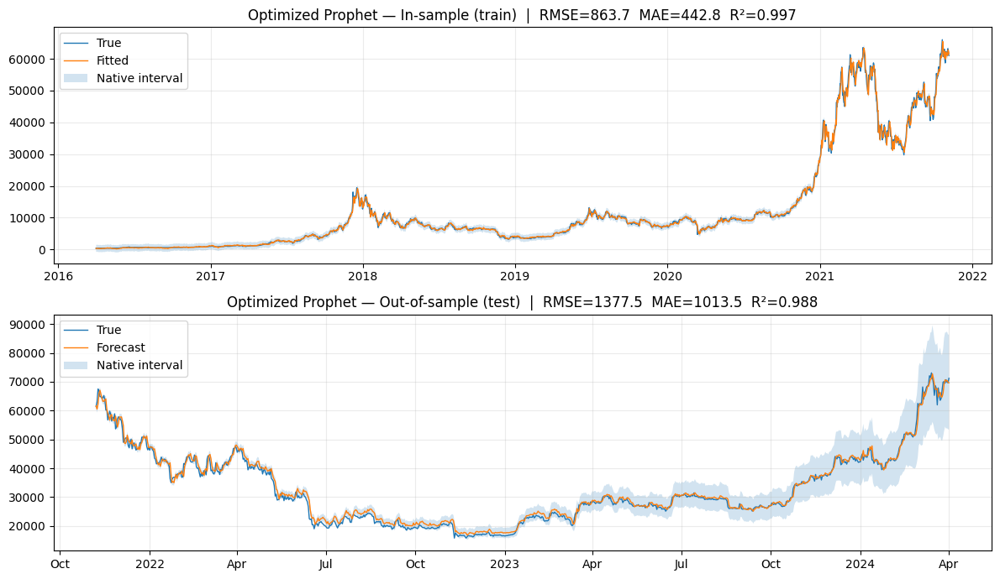

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/itt51825.json


Train metrics: {'RMSE': 863.6800835466706, 'MAE': 442.76510863574265, 'R2': 0.9968303434821284}
Test metrics : {'RMSE': 1377.5372823624557, 'MAE': 1013.5291618486202, 'R2': 0.9883322740575103}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/fnt2o_h5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60896', 'data', 'file=/tmp/tmpcaraqbnc/itt51825.json', 'init=/tmp/tmpcaraqbnc/fnt2o_h5.json', 'output', 'file=/tmp/tmpcaraqbnc/prophet_models550arq7/prophet_model-20250906140326.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/r7wjug2j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpcaraqbnc/8uvpkn82.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:

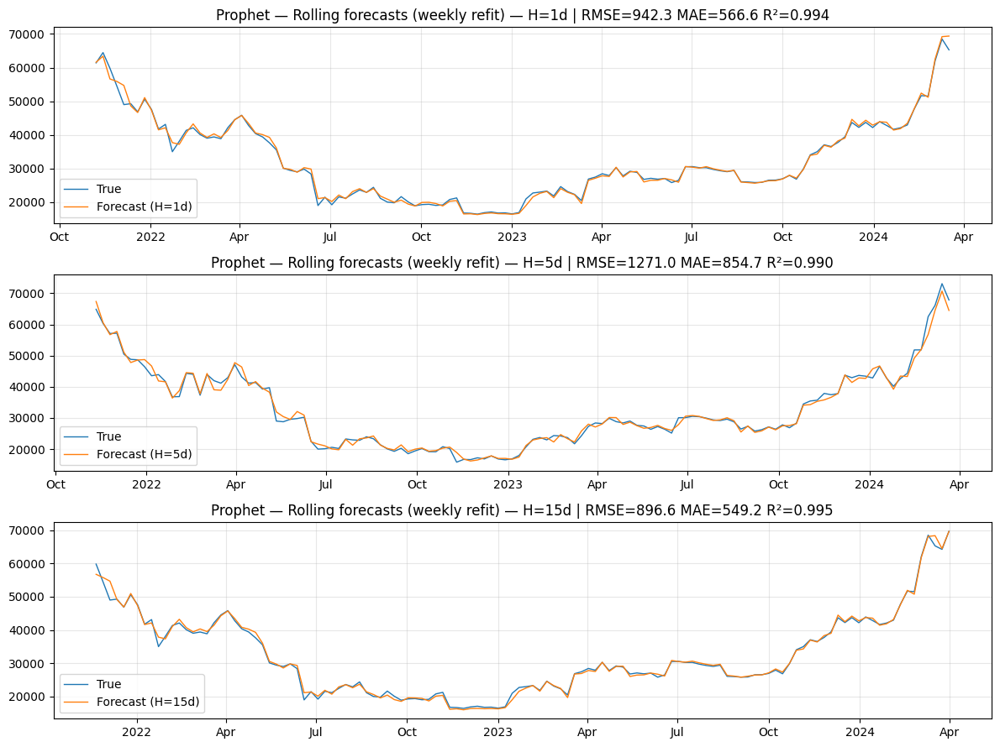

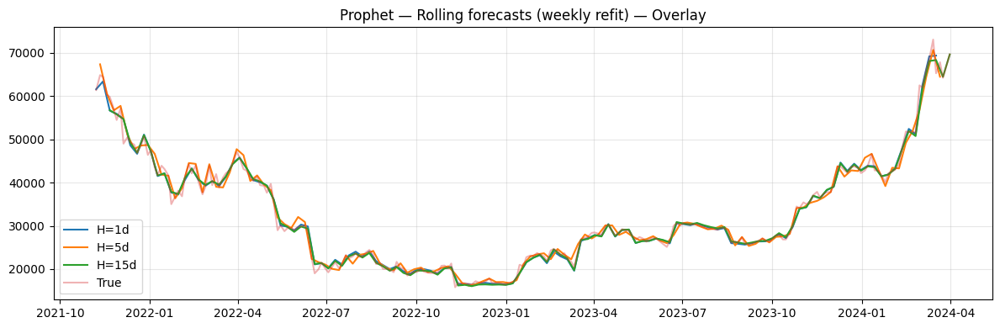

{1:             ds        y_true        y_pred
 0   2021-11-07  61416.308482  61600.766586
 1   2021-11-14  64471.043618  63410.009225
 2   2021-11-21  59815.373610  56637.568572
 3   2021-11-28  54487.450221  55895.942919
 4   2021-12-05  49014.112876  54722.016042
 ..         ...           ...           ...
 119 2024-02-18  51673.990000  52426.699588
 120 2024-02-25  51549.100000  51201.845131
 121 2024-03-03  62004.020000  62543.901400
 122 2024-03-10  68513.590000  69211.654373
 123 2024-03-17  65286.520000  69383.738519
 
 [124 rows x 3 columns],
 5:             ds        y_true        y_pred
 0   2021-11-11  64871.252161  67368.441943
 1   2021-11-18  60338.924900  60610.642932
 2   2021-11-25  57103.460600  56715.290321
 3   2021-12-02  57173.079500  57748.614705
 4   2021-12-09  50471.216958  51100.836233
 ..         ...           ...           ...
 119 2024-02-22  51833.000000  51975.751947
 120 2024-02-29  62497.280000  56767.418767
 121 2024-03-07  66137.130000  64550.639189

In [ ]:

# Execution

base_df = data if 'data' in globals() else (df if 'df' in globals() else None)
assert isinstance(base_df, pd.DataFrame), "Please define `data` or `df` as a pandas DataFrame with a DatetimeIndex."
assert isinstance(base_df.index, pd.DatetimeIndex), "Index must be DatetimeIndex."

# Exogenous columns
exog_cols = [
    'Open','High','Low','Volume','Pct_change',
    'MA','EMA','OBV','MACD','Signal','PSAR',
    'GPRD','EPU','gold_close'
]
exog_cols = [c for c in exog_cols if c in base_df.columns]
if not exog_cols:
    raise ValueError("None of the expected exogenous columns were found in your dataframe.")

# Build Prophet frame and split
df_prophet = build_prophet_frame(base_df, exog_cols, target='Close', lag=1)
train_df, test_df = train_test_split_prophet(df_prophet, TRAIN_FRAC)

print(f"TRAIN: {train_df['ds'].min().date()} → {train_df['ds'].max().date()}  (n={len(train_df)})")
print(f"TEST : {test_df['ds'].min().date()} → {test_df['ds'].max().date()}  (n={len(test_df)})")


# Hyperparameter search
if PER_H_TUNING:
    print("[CV] Per-horizon tuning enabled.")
    best_by_H = {}
    for H in HORIZONS:
        try:
            params_H, rmse_cv_H = cv_grid_search_prophet(
                train_df=train_df,
                exog_cols=exog_cols,
                param_grid=PARAM_GRID,
                interval_width=INTERVAL_WIDTH,
                initial_min_days=INITIAL_MIN_DAYS,
                period_days=PERIOD_DAYS,
                cv_horizon_days=H
            )
            best_by_H[H] = {"params": params_H, "cv_rmse": rmse_cv_H}
        except Exception as e:
            print(f"[CV][H={H}] Fallback to defaults due to: {e}")
            best_by_H[H] = {
                "params": {
                    'changepoint_prior_scale': 0.1,
                    'seasonality_prior_scale': 10.0,
                    'seasonality_mode': 'additive',
                    'changepoint_range': 0.8
                },
                "cv_rmse": np.nan
            }

    # Choose a target horizon for the single train/test plot
    target_H = min(HORIZONS)
    best_params_for_plot = best_by_H[target_H]["params"]

else:
    print("[CV] Single tuning at max(H) for all horizons.")
    try:
        best_params_for_all, best_cv_rmse = cv_grid_search_prophet(
            train_df=train_df,
            exog_cols=exog_cols,
            param_grid=PARAM_GRID,
            interval_width=INTERVAL_WIDTH,
            initial_min_days=INITIAL_MIN_DAYS,
            period_days=PERIOD_DAYS,
            cv_horizon_days=max(HORIZONS)
        )
    except Exception as e:
        print(f"[CV] Fallback to defaults due to: {e}")
        best_params_for_all = {
            'changepoint_prior_scale': 0.1,
            'seasonality_prior_scale': 10.0,
            'seasonality_mode': 'additive',
            'changepoint_range': 0.8
        }
    best_params_for_plot = best_params_for_all

# Fit best model on TRAIN

best_model = make_model(best_params_for_plot, exog_cols, interval_width=INTERVAL_WIDTH, reg_prior=REG_PRIOR)
best_model.fit(train_df[['ds','y'] + exog_cols])

# Plot and metrics
metrics = plot_in_out_sample(best_model, train_df, test_df, exog_cols, title_prefix="Optimized Prophet")
print("Train metrics:", {k:v for k,v in metrics['train'].items() if k!='df'})
print("Test metrics :", {k:v for k,v in metrics['test'].items()  if k!='df'})


# Rolling k-step-ahead backtest from the cutoff with weekly refit
if PER_H_TUNING:
    params_map = {H: best_by_H[H]["params"] for H in HORIZONS}
    series = rolling_k_ahead(df_prophet=df_prophet,
                             exog_cols=exog_cols,
                             train_len=len(train_df),
                             best_params=params_map,
                             horizons=HORIZONS,
                             refit_every=REFIT_EVERY,
                             interval_width=INTERVAL_WIDTH,
                             reg_prior=REG_PRIOR)
else:
    series = rolling_k_ahead(df_prophet=df_prophet,
                             exog_cols=exog_cols,
                             train_len=len(train_df),
                             best_params=best_params_for_all,
                             horizons=HORIZONS,
                             refit_every=REFIT_EVERY,
                             interval_width=INTERVAL_WIDTH,
                             reg_prior=REG_PRIOR)

plot_rolling(series, title_prefix="Prophet — Rolling forecasts (weekly refit)")

series # series is a dict: {1: df, 5: df, 15: df}

TRAIN from 2016-04-01 to 2021-11-05 (n=2045)
Using exogenous variables: ['Open', 'High', 'Low', 'Volume', 'Pct_change', 'MA', 'EMA', 'OBV', 'MACD', 'Signal', 'PSAR', 'GPRD', 'EPU', 'gold_close']


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp36elwwkh/54mcmvxk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp36elwwkh/oje5thka.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23169', 'data', 'file=/tmp/tmp36elwwkh/54mcmvxk.json', 'init=/tmp/tmp36elwwkh/oje5thka.json', 'output', 'file=/tmp/tmp36elwwkh/prophet_modelbx_q8sgw/prophet_model-20250907222615.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:26:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:26:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp36

[Prophet IN-SAMPLE] H=1 → RMSE=1647.16, MAE=707.36, R²=0.989, N=240


DEBUG:cmdstanpy:input tempfile: /tmp/tmp36elwwkh/q57kvbua.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71916', 'data', 'file=/tmp/tmp36elwwkh/66rigw88.json', 'init=/tmp/tmp36elwwkh/q57kvbua.json', 'output', 'file=/tmp/tmp36elwwkh/prophet_model1t5djpcb/prophet_model-20250907223006.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:30:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:30:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp36elwwkh/jlwop6on.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp36elwwkh/5j8n5al6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:

[Prophet IN-SAMPLE] H=5 → RMSE=1190.80, MAE=642.61, R²=0.994, N=240


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp36elwwkh/n9q40svf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp36elwwkh/h8qswmsz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88353', 'data', 'file=/tmp/tmp36elwwkh/n9q40svf.json', 'init=/tmp/tmp36elwwkh/h8qswmsz.json', 'output', 'file=/tmp/tmp36elwwkh/prophet_model8czylins/prophet_model-20250907223506.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:35:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:35:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp36

[Prophet IN-SAMPLE] H=15 → RMSE=885.96, MAE=476.22, R²=0.997, N=238


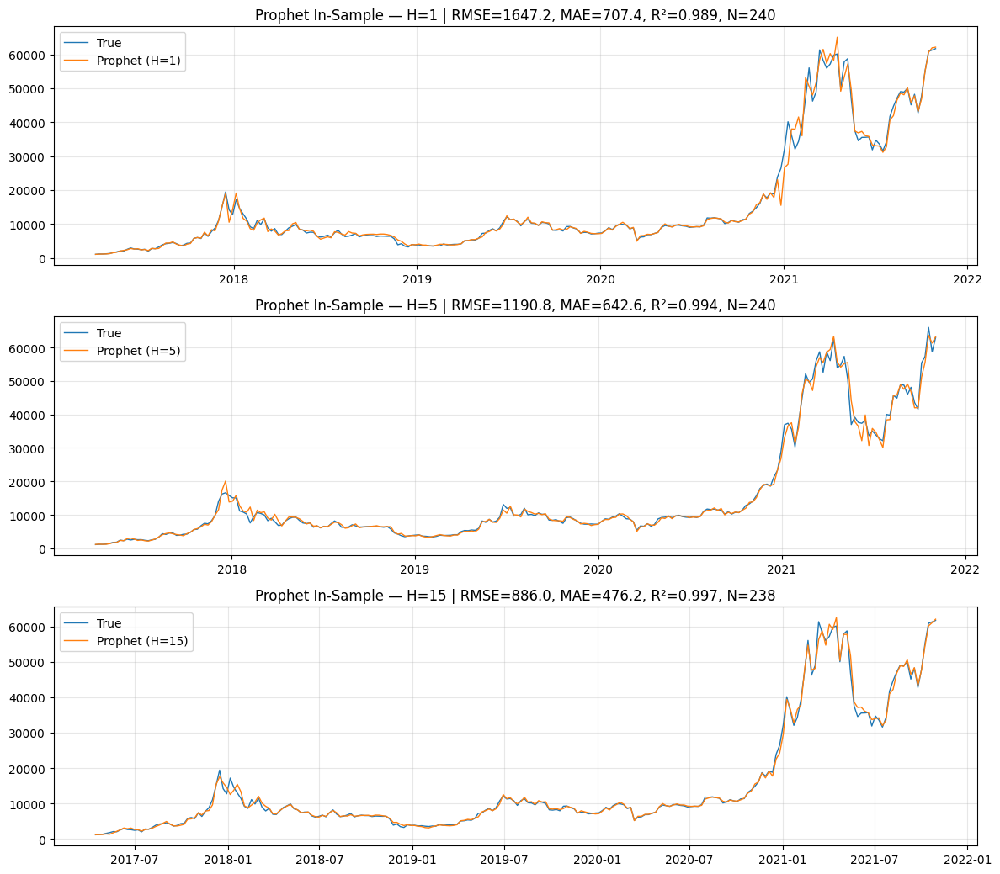

In [ ]:

# Best Hyperparameters Per Horizon
BEST_PARAMS_BY_H = {
    1: {
        'changepoint_prior_scale': 0.1,
        'seasonality_prior_scale': 10.0,
        'seasonality_mode': 'multiplicative',
        'changepoint_range': 0.8
    },
    5: {
        'changepoint_prior_scale': 0.001,
        'seasonality_prior_scale': 0.01,
        'seasonality_mode': 'additive',
        'changepoint_range': 0.8
    },
    15: {
        'changepoint_prior_scale': 0.1,
        'seasonality_prior_scale': 0.01,
        'seasonality_mode': 'additive',
        'changepoint_range': 0.9
    }
}


HORIZONS = (1, 5, 15)
INTERVAL_WIDTH = 0.80
REG_PRIOR = 0.10
REFIT_EVERY = 7   # Refitting frequency

# Metrics
def _rmse(y_true, y_pred):
    return np.sqrt(np.mean((np.array(y_true) - np.array(y_pred))**2))

def _mae(y_true, y_pred):
    return np.mean(np.abs(np.array(y_true) - np.array(y_pred)))

def _r2(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - np.mean(y_true)) ** 2)
    return 1 - ss_res / ss_tot

# Prophet Model
def make_model(params, exog_cols, interval_width=INTERVAL_WIDTH, reg_prior=REG_PRIOR):
    m = Prophet(
        changepoint_prior_scale=params['changepoint_prior_scale'],
        seasonality_prior_scale=params['seasonality_prior_scale'],
        seasonality_mode=params['seasonality_mode'],
        changepoint_range=params['changepoint_range'],
        yearly_seasonality=True,
        weekly_seasonality=True,
        interval_width=interval_width
    )
    m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
    for reg in exog_cols:
        m.add_regressor(reg, standardize='auto', prior_scale=reg_prior)
    return m

# Rolling In-Sample Forecast Function
def rolling_k_in_sample_prophet(train_df, exog_cols, params, H, refit_every=7,
                                 interval_width=0.8, reg_prior=0.1):
    preds, trues, dates = [], [], []
    i = 365

    while i + H <= len(train_df):
        hist = train_df.iloc[:i].copy()

        m = make_model(params, exog_cols, interval_width=interval_width, reg_prior=reg_prior)
        m.fit(hist[['ds', 'y'] + exog_cols])

        future = train_df[['ds'] + exog_cols].iloc[i:i + H].copy()
        fcst = m.predict(future)[['ds', 'yhat']].reset_index(drop=True)

        preds.append(float(fcst.loc[H - 1, 'yhat']))
        trues.append(float(train_df['y'].iloc[i + H - 1]))
        dates.append(train_df['ds'].iloc[i + H - 1])

        i += refit_every

    df_out = pd.DataFrame({'ds': dates, 'y_true': trues, 'y_pred': preds})
    rmse = _rmse(df_out['y_true'], df_out['y_pred'])
    mae = _mae(df_out['y_true'], df_out['y_pred'])
    r2 = _r2(df_out['y_true'], df_out['y_pred'])

    metrics = {"RMSE": rmse, "MAE": mae, "R2": r2, "N": len(df_out)}

    return df_out, metrics


base_df = data if 'data' in globals() else df
assert isinstance(base_df, pd.DataFrame) and isinstance(base_df.index, pd.DatetimeIndex)

# Select exogenous columns that exist
candidate_exogs = [
    'Open','High','Low','Volume','Pct_change',
    'MA','EMA','OBV','MACD','Signal','PSAR',
    'GPRD','EPU','gold_close'
]
exog_cols = [c for c in candidate_exogs if c in base_df.columns]

if not exog_cols:
    raise ValueError("No expected exogenous columns found in base_df.")

# Build Prophet
def build_prophet_frame(df, exog_cols, target='Close', lag=1):
    df = df.copy()
    df['y'] = df[target].shift(-lag)
    df = df.dropna(subset=['y'])
    df['ds'] = df.index
    return df[['ds', 'y'] + exog_cols]

df_prophet = build_prophet_frame(base_df, exog_cols, target='Close', lag=1)

# Split into train
cut = int(len(df_prophet) * 0.70)
train_df = df_prophet.iloc[:cut].copy()
print(f"TRAIN from {train_df['ds'].min().date()} to {train_df['ds'].max().date()} (n={len(train_df)})")
print(f"Using exogenous variables: {exog_cols}")

# Run In-Sample Rolling Forecasts f
series_train = {}
metrics_train = {}

for H in HORIZONS:
    best_params_H = BEST_PARAMS_BY_H[H]
    df_h, mets_h = rolling_k_in_sample_prophet(
        train_df=train_df,
        exog_cols=exog_cols,
        params=best_params_H,
        H=H,
        refit_every=REFIT_EVERY
    )
    series_train[H] = df_h
    metrics_train[H] = mets_h
    print(f"[Prophet IN-SAMPLE] H={H} → RMSE={mets_h['RMSE']:.2f}, MAE={mets_h['MAE']:.2f}, R²={mets_h['R2']:.3f}, N={mets_h['N']}")

#  Plot Forecasts
fig, axes = plt.subplots(len(HORIZONS), 1, figsize=(12, 3.5 * len(HORIZONS)), sharex=False)
if len(HORIZONS) == 1:
    axes = [axes]

for ax, H in zip(axes, HORIZONS):
    dfh = series_train[H]
    m = metrics_train[H]
    ax.plot(dfh['ds'], dfh['y_true'], label='True', lw=1)
    ax.plot(dfh['ds'], dfh['y_pred'], label=f'Prophet (H={H})', lw=1)
    ax.set_title(f"Prophet In-Sample — H={H} | RMSE={m['RMSE']:.1f}, MAE={m['MAE']:.1f}, R²={m['R2']:.3f}, N={m['N']}")
    ax.grid(True, alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()


# PROPHET_LSTM

In [ ]:


# Prophet parameters and LSTM search

HORIZONS = (1, 5, 15)
TRAIN_FRAC = 0.70
INTERVAL_WIDTH = 0.80
REFIT_EVERY = 7
REG_PRIOR = 0.10
PATIENCE = 10
EPOCHS = 200

best_by_H = {
    1: {'changepoint_prior_scale': 0.1,
        'seasonality_prior_scale': 0.01,
        'seasonality_mode': 'additive',
        'changepoint_range': 0.9},
    5: {'changepoint_prior_scale': 0.1,
        'seasonality_prior_scale': 10.0,
        'seasonality_mode': 'multiplicative',
        'changepoint_range': 0.8},
    15: {'changepoint_prior_scale': 0.001,
         'seasonality_prior_scale': 0.01,
         'seasonality_mode': 'additive',
         'changepoint_range': 0.8}
}

# Values for LSTM hyperparameters
UNITS_LIST    = [32, 64, 128]
DROPOUT_LIST  = [0.05, 0.10, 0.20]
LR_LIST       = [1e-4, 5e-4, 1e-3]
BATCH_LIST    = [16, 32, 64]
LOOKBACK_LIST = [30, 60, 90]

def build_prophet_frame(raw_df: pd.DataFrame, exog_cols, target='Close', lag=1) -> pd.DataFrame:
    dfp = raw_df[[target] + exog_cols].copy()
    dfp[target] = pd.to_numeric(dfp[target], errors='coerce')
    dfp['ds'] = raw_df.index
    dfp['y']  = dfp[target]
    dfp = dfp[['ds','y'] + exog_cols].sort_values('ds').reset_index(drop=True)
    dfp['ds'] = pd.to_datetime(dfp['ds'])
    dfp = dfp.set_index('ds').asfreq('D').reset_index()
    for c in exog_cols:
        dfp[c] = pd.to_numeric(dfp[c], errors='coerce').shift(lag)
    dfp[exog_cols] = dfp[exog_cols].ffill().bfill()
    return dfp.dropna(subset=['y'] + exog_cols).reset_index(drop=True)

def train_test_split_prophet(dfp: pd.DataFrame, train_frac: float):
    cut = int(len(dfp) * train_frac)
    return dfp.iloc[:cut].copy(), dfp.iloc[cut:].copy()

def make_model(params, exog_cols, interval_width=INTERVAL_WIDTH, reg_prior=REG_PRIOR) -> Prophet:
    m = Prophet(
        changepoint_prior_scale=params['changepoint_prior_scale'],
        seasonality_prior_scale=params['seasonality_prior_scale'],
        seasonality_mode=params['seasonality_mode'],
        changepoint_range=params['changepoint_range'],
        interval_width=interval_width,
        mcmc_samples=0,
    )
    m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
    for reg in exog_cols:
        m.add_regressor(reg, standardize='auto', prior_scale=reg_prior)
    return m

def build_supervised_residuals(resid_series: pd.Series,
                               exog_df: pd.DataFrame,
                               lookback: int,
                               horizon: int):
    s = resid_series.copy()
    X_resid, X_exog, y, dates = [], [], [], []
    for t in range(lookback, len(s) - horizon):
        r_win = s.iloc[t-lookback:t].values.astype(float)
        ex_row = exog_df.iloc[t].values.astype(float)
        target = s.iloc[t + horizon]
        X_resid.append(r_win)
        X_exog.append(ex_row)
        y.append(target)
        dates.append(s.index[t + horizon])
    X_resid = np.asarray(X_resid)
    X_exog  = np.asarray(X_exog)
    y       = np.asarray(y).reshape(-1, 1)
    dates   = np.asarray(dates)
    resid_scaler = StandardScaler()
    exog_scaler  = StandardScaler()
    y_scaler     = StandardScaler()
    return X_resid, X_exog, y, dates, resid_scaler, exog_scaler, y_scaler

def scale_and_reshape_for_lstm(X_resid, X_exog, y, resid_scaler, exog_scaler, y_scaler, fit=True):
    n, L = X_resid.shape
    Xr_flat = X_resid.reshape(n, L)
    if fit:
        Xr_flat = resid_scaler.fit_transform(Xr_flat)
        Xe = exog_scaler.fit_transform(X_exog)
        y  = y_scaler.fit_transform(y)
    else:
        Xr_flat = resid_scaler.transform(Xr_flat)
        Xe = exog_scaler.transform(X_exog)
        y  = y_scaler.transform(y)
    Xe_rep = np.repeat(Xe[:, None, :], repeats=L, axis=1)
    Xr_seq = Xr_flat.reshape(n, L, 1)
    X_seq  = np.concatenate([Xr_seq, Xe_rep], axis=2)
    return X_seq, y


# build prophet frame and split
base_df = data if 'data' in globals() else (df if 'df' in globals() else None)
assert isinstance(base_df, pd.DataFrame), "Define `data` or `df` as a DataFrame with a DatetimeIndex."
assert isinstance(base_df.index, pd.DatetimeIndex), "Index must be DatetimeIndex."

exog_cols = [
    'Open','High','Low','Volume','Pct_change',
    'MA','EMA','OBV','MACD','Signal','PSAR',
    'GPRD','EPU','gold_close'
]
exog_cols = [c for c in exog_cols if c in base_df.columns]
df_prophet = build_prophet_frame(base_df, exog_cols, target='Close', lag=1)
train_df, test_df = train_test_split_prophet(df_prophet, TRAIN_FRAC)


# Fit Prophet once
params_for_fit = best_by_H[1]
prophet_model  = make_model(params_for_fit, exog_cols)
prophet_model.fit(train_df[['ds','y'] + exog_cols])

# Compute in-sample residuals for the training set
fitted_tr = prophet_model.predict(train_df[['ds'] + exog_cols])
merged_tr = train_df[['ds','y']].merge(
    fitted_tr[['ds','yhat']], on='ds', how='inner'
).set_index('ds').sort_index()
resid_tr = (merged_tr['y'] - merged_tr['yhat']).copy()
exog_tr  = train_df.set_index('ds')[exog_cols].copy()

# LSTM hyperparameter tuning

lstm_best = {}
for H in HORIZONS:
    best_mae = float('inf')
    best_cfg = None
    for units in UNITS_LIST:
        for dropout in DROPOUT_LIST:
            for lr in LR_LIST:
                for batch_size in BATCH_LIST:
                    for lookback in LOOKBACK_LIST:
                        Xr, Xe, y_r, dates_y, resid_scaler, exog_scaler, y_scaler = \
                            build_supervised_residuals(resid_tr, exog_tr, lookback, H)
                        X_seq, y_scaled = scale_and_reshape_for_lstm(
                            Xr, Xe, y_r, resid_scaler, exog_scaler, y_scaler, fit=True
                        )
                        n = len(X_seq); n_val = max(int(n * 0.15), 1)
                        X_tr_, X_val_ = X_seq[:-n_val], X_seq[-n_val:]
                        y_tr_, y_val_ = y_scaled[:-n_val], y_scaled[-n_val:]

                        model = models.Sequential([
                            layers.Input(shape=X_tr_.shape[1:]),
                            layers.LSTM(units, return_sequences=False),
                            layers.Dropout(dropout),
                            layers.Dense(32, activation='relu'),
                            layers.Dense(1)
                        ])
                        model.compile(
                            optimizer=optimizers.Nadam(learning_rate=lr),
                            loss='mae'
                        )
                        es = callbacks.EarlyStopping(
                            patience=PATIENCE,
                            restore_best_weights=True,
                            monitor='val_loss'
                        )
                        model.fit(
                            X_tr_, y_tr_,
                            validation_data=(X_val_, y_val_),
                            epochs=EPOCHS,
                            batch_size=batch_size,
                            verbose=0,
                            callbacks=[es]
                        )

                        val_pred = model.predict(X_val_, verbose=0)
                        val_mae = np.mean(
                            np.abs(
                                y_scaler.inverse_transform(val_pred) -
                                y_scaler.inverse_transform(y_val_)
                            )
                        )
                        if val_mae < best_mae:
                            best_mae = val_mae
                            best_cfg = {
                                "units": units,
                                "dropout": dropout,
                                "lr": lr,
                                "batch_size": batch_size,
                                "lookback": lookback,
                                "resid_scaler": resid_scaler,
                                "exog_scaler": exog_scaler,
                                "y_scaler": y_scaler
                            }
    lstm_best[H] = best_cfg
    print(f"[LSTM] H={H} best MAE={best_mae:.3f}, params={best_cfg}")


# Train final LSTMs using the tuned hyperparameters

lstm_pack = {}
for H in HORIZONS:
    cfg = lstm_best[H]
    Xr, Xe, y_r, _, _, _, _ = build_supervised_residuals(resid_tr, exog_tr, cfg["lookback"], H)
    X_seq, y_scaled = scale_and_reshape_for_lstm(
        Xr, Xe, y_r, cfg["resid_scaler"], cfg["exog_scaler"], cfg["y_scaler"], fit=True
    )
    model = models.Sequential([
        layers.Input(shape=X_seq.shape[1:]),
        layers.LSTM(cfg["units"], return_sequences=False),
        layers.Dropout(cfg["dropout"]),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(
        optimizer=optimizers.Nadam(learning_rate=cfg["lr"]),
        loss='mae'
    )
    es = callbacks.EarlyStopping(
        patience=PATIENCE,
        restore_best_weights=True,
        monitor='val_loss'
    )
    model.fit(
        X_seq, y_scaled,
        validation_split=0.15,
        epochs=EPOCHS,
        batch_size=cfg["batch_size"],
        verbose=0,
        callbacks=[es]
    )
    lstm_pack[H] = {
        "model": model,
        "resid_scaler": cfg["resid_scaler"],
        "exog_scaler": cfg["exog_scaler"],
        "y_scaler": cfg["y_scaler"],
        "lookback": cfg["lookback"]
    }


# Rolling hybrid back-test with fixed Prophet params

series = {h: [] for h in HORIZONS}
full_df = pd.concat([train_df, test_df], ignore_index=True)
max_h = max(HORIZONS)
start_i = len(train_df)
i = start_i

while i + max_h - 1 < len(full_df):
    # use the largest horizon's Prophet params for stability
    params_iter = best_by_H[max_h]
    hist = full_df.iloc[:i].copy()
    m = make_model(params_iter, exog_cols)
    m.fit(hist[['ds','y'] + exog_cols])


    future = full_df[['ds'] + exog_cols].iloc[i:i+max_h].copy()
    fcst = m.predict(future)[['ds','yhat']].reset_index(drop=True)

    # residual history and exogs for LSTM inputs
    fit_hist = m.predict(hist[['ds'] + exog_cols])[['ds','yhat']]
    merged_h = hist[['ds','y']].merge(fit_hist, on='ds', how='inner').set_index('ds').sort_index()
    resid_hist = (merged_h['y'] - merged_h['yhat'])
    exog_hist  = hist.set_index('ds')[exog_cols]

    for h in HORIZONS:
        if len(resid_hist) < lstm_pack[h]["lookback"] + 1:
            continue
        # form one-sample input for LSTM
        r_win = resid_hist.iloc[-lstm_pack[h]["lookback"]:].values.astype(float).reshape(1, -1)
        ex_row = exog_hist.iloc[-1].values.astype(float).reshape(1, -1)
        cfg = lstm_best[h]
        X_seq, _ = scale_and_reshape_for_lstm(
            r_win, ex_row, np.array([[0.0]]),
            lstm_pack[h]["resid_scaler"],
            lstm_pack[h]["exog_scaler"],
            lstm_pack[h]["y_scaler"],
            fit=False
        )
        resid_pred_scaled = lstm_pack[h]["model"].predict(X_seq, verbose=0)
        resid_pred = lstm_pack[h]["y_scaler"].inverse_transform(resid_pred_scaled)[0,0]
        ds_h     = fcst.loc[h-1, 'ds']
        yhat_ph  = fcst.loc[h-1, 'yhat']
        y_true_h = float(full_df['y'].iloc[i + h - 1])
        yhat_hybrid = float(yhat_ph + resid_pred)
        series[h].append({"ds": ds_h, "y_true": y_true_h, "y_pred": yhat_hybrid})
    i += REFIT_EVERY

# Convert series to DataFrames
for h in HORIZONS:
    series[h] = pd.DataFrame(series[h]).sort_values('ds')



INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/ghzy_vzt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/xjy21vsm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13414', 'data', 'file=/tmp/tmpa5wq_1z5/ghzy_vzt.json', 'init=/tmp/tmpa5wq_1z5/xjy21vsm.json', 'output', 'file=/tmp/tmpa5wq_1z5/prophet_modelpt74_k_r/prophet_model-20250907123645.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:36:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:36:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


[LSTM] H=1 best MAE=1494.617, params={'units': 32, 'dropout': 0.2, 'lr': 0.001, 'batch_size': 16, 'lookback': 60, 'resid_scaler': StandardScaler(), 'exog_scaler': StandardScaler(), 'y_scaler': StandardScaler()}
[LSTM] H=5 best MAE=1500.653, params={'units': 32, 'dropout': 0.1, 'lr': 0.0001, 'batch_size': 32, 'lookback': 90, 'resid_scaler': StandardScaler(), 'exog_scaler': StandardScaler(), 'y_scaler': StandardScaler()}
[LSTM] H=15 best MAE=1497.076, params={'units': 128, 'dropout': 0.1, 'lr': 0.001, 'batch_size': 16, 'lookback': 90, 'resid_scaler': StandardScaler(), 'exog_scaler': StandardScaler(), 'y_scaler': StandardScaler()}


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/7qcba1ij.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/bwgv1a9d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27568', 'data', 'file=/tmp/tmpa5wq_1z5/7qcba1ij.json', 'init=/tmp/tmpa5wq_1z5/bwgv1a9d.json', 'output', 'file=/tmp/tmpa5wq_1z5/prophet_modeln67ily88/prophet_model-20250907143936.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:39:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:39:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

def _rmse(y, yhat):
    y, yhat = np.asarray(y, float), np.asarray(yhat, float)
    m = np.isfinite(y) & np.isfinite(yhat)
    return float(np.sqrt(mean_squared_error(y[m], yhat[m]))) if m.any() else np.nan

def _mae(y, yhat):
    y, yhat = np.asarray(y, float), np.asarray(yhat, float)
    m = np.isfinite(y) & np.isfinite(yhat)
    return float(np.mean(np.abs(y[m] - yhat[m]))) if m.any() else np.nan

def _r2(y, yhat):
    y, yhat = np.asarray(y, float), np.asarray(yhat, float)
    m = np.isfinite(y) & np.isfinite(yhat)
    return float(r2_score(y[m], yhat[m])) if m.sum() >= 2 else np.nan


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/baw9cae0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/bn91l74t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50691', 'data', 'file=/tmp/tmpa5wq_1z5/baw9cae0.json', 'init=/tmp/tmpa5wq_1z5/bn91l74t.json', 'output', 'file=/tmp/tmpa5wq_1z5/prophet_modeluoh64tq0/prophet_model-20250907150139.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:01:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:01:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily

Training sample | Horizon=1 -> RMSE=933.07, MAE=440.35, R²=0.996


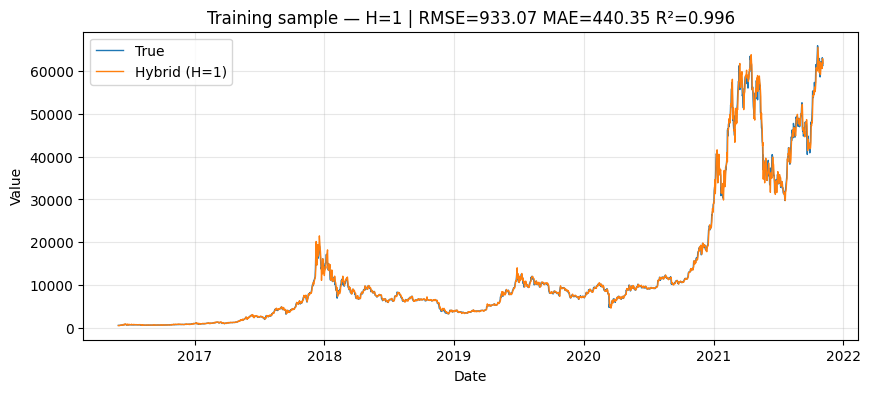

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/q12wg30z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/qdthmq3b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33957', 'data', 'file=/tmp/tmpa5wq_1z5/q12wg30z.json', 'init=/tmp/tmpa5wq_1z5/qdthmq3b.json', 'output', 'file=/tmp/tmpa5wq_1z5/prophet_model6r78d3zy/prophet_model-20250907153635.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:36:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:36:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily

Training sample | Horizon=5 -> RMSE=3283.74, MAE=1045.91, R²=0.955


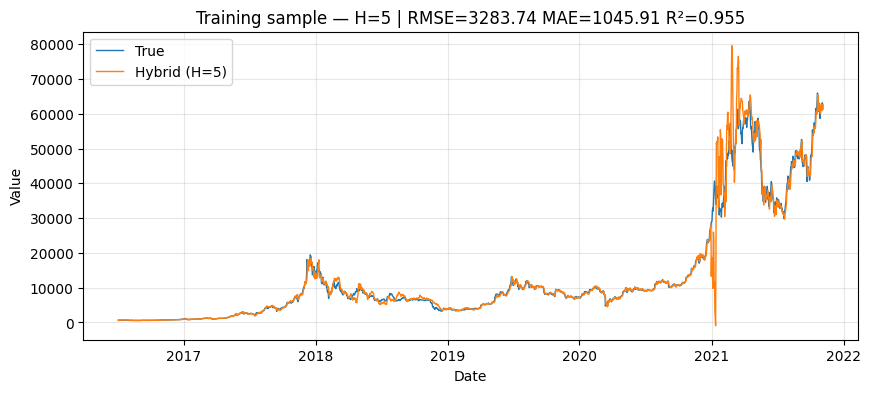

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/iuvvlriy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67520', 'data', 'file=/tmp/tmpa5wq_1z5/flzj_vuz.json', 'init=/tmp/tmpa5wq_1z5/iuvvlriy.json', 'output', 'file=/tmp/tmpa5wq_1z5/prophet_modelvkv8bdje/prophet_model-20250907161355.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:13:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:13:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/kihem_xm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/i7om59e4.json
D

Training sample | Horizon=15 -> RMSE=986.04, MAE=510.28, R²=0.996


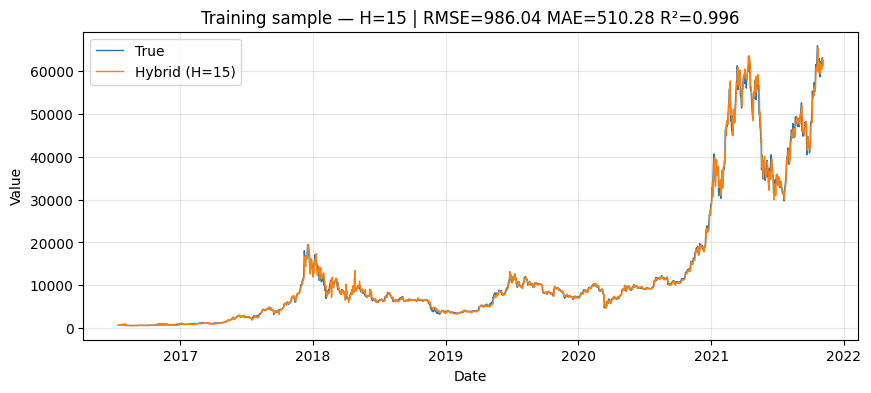

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/dzs3hvam.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13459', 'data', 'file=/tmp/tmpa5wq_1z5/fuw_jlu0.json', 'init=/tmp/tmpa5wq_1z5/dzs3hvam.json', 'output', 'file=/tmp/tmpa5wq_1z5/prophet_modelw495z0sk/prophet_model-20250907163735.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:37:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:37:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tem

Test sample | Horizon=1 -> RMSE=1182.30, MAE=775.17, R²=0.990


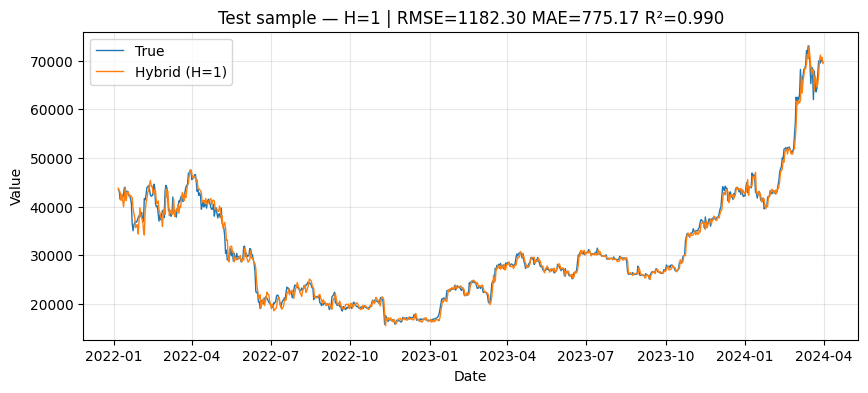

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
16:44:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:44:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/deipnz_g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/0_94mnvc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45358', 'data', 'file=/tmp/tmpa5wq_1z5/deipnz_g.json', 'init=/tmp/tmpa5wq_1z5/0_94mnvc.json', 'output', 'file=/tmp/tmpa5wq_1z5/prophet_modeleicsfdid/prophet_model-20250907164432.csv', 'method=optimi

Test sample | Horizon=5 -> RMSE=1328.29, MAE=889.05, R²=0.987


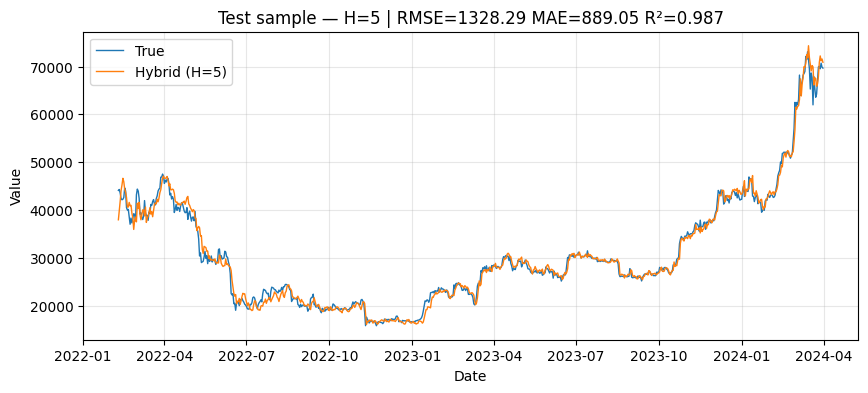

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
INFO:cmdstanpy:Chain [1] start processing
16:57:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
16:57:56 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/o_s7piu0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa5wq_1z5/818a2tzo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55326', 'data', 'file=/tmp/tmpa5wq_1z5/o_s7piu0.json', 'init=/tmp/tmpa5wq_1z5/818a2tzo.json', 'output', 'file=/tmp/tmpa5wq_1z5/prophet_model95zv6xga/prophet_model-20250907165756.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
16:57:56 - cmdstanpy - INFO - Chain [1] sta

Test sample | Horizon=15 -> RMSE=4376.21, MAE=2338.73, R²=0.860


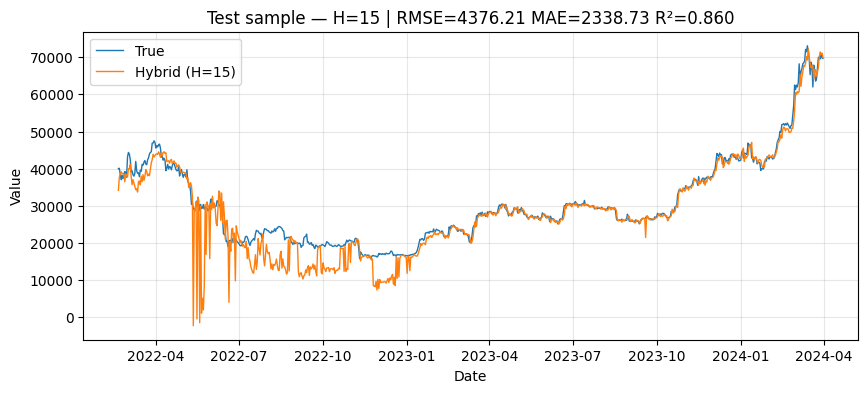

In [ ]:
def evaluate_and_plot(data_df, horizon, prophet_params, lstm_info, title_suffix):
    preds, true_vals, dates_out = [], [], []
    lookback = lstm_info["lookback"]
    max_i = len(data_df) - horizon

    for i in range(lookback, max_i):
        # train on history up to time i
        hist = data_df.iloc[:i].copy()
        future = data_df[['ds'] + exog_cols].iloc[i:i+horizon].copy()

        # Fit Prophet on history only
        m = make_model(prophet_params, exog_cols)
        m.fit(hist[['ds', 'y'] + exog_cols])

        # Predict future horizon steps
        fcst = m.predict(future)[['ds', 'yhat']].reset_index(drop=True)
        yhat_ph = fcst.loc[horizon - 1, 'yhat']
        y_true_h = float(data_df['y'].iloc[i + horizon - 1])

        # Compute residuals on training history
        fit_hist = m.predict(hist[['ds'] + exog_cols])[['ds', 'yhat']]
        merged_h = hist[['ds', 'y']].merge(fit_hist, on='ds', how='inner').set_index('ds').sort_index()
        resid_hist = merged_h['y'] - merged_h['yhat']
        exog_hist = hist.set_index('ds')[exog_cols]

        # Skip if not enough history
        if len(resid_hist) < lookback:
            continue

        # Prepare LSTM input
        r_win = resid_hist.iloc[-lookback:].values.reshape(1, -1)
        ex_row = exog_hist.iloc[-1].values.reshape(1, -1)

        X_seq, _ = scale_and_reshape_for_lstm(
            r_win, ex_row, np.array([[0.0]]),
            lstm_info["resid_scaler"],
            lstm_info["exog_scaler"],
            lstm_info["y_scaler"],
            fit=False
        )
        resid_pred_scaled = lstm_info["model"].predict(X_seq, verbose=0)
        resid_pred = lstm_info["y_scaler"].inverse_transform(resid_pred_scaled)[0, 0]

        # Hybrid forecast = Prophet + LSTM residual
        hybrid_forecast = yhat_ph + resid_pred


        preds.append(hybrid_forecast)
        true_vals.append(y_true_h)
        dates_out.append(data_df['ds'].iloc[i + horizon - 1])

    # metrics
    rmse = _rmse(true_vals, preds)
    mae = _mae(true_vals, preds)
    r2 = _r2(true_vals, preds)
    print(f"{title_suffix} | Horizon={horizon} -> RMSE={rmse:.2f}, MAE={mae:.2f}, R²={r2:.3f}")

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(dates_out, true_vals, label='True', linewidth=1)
    plt.plot(dates_out, preds, label=f'Hybrid (H={horizon})', linewidth=1)
    plt.title(f"{title_suffix} — H={horizon} | RMSE={rmse:.2f} MAE={mae:.2f} R²={r2:.3f}")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.show()

# Evaluate on training sample
for H in HORIZONS:
    cfg = lstm_pack[H]
    evaluate_and_plot(train_df, H, best_by_H[H], cfg, title_suffix="Training sample")

# Evaluate on test sample
for H in HORIZONS:
    cfg = lstm_pack[H]
    evaluate_and_plot(test_df, H, best_by_H[H], cfg, title_suffix="Test sample")


# Geminie

In [ ]:
import google.generativeai as genai
from google.colab import userdata

try:
    api_key = userdata.get('BTCKEY')
    genai.configure(api_key=api_key)

    print("--- Modèles disponibles pour 'generateContent' ---")
    for m in genai.list_models():
        if 'generateContent' in m.supported_generation_methods:
            print(m.name)
    print("-------------------------------------------------")
    print("\nCopiez l'un des noms ci-dessus (par ex. 'models/gemini-1.5-flash-latest')")

except Exception as e:
    print(f"Erreur lors de la récupération des modèles: {e}")

--- Modèles disponibles pour 'generateContent' ---
models/gemini-2.5-pro-preview-03-25
models/gemini-2.5-flash-preview-05-20
models/gemini-2.5-flash
models/gemini-2.5-flash-lite-preview-06-17
models/gemini-2.5-pro-preview-05-06
models/gemini-2.5-pro-preview-06-05
models/gemini-2.5-pro
models/gemini-2.0-flash-exp
models/gemini-2.0-flash
models/gemini-2.0-flash-001
models/gemini-2.0-flash-lite-001
models/gemini-2.0-flash-lite
models/gemini-2.0-flash-lite-preview-02-05
models/gemini-2.0-flash-lite-preview
models/gemini-2.0-pro-exp
models/gemini-2.0-pro-exp-02-05
models/gemini-exp-1206
models/gemini-2.0-flash-thinking-exp-01-21
models/gemini-2.0-flash-thinking-exp
models/gemini-2.0-flash-thinking-exp-1219
models/gemini-2.5-flash-preview-tts
models/gemini-2.5-pro-preview-tts
models/learnlm-2.0-flash-experimental
models/gemma-3-1b-it
models/gemma-3-4b-it
models/gemma-3-12b-it
models/gemma-3-27b-it
models/gemma-3n-e4b-it
models/gemma-3n-e2b-it
models/gemini-flash-latest
models/gemini-flash-li

--- Proxy variables cleared ---
--- Libraries Imported ---
File 'data_with_date.csv' loaded successfully.

--- 70/30 Split Configuration ---
Total days in dataset: 2923
Split index (70%): 2046
Cutoff date (start of 30% test set): 2021-11-07

--- Valid Simulation Setup ---
Cutoff Date (LLM knowledge stops): 2021-11-07
Known history (train_df) ends on: 2021-11-06 (~70%)
Simulation ('evaluation_df') starts with history from: 2021-09-08
The FIRST prediction will be for: 2021-11-07 (which is == CUTOFF_DATE)

Google API Key successfully configured from Colab Secrets.

--- Starting VALIDATED 'Walk-Forward' Simulation (Data >= 2021-11-07) ---
Prediction for 2021-11-07: Success
Prediction for 2021-11-08: Success
Prediction for 2021-11-09: Success
Prediction for 2021-11-10: Success
Prediction for 2021-11-11: Success
Prediction for 2021-11-12: Success
Prediction for 2021-11-13: Success
Prediction for 2021-11-14: Success
Prediction for 2021-11-15: Success
Prediction for 2021-11-16: Success
Predict

ERROR:tornado.access:500 POST /v1beta/models/gemini-flash-latest:generateContent?%24alt=json%3Benum-encoding%3Dint (::1) 15476.55ms


API call failed (Attempt 1/3) for date 2023-03-08. Error: 500 POST https://generativelanguage.googleapis.com/v1beta/models/gemini-flash-latest:generateContent?%24alt=json%3Benum-encoding%3Dint: TypeError: Failed to fetch
Prediction for 2023-03-08: Success
Prediction for 2023-03-09: Success
Prediction for 2023-03-10: Success
Prediction for 2023-03-11: Success
Prediction for 2023-03-12: Success
Prediction for 2023-03-13: Success
Prediction for 2023-03-14: Success
Prediction for 2023-03-15: Success
Prediction for 2023-03-16: Success
Prediction for 2023-03-17: Success
Prediction for 2023-03-18: Success
Prediction for 2023-03-19: Success
Prediction for 2023-03-20: Success
Prediction for 2023-03-21: Success
Prediction for 2023-03-22: Success
Prediction for 2023-03-23: Success
Prediction for 2023-03-24: Success
Prediction for 2023-03-25: Success
Prediction for 2023-03-26: Success
Prediction for 2023-03-27: Success
Prediction for 2023-03-28: Success
Prediction for 2023-03-29: Success
Predictio

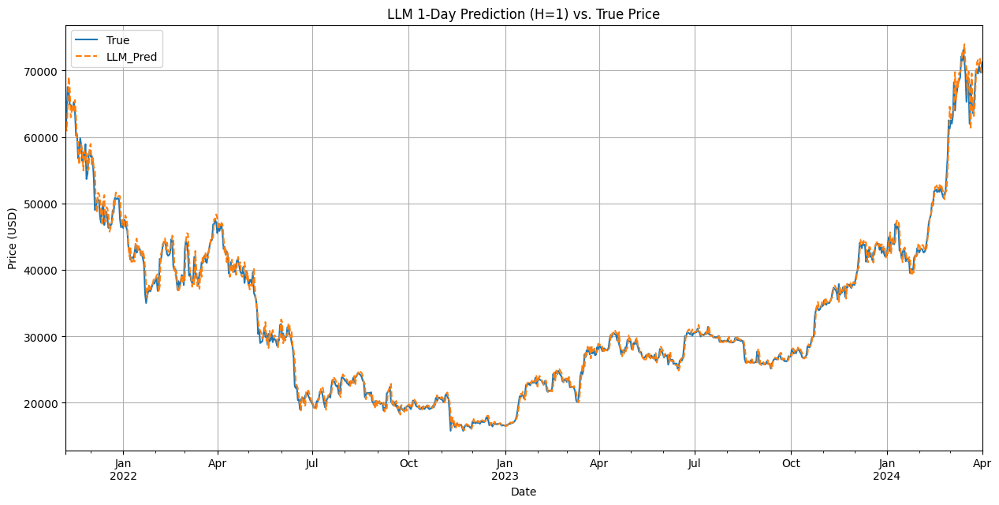

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import google.generativeai as genai
import re
import time
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from google.colab import userdata

import os
os.environ['HTTP_PROXY'] = ''
os.environ['HTTPS_PROXY'] = ''
print("--- Proxy variables cleared ---")


print("--- Libraries Imported ---")
from google.colab import userdata






# Basic parameters
N_STEPS = 60
N_PRED_DAYS = 1
TRAIN_SPLIT_PCT = 0.70


try:

    df_final = pd.read_csv("data_with_date.csv", parse_dates=['Date'])
    df_final.set_index('Date', inplace=True)
    if not df_final.index.is_monotonic_increasing:
        print("Sorting data by date...")
        df_final.sort_index(inplace=True)
    print("File 'data_with_date.csv' loaded successfully.")
except FileNotFoundError:
    print("ERROR: File 'data_with_date.csv' not found. Please upload it to Colab.")
    df_final = pd.DataFrame()

if not df_final.empty:

    total_rows = len(df_final)
    split_index = int(total_rows * TRAIN_SPLIT_PCT)


    if split_index < N_STEPS:
        print(f"CRITICAL ERROR: Your 'train' split (70%) only contains {split_index} days.")
        print(f"This is insufficient for the required history (N_STEPS = {N_STEPS}).")
        print("Please reduce N_STEPS or add more data.")
        df_final = pd.DataFrame()

    elif (total_rows - split_index) < N_PRED_DAYS:
         print(f"CRITICAL ERROR: Your 'test' split (30%) is too small ({total_rows - split_index} days) to make a prediction.")
         df_final = pd.DataFrame()
    else:

        CUTOFF_DATE = df_final.index[split_index]
        print("\n--- 70/30 Split Configuration ---")
        print(f"Total days in dataset: {total_rows}")
        print(f"Split index (70%): {split_index}")
        print(f"Cutoff date (start of 30% test set): {CUTOFF_DATE.date()}")

if not df_final.empty:

    train_df = df_final[df_final.index < CUTOFF_DATE]
    test_start_index = split_index

    history_start_index = test_start_index - N_STEPS

    evaluation_df = df_final.iloc[history_start_index:]

    print("\n--- Valid Simulation Setup ---")
    print(f"Cutoff Date (LLM knowledge stops): {CUTOFF_DATE.date()}")
    print(f"Known history (train_df) ends on: {train_df.index.max().date()} (~70%)")
    print(f"Simulation ('evaluation_df') starts with history from: {evaluation_df.index.min().date()}")
    print(f"The FIRST prediction will be for: {evaluation_df.index[N_STEPS].date()} (which is == CUTOFF_DATE)")




# API Key
try:

    api_key = userdata.get('BTCKEY')

    genai.configure(api_key=api_key)
    print("\nGoogle API Key successfully configured from Colab Secrets.")
    api_key_is_valid = True

except Exception as e:

    print(f"\nAPI Key configuration failed: {e}. The evaluation loop will be skipped.")
    api_key_is_valid = False


# PROMPT

def serialize_data_for_llm(data_slice):
    """
    Converts a DataFrame slice into a richer text string for the LLM,
    including technical indicators and exogenous variables.
    """
    text_parts = []
    columns_to_include = [
        'Open', 'High', 'Low', 'Close', 'Volume', 'Pct_change', 'MA', 'EMA', 'OBV', 'MACD', 'Signal', 'PSAR', 'gold_close', 'EPU', 'GPRD'
    ]

    if not all(col in data_slice.columns for col in columns_to_include):
        missing_cols = [col for col in columns_to_include if col not in data_slice.columns]
        raise ValueError(f"The following columns are missing from the DataFrame: {missing_cols}")

    for index in data_slice.index:
        row = data_slice.loc[index]
        daily_data = [f"D {index.strftime('%Y-%m-%d')}:"]
        for col in columns_to_include:
            if col == 'Volume':
                vol_in_mil = float(row[col]) / 1_000_000
                daily_data.append(f"V={vol_in_mil:.2f}M")
            else:
                daily_data.append(f"{col}={row[col]:.2f}")
        text_parts.append(" ".join(daily_data))
    return "; ".join(text_parts)

def create_llm_prompt(historical_data, target_date):
    """Creates a stable prompt for a 1-day forecast."""

    one_shot_context = "D 2024-12-01: Open=70100.50 High=71500.00 Low=70050.25 Close=71200.75 V=4500.50M Pct_change=0.02 MA=69000.00 EMA=69500.00 OBV=1234567890.12 MACD=150.55 Signal=145.20 PSAR=68000.00 gold_close=2300.00 EPU=85.54 GPRD=165.62; ... etc. for 59 more days"
    one_shot_response = "71350.50"
    prompt = f"""You are a financial forecasting bot. Your task is to predict the closing price for Bitcoin for the next day.
Respond with ONLY a single numerical value. Do not add any extra text.

### Example
Context: {one_shot_context}
Target Closing Price for 2024-12-02: {one_shot_response}

### Prediction Task
Context: {serialize_data_for_llm(historical_data)}
Target Closing Price for {target_date.strftime('%Y-%m-%d')}:
"""
    return prompt


# Evaluation of the WALK-FORWARD
if api_key_is_valid and not df_final.empty:
    print(f"\n--- Starting VALIDATED 'Walk-Forward' Simulation (Data >= {CUTOFF_DATE.date()}) ---")

    llm_predictions = []


    test_range = range(len(evaluation_df) - N_STEPS - N_PRED_DAYS + 1)


    model_llm = genai.GenerativeModel('models/gemini-flash-latest')



    for i in test_range:
        history_end_index = i + N_STEPS
        prediction_end_index = history_end_index + N_PRED_DAYS


        history_unscaled = evaluation_df.iloc[i:history_end_index]
        target_dates = evaluation_df.index[history_end_index:prediction_end_index]
        true_values = evaluation_df.iloc[history_end_index:prediction_end_index]['Close']

        prompt = create_llm_prompt(history_unscaled, target_dates[0])

        llm_preds_float = None
        max_retries = 3
        for attempt in range(max_retries):
            try:
                response = model_llm.generate_content(prompt)
                parsed_preds = re.findall(r'-?\d+\.?\d*', response.text)

                if len(parsed_preds) == N_PRED_DAYS:
                    llm_preds_float = [float(p) for p in parsed_preds]
                    break
                else:
                    raise ValueError(f"Expected {N_PRED_DAYS} prediction(s), but got {len(parsed_preds)}: '{response.text}'")

            except Exception as e:
                print(f"API call failed (Attempt {attempt + 1}/{max_retries}) for date {target_dates[0].date()}. Error: {e}")
                if attempt < max_retries - 1:
                    time.sleep(5)
                else:
                    print(f"Failed to predict after {max_retries} attempts for {target_dates[0].date()}.")

        if llm_preds_float:
            print(f"Prediction for {target_dates[0].date()}: Success")
            for j in range(N_PRED_DAYS):
                llm_predictions.append({
                    'Date': target_dates[j],
                    'True': true_values.iloc[j],
                    'LLM_Pred': llm_preds_float[j]
                })

        time.sleep(10)
else:
    print("\nEvaluation loop skipped due to invalid API key or data loading error.")


# RESULTS OF THE ANALYSIS
if 'llm_predictions' in locals() and llm_predictions:
    results_df = pd.DataFrame(llm_predictions).set_index('Date')

    if not results_df.empty:
        y_true = results_df['True']
        y_pred = results_df['LLM_Pred']

        # Metrics
        rmse_llm = np.sqrt(mean_squared_error(y_true, y_pred))
        mae_llm = mean_absolute_error(y_true, y_pred)
        mape_llm = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
        r2_llm = r2_score(y_true, y_pred)
        bias_llm = np.mean(y_pred - y_true)

        print("\n--- Final LLM Performance (H=1) [CORRECTED METHODOLOGY] ---")
        print(f"LLM RMSE (Root Mean Squared Error): {rmse_llm:.4f}")
        print(f"LLM MAE (Mean Absolute Error): {mae_llm:.4f}")
        print(f"LLM MAPE (Mean Absolute Percentage Error): {mape_llm:.2f}%")
        print(f"LLM R-squared (R²): {r2_llm:.4f}")
        print(f"LLM Bias (Mean Error): {bias_llm:.4f}")

        # Visualization
        results_df[['True', 'LLM_Pred']].plot(figsize=(15, 7), title='LLM 1-Day Prediction (H=1) vs. True Price', style=['-', '--'])
        plt.ylabel("Price (USD)")
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print("\nNo successful predictions were recorded for analysis.")
else:
    print("\nResults analysis skipped.")

--- Proxy variables cleared ---
--- Libraries Imported ---
File 'data_with_date.csv' loaded successfully.

--- 70/30 Split Configuration ---
Total days in dataset: 2923
Split index (70%): 2046
Cutoff date (start of 30% test set): 2021-11-07

--- Valid Simulation Setup ---
Cutoff Date (LLM knowledge stops): 2021-11-07
Known history (train_df) ends on: 2021-11-06 (~70%)
Simulation ('evaluation_df') starts with history from: 2021-09-08
The FIRST prediction will be for: 2021-11-07 (which is == CUTOFF_DATE)

Google API Key successfully configured from Colab Secrets.

--- Starting VALIDATED 'Walk-Forward' Simulation (Data >= 2021-11-07) ---
Prediction for 2021-11-07 to 2021-11-11: Success
Prediction for 2021-11-08 to 2021-11-12: Success
Prediction for 2021-11-09 to 2021-11-13: Success
Prediction for 2021-11-10 to 2021-11-14: Success
Prediction for 2021-11-11 to 2021-11-15: Success
Prediction for 2021-11-12 to 2021-11-16: Success
Prediction for 2021-11-13 to 2021-11-17: Success
Prediction for

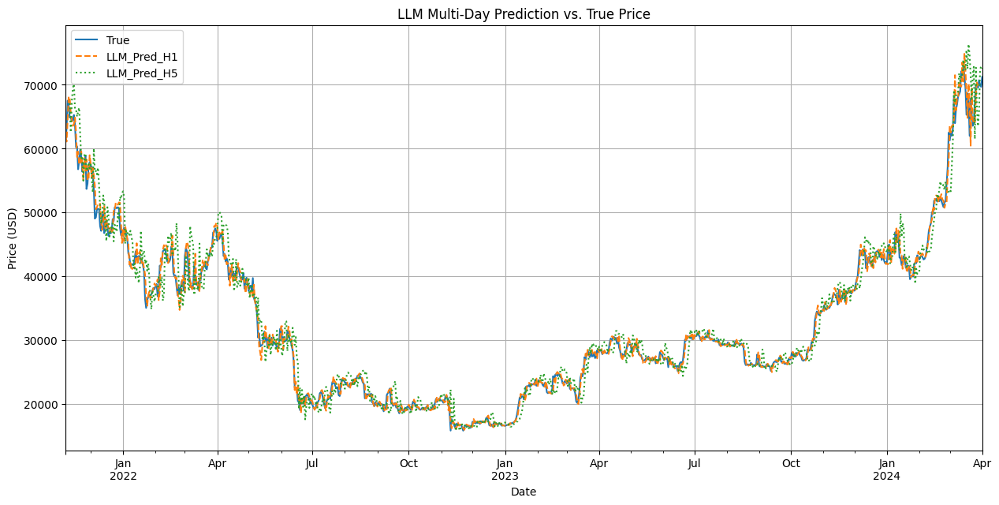

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import google.generativeai as genai
import re
import time
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from google.colab import userdata

import os
os.environ['HTTP_PROXY'] = ''
os.environ['HTTPS_PROXY'] = ''
print("--- Proxy variables cleared ---")


print("--- Libraries Imported ---")

from google.colab import userdata




# Basic parameters
N_STEPS = 60
N_PRED_DAYS = 5
TRAIN_SPLIT_PCT = 0.70

# Load data
try:
    df_final = pd.read_csv("data_with_date.csv", parse_dates=['Date'])
    df_final.set_index('Date', inplace=True)
    if not df_final.index.is_monotonic_increasing:
        print("Sorting data by date...")
        df_final.sort_index(inplace=True)
    print("File 'data_with_date.csv' loaded successfully.")
except FileNotFoundError:
    print("ERROR: File 'data_with_date.csv' not found. Please upload it to Colab.")
    df_final = pd.DataFrame()

if not df_final.empty:
    # Calculate CUTOFF_DATE based on the 70/30 split
    total_rows = len(df_final)
    split_index = int(total_rows * TRAIN_SPLIT_PCT)

    if split_index < N_STEPS:
        print(f"CRITICAL ERROR: Your 'train' split (70%) only contains {split_index} days.")
        print(f"This is insufficient for the required history (N_STEPS = {N_STEPS}).")
        print("Please reduce N_STEPS or add more data.")
        df_final = pd.DataFrame()

    elif (total_rows - split_index) < N_PRED_DAYS:
         print(f"CRITICAL ERROR: Your 'test' split (30%) is too small ({total_rows - split_index} days) to make one full 5-day prediction.")
         df_final = pd.DataFrame()
    else:

        CUTOFF_DATE = df_final.index[split_index]
        print("\n--- 70/30 Split Configuration ---")
        print(f"Total days in dataset: {total_rows}")
        print(f"Split index (70%): {split_index}")
        print(f"Cutoff date (start of 30% test set): {CUTOFF_DATE.date()}")

if not df_final.empty:


    train_df = df_final[df_final.index < CUTOFF_DATE]
    test_start_index = split_index
    history_start_index = test_start_index - N_STEPS
    evaluation_df = df_final.iloc[history_start_index:]

    print("\n--- Valid Simulation Setup ---")
    print(f"Cutoff Date (LLM knowledge stops): {CUTOFF_DATE.date()}")
    print(f"Known history (train_df) ends on: {train_df.index.max().date()} (~70%)")
    print(f"Simulation ('evaluation_df') starts with history from: {evaluation_df.index.min().date()}")
    print(f"The FIRST prediction will be for: {evaluation_df.index[N_STEPS].date()} (which is == CUTOFF_DATE)")




# API Configuration
try:
    api_key = userdata.get('BTCKEY')
    genai.configure(api_key=api_key)
    print("\nGoogle API Key successfully configured from Colab Secrets.")
    api_key_is_valid = True
except Exception as e:
    print(f"\nAPI Key configuration failed: {e}. The evaluation loop will be skipped.")
    api_key_is_valid = False


# PROMPT

def serialize_data_for_llm(data_slice):
    """
    Converts a DataFrame slice into a richer text string for the LLM.
    (This function is unchanged)
    """
    text_parts = []
    columns_to_include = [
        'Open', 'High', 'Low', 'Close', 'Volume', 'Pct_change', 'MA', 'EMA', 'OBV', 'MACD', 'Signal', 'PSAR', 'gold_close', 'EPU', 'GPRD'
    ]

    if not all(col in data_slice.columns for col in columns_to_include):
        missing_cols = [col for col in columns_to_include if col not in data_slice.columns]
        raise ValueError(f"The following columns are missing from the DataFrame: {missing_cols}")

    for index in data_slice.index:
        row = data_slice.loc[index]
        daily_data = [f"D {index.strftime('%Y-%m-%d')}:"]
        for col in columns_to_include:
            if col == 'Volume':
                vol_in_mil = float(row[col]) / 1_000_000
                daily_data.append(f"V={vol_in_mil:.2f}M")
            else:
                daily_data.append(f"{col}={row[col]:.2f}")
        text_parts.append(" ".join(daily_data))
    return "; ".join(text_parts)

def create_llm_prompt(historical_data, target_dates):
    """
    Creates a stable prompt for a 5-day forecast.
    """

    one_shot_context = "D 2024-12-01: Open=70100.50 High=71500.00 Low=70050.25 Close=71200.75 V=4500.50M Pct_change=0.02 MA=69000.00 EMA=69500.00 OBV=1234567890.12 MACD=150.55 Signal=145.20 PSAR=68000.00 gold_close=2300.00 EPU=85.54 GPRD=165.62; ... etc. for 59 more days"
    one_shot_response = "71350.50, 71800.00, 71650.25, 72000.00, 71900.50"

    target_dates_str = ", ".join([d.strftime('%Y-%m-%d') for d in target_dates])

    prompt = f"""You are a financial forecasting bot. Your task is to predict the closing price for Bitcoin for the next {N_PRED_DAYS} days.
Respond with ONLY {N_PRED_DAYS} numerical values, separated by commas. Do not add any extra text.

### Example
Context: {one_shot_context}
Target Closing Prices for 2024-12-02, 2024-12-03, 2024-12-04, 2024-12-05, 2024-12-06: {one_shot_response}

### Prediction Task
Context: {serialize_data_for_llm(historical_data)}
Target Closing Prices for {target_dates_str}:
"""
    return prompt


# Evaluatuin of the "WALK-FORWARD
if api_key_is_valid and not df_final.empty:
    print(f"\n--- Starting VALIDATED 'Walk-Forward' Simulation (Data >= {CUTOFF_DATE.date()}) ---")

    llm_predictions = []


    test_range = range(len(evaluation_df) - N_STEPS - N_PRED_DAYS + 1)

    model_llm = genai.GenerativeModel('models/gemini-flash-latest')

    for i in test_range:
        history_end_index = i + N_STEPS
        prediction_end_index = history_end_index + N_PRED_DAYS

        history_unscaled = evaluation_df.iloc[i:history_end_index]
        target_dates = evaluation_df.index[history_end_index:prediction_end_index]
        true_values = evaluation_df.iloc[history_end_index:prediction_end_index]['Close']

        prompt = create_llm_prompt(history_unscaled, target_dates)

        llm_preds_float = None
        max_retries = 3
        for attempt in range(max_retries):
            try:
                response = model_llm.generate_content(prompt)
                parsed_preds = re.findall(r'-?\d+\.?\d*', response.text)

                # Checking if the LLM returned 5 numbers
                if len(parsed_preds) == N_PRED_DAYS:
                    llm_preds_float = [float(p) for p in parsed_preds]
                    break
                else:
                    raise ValueError(f"Expected {N_PRED_DAYS} predictions, but got {len(parsed_preds)}: '{response.text}'")

            except Exception as e:
                print(f"API call failed (Attempt {attempt + 1}/{max_retries}) for dates {target_dates[0].date()} to {target_dates[-1].date()}. Error: {e}")
                if attempt < max_retries - 1:
                    time.sleep(5)
                else:
                    print(f"Failed to predict after {max_retries} attempts for dates starting {target_dates[0].date()}.")

        if llm_preds_float:
            print(f"Prediction for {target_dates[0].date()} to {target_dates[-1].date()}: Success")

            # Stores all 5 predictions
            for j in range(N_PRED_DAYS):
                llm_predictions.append({
                    'Date': target_dates[j],
                    'True': true_values.iloc[j],
                    'LLM_Pred': llm_preds_float[j],
                    'Horizon': j + 1
                })

        time.sleep(10)
else:
    print("\nEvaluation loop skipped due to invalid API key or data loading error.")


# RESULTS OF THE ANALYSIS
if 'llm_predictions' in locals() and llm_predictions:
    results_df = pd.DataFrame(llm_predictions).set_index('Date')

    if not results_df.empty:
        print("\n--- Final LLM Performance by Horizon [CORRECTED METHODOLOGY] ---")

        for h in range(1, N_PRED_DAYS + 1):
            horizon_df = results_df[results_df['Horizon'] == h]
            if horizon_df.empty:
                print(f"\nNo data for Horizon {h}.")
                continue

            y_true = horizon_df['True']
            y_pred = horizon_df['LLM_Pred']

            rmse_llm = np.sqrt(mean_squared_error(y_true, y_pred))
            mae_llm = mean_absolute_error(y_true, y_pred)
            mape_llm = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
            r2_llm = r2_score(y_true, y_pred)
            bias_llm = np.mean(y_pred - y_true)

            print(f"\n--- Metrics for H={h} ({h}-day-ahead forecast) ---")
            print(f"H={h} RMSE: {rmse_llm:.4f}")
            print(f"H={h} MAE: {mae_llm:.4f}")
            print(f"H={h} MAPE: {mape_llm:.2f}%")
            print(f"H={h} R-squared (R²): {r2_llm:.4f}")
            print(f"H={h} Bias: {bias_llm:.4f}")



        # Getting the single 'True' value for each day
        true_values_plot = results_df[['True']].drop_duplicates()

        # Pivot the predictions to have Horizons as columns
        predictions_pivot = results_df.pivot(columns='Horizon', values='LLM_Pred')

        # Rename columns
        predictions_pivot.columns = [f'LLM_Pred_H{h}' for h in predictions_pivot.columns]

        # Join True values with the pivoted predictions
        plot_data = true_values_plot.join(predictions_pivot)

        # Plot True, H=1 , and H=5
        plot_columns = ['True', 'LLM_Pred_H1', 'LLM_Pred_H5']


        if 'LLM_Pred_H1' not in plot_data.columns:
            plot_columns.remove('LLM_Pred_H1')
        if 'LLM_Pred_H5' not in plot_data.columns:
            plot_columns.remove('LLM_Pred_H5')

        if len(plot_columns) > 1:
            plot_data[plot_columns].plot(
                figsize=(15, 7),
                title='LLM Multi-Day Prediction vs. True Price',
                style=['-', '--', ':']
            )
            plt.ylabel("Price (USD)")
            plt.legend()
            plt.grid(True)
            plt.show()
        else:
            print("\nCould not generate plot: not enough prediction data.")

    else:
        print("\nNo successful predictions were recorded for analysis.")
else:
    print("\nResults analysis skipped.")

--- Proxy variables cleared ---
--- Libraries Imported ---
File 'data_with_date.csv' loaded successfully.

--- 70/30 Split Configuration ---
Total days in dataset: 2923
Split index (70%): 2046
Cutoff date (start of 30% test set): 2021-11-07

--- Valid Simulation Setup ---
Cutoff Date (LLM knowledge stops): 2021-11-07
Known history (train_df) ends on: 2021-11-06 (~70%)
Simulation ('evaluation_df') starts with history from: 2021-09-08
The FIRST prediction will be for: 2021-11-21 (which is 15 days after the cutoff)

Google API Key successfully configured from Colab Secrets.

--- Starting VALIDATED 'Walk-Forward' Simulation (Direct H=15 Forecast) ---
Prediction for 2021-11-21 (H=15): Success
Prediction for 2021-11-22 (H=15): Success
Prediction for 2021-11-23 (H=15): Success
Prediction for 2021-11-24 (H=15): Success
Prediction for 2021-11-25 (H=15): Success
Prediction for 2021-11-26 (H=15): Success
Prediction for 2021-11-27 (H=15): Success
Prediction for 2021-11-28 (H=15): Success
Predictio

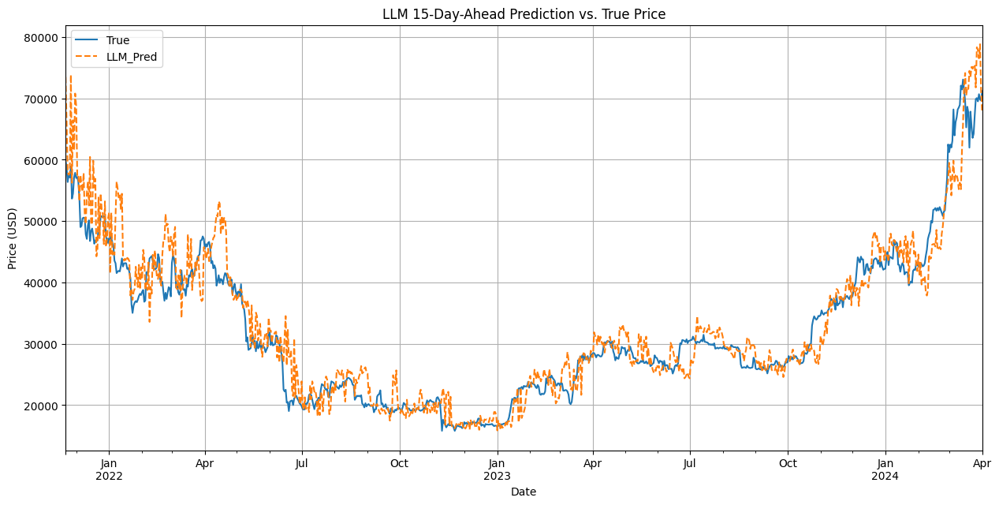

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import google.generativeai as genai
import re
import time
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from google.colab import userdata

import os
os.environ['HTTP_PROXY'] = ''
os.environ['HTTPS_PROXY'] = ''
print("--- Proxy variables cleared ---")


print("--- Libraries Imported ---")

from google.colab import userdata




# Basic parameters
N_STEPS = 60
HORIZON = 15
N_PRED_DAYS = 1
TRAIN_SPLIT_PCT = 0.70

# Load data
try:

    df_final = pd.read_csv("data_with_date.csv", parse_dates=['Date'])
    df_final.set_index('Date', inplace=True)
    if not df_final.index.is_monotonic_increasing:
        print("Sorting data by date...")
        df_final.sort_index(inplace=True)
    print("File 'data_with_date.csv' loaded successfully.")
except FileNotFoundError:
    print("ERROR: File 'data_with_date.csv' not found. Please upload it to Colab.")
    df_final = pd.DataFrame()

if not df_final.empty:
    # Calculate CUTOFF_DATE based on the 70/30 split
    total_rows = len(df_final)
    split_index = int(total_rows * TRAIN_SPLIT_PCT)

    if split_index < N_STEPS:
        print(f"CRITICAL ERROR: Your 'train' split (70%) only contains {split_index} days.")
        print(f"This is insufficient for the required history (N_STEPS = {N_STEPS}).")
        df_final = pd.DataFrame()

    elif (total_rows - split_index) < HORIZON:
         print(f"CRITICAL ERROR: Your 'test' split (30%) is too small ({total_rows - split_index} days) to make one H={HORIZON} prediction.")
         df_final = pd.DataFrame()
    else:

        CUTOFF_DATE = df_final.index[split_index]
        print("\n--- 70/30 Split Configuration ---")
        print(f"Total days in dataset: {total_rows}")
        print(f"Split index (70%): {split_index}")
        print(f"Cutoff date (start of 30% test set): {CUTOFF_DATE.date()}")

if not df_final.empty:


    train_df = df_final[df_final.index < CUTOFF_DATE]
    test_start_index = split_index
    history_start_index = test_start_index - N_STEPS
    evaluation_df = df_final.iloc[history_start_index:]

    print("\n--- Valid Simulation Setup ---")
    print(f"Cutoff Date (LLM knowledge stops): {CUTOFF_DATE.date()}")
    print(f"Known history (train_df) ends on: {train_df.index.max().date()} (~70%)")
    print(f"Simulation ('evaluation_df') starts with history from: {evaluation_df.index.min().date()}")


    first_pred_date = evaluation_df.index[N_STEPS + HORIZON - 1]
    print(f"The FIRST prediction will be for: {first_pred_date.date()} (which is {HORIZON} days after the cutoff)")


# LLM CONFIGURATION
try:
    api_key = userdata.get('BTCKEY')
    genai.configure(api_key=api_key)
    print("\nGoogle API Key successfully configured from Colab Secrets.")
    api_key_is_valid = True
except Exception as e:
    print(f"\nAPI Key configuration failed: {e}. The evaluation loop will be skipped.")
    api_key_is_valid = False


# PROMPT

def serialize_data_for_llm(data_slice):
    """
    Converts a DataFrame slice into a richer text string for the LLM.
    (This function is unchanged)
    """
    text_parts = []
    columns_to_include = [
        'Open', 'High', 'Low', 'Close', 'Volume', 'Pct_change', 'MA', 'EMA', 'OBV', 'MACD', 'Signal', 'PSAR', 'gold_close', 'EPU', 'GPRD'
    ]

    if not all(col in data_slice.columns for col in columns_to_include):
        missing_cols = [col for col in columns_to_include if col not in data_slice.columns]
        raise ValueError(f"The following columns are missing from the DataFrame: {missing_cols}")

    for index in data_slice.index:
        row = data_slice.loc[index]
        daily_data = [f"D {index.strftime('%Y-%m-%d')}:"]
        for col in columns_to_include:
            if col == 'Volume':
                vol_in_mil = float(row[col]) / 1_000_000
                daily_data.append(f"V={vol_in_mil:.2f}M")
            else:
                daily_data.append(f"{col}={row[col]:.2f}")
        text_parts.append(" ".join(daily_data))
    return "; ".join(text_parts)

def create_llm_prompt(historical_data, target_date):
    """
    Creates a stable prompt for a single H=15 forecast.
    """

    # Example shows a single H=15
    one_shot_context = "D 2024-12-01: Open=70100.50 High=71500.00 Low=70050.25 Close=71200.75 V=4500.50M Pct_change=0.02 MA=69000.00 EMA=69500.00 OBV=1234567890.12 MACD=150.55 Signal=145.20 PSAR=68000.00 gold_close=2300.00 EPU=85.54 GPRD=165.62; ... etc. for 59 more days"
    one_shot_target_date = "2024-12-16"
    one_shot_response = "74500.00"

    prompt = f"""You are a financial forecasting bot. Your task is to predict the closing price for Bitcoin for the specific day {HORIZON} days in the future.
Respond with ONLY a single numerical value. Do not add any extra text.

### Example
Context: {one_shot_context}
Target Closing Price for {one_shot_target_date}: {one_shot_response}

### Prediction Task
Context: {serialize_data_for_llm(historical_data)}
Target Closing Price for {target_date.strftime('%Y-%m-%d')}:
"""
    return prompt


# Evalution of the WALK-FORWARD
if api_key_is_valid and not df_final.empty:
    print(f"\n--- Starting VALIDATED 'Walk-Forward' Simulation (Direct H={HORIZON} Forecast) ---")

    llm_predictions = []


    test_range = range(len(evaluation_df) - N_STEPS - HORIZON + 1)

    model_llm = genai.GenerativeModel('models/gemini-flash-latest')

    for i in test_range:
        history_end_index = i + N_STEPS

        prediction_index = history_end_index + HORIZON - 1

        history_unscaled = evaluation_df.iloc[i:history_end_index]


        target_date = evaluation_df.index[prediction_index]
        true_value = evaluation_df.iloc[prediction_index]['Close']

        prompt = create_llm_prompt(history_unscaled, target_date)

        llm_preds_float = None
        max_retries = 3
        for attempt in range(max_retries):
            try:
                response = model_llm.generate_content(prompt)
                parsed_preds = re.findall(r'-?\d+\.?\d*', response.text)

                if len(parsed_preds) == N_PRED_DAYS:
                    llm_preds_float = [float(p) for p in parsed_preds]
                    break
                else:
                    raise ValueError(f"Expected {N_PRED_DAYS} prediction(s), but got {len(parsed_preds)}: '{response.text}'")

            except Exception as e:
                print(f"API call failed (Attempt {attempt + 1}/{max_retries}) for date {target_date.date()}. Error: {e}")
                if attempt < max_retries - 1:
                    time.sleep(5)
                else:
                    print(f"Failed to predict after {max_retries} attempts for {target_date.date()}.")

        if llm_preds_float:
            print(f"Prediction for {target_date.date()} (H={HORIZON}): Success")

            # Stores the single H=15 prediction
            llm_predictions.append({
                'Date': target_date,
                'True': true_value,
                'LLM_Pred': llm_preds_float[0]
            })

        time.sleep(10)
else:
    print("\nEvaluation loop skipped due to invalid API key or data loading error.")


# RESULTS OF THE ANALYSIS
if 'llm_predictions' in locals() and llm_predictions:
    results_df = pd.DataFrame(llm_predictions).set_index('Date')

    if not results_df.empty:
        y_true = results_df['True']
        y_pred = results_df['LLM_Pred']

        # Metrics
        rmse_llm = np.sqrt(mean_squared_error(y_true, y_pred))
        mae_llm = mean_absolute_error(y_true, y_pred)
        mape_llm = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
        r2_llm = r2_score(y_true, y_pred)
        bias_llm = np.mean(y_pred - y_true)

        print(f"\n--- Final LLM Performance (Direct H={HORIZON}) [CORRECTED METHODOLOGY] ---")
        print(f"LLM RMSE (Root Mean Squared Error): {rmse_llm:.4f}")
        print(f"LLM MAE (Mean Absolute Error): {mae_llm:.4f}")
        print(f"LLM MAPE (Mean Absolute Percentage Error): {mape_llm:.2f}%")
        print(f"LLM R-squared (R²): {r2_llm:.4f}")
        print(f"LLM Bias (Mean Error): {bias_llm:.4f}")

        # Visualization
        results_df[['True', 'LLM_Pred']].plot(figsize=(15, 7), title=f'LLM {HORIZON}-Day-Ahead Prediction vs. True Price', style=['-', '--'])
        plt.ylabel("Price (USD)")
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print("\nNo successful predictions were recorded for analysis.")
else:
    print("\nResults analysis skipped.")